# Project Q
* Заказчик работает с системой электронной очереди и использует часть информации для составления годового отчета.
* Нам необходимо предоставить анализ общей картины с очередью, посредством различных группировок и сортировок. 
* Файл предварительно преобразован, для общедоступной публикации, согласно запросу заказчика: из него удалены личные данные сотрудников и посетителей, а названия офисов подверглись шифрованию.

## Структура файла
* Структура файла выглядит так:
    * `Офис` - зашифрованные наименования офисов
    * `Номер талона` - талон посетителя который выдан ему для очереди
    * `Регистрация` - дата и время выдачи талона посетителю
    * `Вызван на обслуживание` - фактическая дата и время вызова посетителя на обслуживание
    * `Время начала обслуживания` - фактическое дата и время начала обслуживания
    * `Категория операции`: зашифрованное наименование талона
    * `Ожидание` - время ожидания в очереди, до вызова талона на обслуживание.
    * `Ожидание подхода клиента` - время которое прошло между вызовом на обслуживание и началом обслуживания посетителя
    * `Обслуживание` - время за которое был обслужен посетитель
    * `Окно` - номер окна к которому вызван посетитель
    * `Тип регистрации` - способ записи на прием, с определением приоритета
    * `Тип вызова` - каким образом вызван посетитель к окну.
    * `Время окончания обслуживания` - зафиксированное время завершения обслуживания посетителя
    * `Статус` - отражает текущее положение или состояние посетителя.
    * `Номер_оператора` - зашифрованный номер оператора, за которым скрывается ФИО

# Ознакомление с данными

## Загрузка библиотек и общий взгляд

In [1]:
#грузим все необходимые библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from difflib import SequenceMatcher
import calendar
import os
import re
from datetime import datetime, time

In [2]:
#загружаем файл
data = pd.read_csv('project_q2.csv')

C:\Users\Petr\AppData\Local\Temp\ipykernel_17072\976886244.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('project_q2.csv')


In [3]:
#смотрим информацию по датафрейму
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 456629 entries, 0 to 456628
Data columns (total 16 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   Офис                          456629 non-null  object
 1   Номер талона                  456629 non-null  object
 2   Тип талона                    456629 non-null  object
 3   Регистрация                   456629 non-null  object
 4   Вызван на обслуживание        456381 non-null  object
 5   Время начала обслуживания     426522 non-null  object
 6   Категория операции            456629 non-null  object
 7   Ожидание                      456629 non-null  object
 8   Ожидание подхода клиента      456629 non-null  object
 9   Обслуживание                  456629 non-null  object
 10  Окно                          456629 non-null  object
 11  Тип регистрации               456629 non-null  object
 12  Тип вызова                    456629 non-null  object
 13 

In [4]:
#приглядываемся к первым 5 строкам
data.head()

,Офис,Номер талона,Тип талона,Регистрация,Вызван на обслуживание,Время начала обслуживания,Категория операции,Ожидание,Ожидание подхода клиента,Обслуживание,Окно,Тип регистрации,Тип вызова,Время окончания обслуживания,Статус,Номер_оператора
0,ЖОР,Т001,Обычный,09.01.2023 09:03:00,09.01.2023 09:03:04,09.01.2023 09:03:42,Т30,00:00:04,00:00:38,00:18:10,Окно 5,Первичная,Авт. вызов,09.01.2023 09:21:52,Обслужен,-1
1,ЖОР,Т002,Обычный,09.01.2023 09:03:15,09.01.2023 09:03:19,09.01.2023 09:03:55,Т30,00:00:04,00:00:36,00:19:55,Окно 4,Первичная,Авт. вызов,09.01.2023 09:23:50,Обслужен,0
2,ЖОР,У001,Обычный,09.01.2023 09:37:40,09.01.2023 09:37:46,09.01.2023 09:37:48,1У54,00:00:06,00:00:02,00:09:41,Окно 7,Первичная,Авт. вызов,09.01.2023 09:47:29,Обслужен,1
3,ЖОР,А001,Обычный,09.01.2023 09:20:17,09.01.2023 09:21:59,09.01.2023 09:23:30,П9,00:01:42,00:01:31,00:29:06,Окно 5,Первичная,Вызов по номеру,09.01.2023 09:52:36,Обслужен,-1
4,ЖОР,Е001,Обычный,09.01.2023 09:44:41,09.01.2023 09:47:34,09.01.2023 09:53:10,1Е13,00:02:53,00:05:36,00:06:12,Окно 7,Первичная,Вызов по номеру,09.01.2023 09:59:22,Обслужен,1


In [5]:
#столбцов много, и будет больше, снимем ограничение на отображение столбцов
pd.options.display.max_columns = None

In [6]:
#отсортируем по столбцу регистрации
data = data.sort_values('Регистрация', ascending=False)

## Ознакомление со столбцами
### Офис

In [7]:
#проверим все значения присутствущие в столбце "Офис"
data['Офис'].unique()

array(['ГО', '203', '123', 'ДОР', 'ЖОР', 'ЯРИ', 123, 'ВИН'], dtype=object)

In [8]:
#посчитаем их уникальные значения
data['Офис'].nunique()

8

Видим ошибку, вывод двух 123 и '123', объединим их путем переименования.

In [9]:
#исправляем ошибку путем переименования
data['Офис'] = data['Офис'].replace({123: '123'})

In [10]:
#проверим все значения присутствущие в столбце "Офис"
data['Офис'].unique()

array(['ГО', '203', '123', 'ДОР', 'ЖОР', 'ЯРИ', 'ВИН'], dtype=object)

In [11]:
#посчитаем их уникальные значения
data['Офис'].nunique()

7

In [12]:
#посчитаем сколько строк приходится на каждый офис
data['Офис'].value_counts()

ГО     232677
123     79116
ЯРИ     43199
203     41985
ЖОР     35150
ДОР     20535
ВИН      3967
Name: Офис, dtype: int64

In [13]:
#посчитаем пустые строки в столбце "Офис"
data['Офис'].isna().sum()

0

### Категория операции	

In [14]:
#посмотрим какие есть уникальные названия талонов
data['Категория операции'].unique()

array(['Т30', 'В31', 'Е93', 'Э44', 'О17', 'П9', 'Д33', 'У91', 'К96',
       'ЮЛ86', '1У54', 'ЯВ66', '1В20', '1М37', 'С73', 'Ф7', 'Л115',
       'ФЛ85', '1Е13', '2В113', 'ХСВ101', '1Д11', 'Р63', '1Б12', 'ГК117',
       'НД109', 'Я57', 'М15', 'ЖКУ64', 'Б116', 'БД112', 'Ц67', 'ПГ104',
       'ДО103', 'СС106', 'СВ95', 'МС108', 'ВТ105', 'ЭДД87', 'Ж10', 'КЖ70',
       '1Ю36', 'ПМ97', 'ПС107', 'НФ49', 'СК71', 'КБ89', 'ВБ58', 'ДУ110',
       'Ц75', 'БП77', 'тп114'], dtype=object)

In [15]:
#проверим названия талонов после удаления значений внутри скобок
data['Категория операции'].nunique()

52

In [16]:
#посчитаем сколько строк приходится на различные талоны
data['Категория операции'].value_counts()

Т30       92600
1В20      77942
П9        63045
В31       42913
1У54      32879
С73       30774
Ф7        15518
У91       13570
1Д11      10190
1Е13       9039
О17        8751
Л115       7647
Д33        4907
ЮЛ86       4445
Е93        4232
ФЛ85       4026
Э44        3783
СС106      2821
БД112      2546
ПГ104      2472
Я57        2045
М15        1732
1Б12       1724
ДО103      1708
МС108      1573
ЯВ66       1521
1Ю36       1413
Ц67        1411
СВ95       1395
ХСВ101     1102
ГК117       954
Б116        772
К96         750
Р63         602
2В113       553
ЖКУ64       464
Ж10         459
КЖ70        456
1М37        382
ЭДД87       327
ВТ105       320
ВБ58        228
СК71        160
КБ89        151
НД109       120
ПС107        74
ПМ97         60
БП77         35
ДУ110        15
НФ49         14
тп114         8
Ц75           1
Name: Категория операции, dtype: int64

In [17]:
#посмотрим имеются ли пропуске в этом столбце
data['Категория операции'].isna().sum()

0

### Тип регистрации

In [18]:
#просмотрим уникальные типы регистраций
data['Тип регистрации'].unique()

array(['Первичная', 'Перевод на окно', 'Вызов отложенного'], dtype=object)

In [19]:
#количество уникальных значений в столбце
data['Тип регистрации'].nunique()

3

In [20]:
#количество типов регистраций в разрезе уникальных типов.
data['Тип регистрации'].value_counts()

Первичная            454637
Перевод на окно        1642
Вызов отложенного       350
Name: Тип регистрации, dtype: int64

In [21]:
#пустые строк в столбце
data['Тип регистрации'].isna().sum()

0

### Тип вызова

In [22]:
#просмотрим уникальные типов вызова
data['Тип вызова'].unique()

array(['Вызов по номеру', 'Авт. вызов'], dtype=object)

In [23]:
#количество уникальных значений в столбце
data['Тип вызова'].nunique()

2

In [24]:
#количество типов вызова в разрезе уникальных типов.
data['Тип вызова'].value_counts()

Авт. вызов         410829
Вызов по номеру     45800
Name: Тип вызова, dtype: int64

In [25]:
#пустые строк в столбце
data['Тип вызова'].isna().sum()

0

### Статус

In [26]:
#просмотрим уникальные статусы
data['Статус'].unique()

array(['Обслужен', 'Сброшен', 'Переведен в другое окно', 'Отложен'],
      dtype=object)

In [27]:
#количество уникальных значений в столбце
data['Статус'].nunique()

4

In [28]:
#количество различных статусов в столбце
data['Статус'].value_counts()

Обслужен                   424905
Сброшен                     29731
Переведен в другое окно      1642
Отложен                       351
Name: Статус, dtype: int64

In [29]:
#пустые строк в столбце
data['Статус'].isna().sum()

0

## Промежуточный итог:
* По файлу мы видим что имеется 16 столбцов и 456629 строк. Описание файла совпадает с тем что мы видим, но требуют внимания столбцы:
    * `Регистрация`, `Вызван на обслуживание`, `Время начала обслуживания`, `Ожидание`, `Ожидание подхода клиента`, `Обслуживание`, `Время окончания обслуживания` необходимо преобразовать из типа object  во временные типы.
    * `Вызван на обслуживание`, `Время начала обслуживания`, `Время окончания обслуживания` имеют чуть меньше строк чем остальные столбцы, т.е. имеются пустоты, по возможности их необходимо подсчитать и заполнить.
* Так же можем отметить что большая часть талонов выдана в ГО, 232677 из 456629
* В офисах мы обнаружили дублирование офиса 123, объединили их путем переименования.
* Имеется 52 различных видов талонов
* Имеется 3 вида регистрации, необходима консультация с заказчиком и обсудить что обозначают эти типы.
* Как и указано в описании файла, имеются 2 вида вызова посетителя в окно. 
    * Авт. Вызов - 410829 талонов
    * Вызов по номеру - 45800 талонов
* В статусе, как и указанов описании файла, имеются 3 вида:
    * Обслужен - 424905 талонов
    * Сброшен - 29731 талонов
    * Переведен в другое окно - 1642 талонов
    * Отложен - 351 талонов
* Так же имеется информация от заказчика, что операторы 6, 74, 75, 76, 77, 119 не относятся к исследованию т.к. это тесты зафиксированные в системе. Еще необходимо удалить офис ВИН, т.к. он был закрыт и не будет фигурировать в отчетах.

# Предобработка данных
### Стиль наименований столбцов

In [30]:
#приводим наименования столбцов к нижнему регистру
data.columns = data.columns.str.lower()

In [31]:
#теперь название столбцов приведем к "змеиному_регистру"
data.columns = data.columns.str.replace(' ', '_')

In [32]:
#проверяем
data.columns

Index(['офис', 'номер_талона', 'тип_талона', 'регистрация',
       'вызван_на_обслуживание', 'время_начала_обслуживания',
       'категория_операции', 'ожидание', 'ожидание_подхода_клиента',
       'обслуживание', 'окно', 'тип_регистрации', 'тип_вызова',
       'время_окончания_обслуживания', 'статус', 'номер_оператора'],
      dtype='object')

## Время


In [33]:
data.head()

,офис,номер_талона,тип_талона,регистрация,вызван_на_обслуживание,время_начала_обслуживания,категория_операции,ожидание,ожидание_подхода_клиента,обслуживание,окно,тип_регистрации,тип_вызова,время_окончания_обслуживания,статус,номер_оператора
378333,ГО,Т227,Обычный,31.10.2023 17:54:24,31.10.2023 18:16:41,31.10.2023 18:17:13,Т30,00:22:17,00:00:32,00:11:48,Окно 15,Первичная,Вызов по номеру,31.10.2023 18:29:01,Обслужен,72
378321,ГО,В212,Обычный,31.10.2023 17:52:42,31.10.2023 17:55:43,31.10.2023 17:56:27,В31,00:03:01,00:00:44,00:18:47,Окно 3,Первичная,Авт. вызов,31.10.2023 18:15:14,Обслужен,138
174101,203,В068,Обычный,31.10.2023 17:51:36,31.10.2023 17:51:58,31.10.2023 17:52:09,В31,00:00:22,00:00:11,00:08:59,Окно 6,Первичная,Вызов по номеру,31.10.2023 18:01:08,Обслужен,116
378325,ГО,В211,Обычный,31.10.2023 17:51:19,31.10.2023 17:53:36,31.10.2023 17:54:37,В31,00:02:17,00:01:01,00:25:47,Окно 1,Первичная,Авт. вызов,31.10.2023 18:20:24,Обслужен,122
378303,ГО,В210,Обычный,31.10.2023 17:48:51,31.10.2023 17:53:06,31.10.2023 17:53:32,В31,00:04:15,00:00:26,00:02:05,Окно 3,Первичная,Авт. вызов,31.10.2023 17:55:37,Обслужен,138


In [34]:
#составляем список столбцов к преобразованию. 
#date_columns = ['регистрация', 'вызван_на_обслуживание', 'время_начала_обслуживания', 'время_окончания_обслуживания']
#меняем тип данных datetime
#data[date_columns] = pd.to_datetime(data[date_columns], format='%Y-%m-%d %H:%M:%S')

data['регистрация'] = pd.to_datetime(data['регистрация'], format='%d.%m.%Y %H:%M:%S')

In [35]:
data['вызван_на_обслуживание'] = pd.to_datetime(data['вызван_на_обслуживание'], format='%d.%m.%Y %H:%M:%S')

In [36]:
data['время_начала_обслуживания'] = pd.to_datetime(data['время_начала_обслуживания'], format='%d.%m.%Y %H:%M:%S')

In [37]:
data['время_окончания_обслуживания'] = pd.to_datetime(data['время_окончания_обслуживания'], format='%d.%m.%Y %H:%M:%S')

In [38]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456629 entries, 378333 to 195243
Data columns (total 16 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   офис                          456629 non-null  object        
 1   номер_талона                  456629 non-null  object        
 2   тип_талона                    456629 non-null  object        
 3   регистрация                   456629 non-null  datetime64[ns]
 4   вызван_на_обслуживание        456381 non-null  datetime64[ns]
 5   время_начала_обслуживания     426522 non-null  datetime64[ns]
 6   категория_операции            456629 non-null  object        
 7   ожидание                      456629 non-null  object        
 8   ожидание_подхода_клиента      456629 non-null  object        
 9   обслуживание                  456629 non-null  object        
 10  окно                          456629 non-null  object        
 11  тип_реги

In [39]:
#создадим отдельный столбец с датой, днем недели и месяцем
data['дата'] = data['регистрация'].dt.date
data['день_недели'] = data['регистрация'].dt.day_name()
data['номер_недели'] = data['регистрация'].dt.isocalendar().week
data['месяц'] = data['регистрация'].dt.month_name()

In [40]:
data['день_недели'].value_counts()

Tuesday      96622
Wednesday    96161
Thursday     85445
Friday       83906
Monday       71830
Saturday     22665
Name: день_недели, dtype: int64

In [41]:
data.isna().sum()

офис                                0
номер_талона                        0
тип_талона                          0
регистрация                         0
вызван_на_обслуживание            248
время_начала_обслуживания       30107
категория_операции                  0
ожидание                            0
ожидание_подхода_клиента            0
обслуживание                        0
окно                                0
тип_регистрации                     0
тип_вызова                          0
время_окончания_обслуживания       32
статус                              0
номер_оператора                     0
дата                                0
день_недели                         0
номер_недели                        0
месяц                               0
dtype: int64

In [42]:
# Список столбцов для преобразования
time_column = ['ожидание', 'ожидание_подхода_клиента', 'обслуживание']
# Преобразование значений в timedelta
data[time_column] = data[time_column].apply(pd.to_timedelta, errors='coerce')

In [43]:
#создаем 3 дополнительных столбца, с подсчетом времени в секундах для удобства расчетов
data['сек_ожидание'] = data['ожидание'].dt.total_seconds()
data['сек_ожидание_подхода_клиента'] = data['ожидание_подхода_клиента'].dt.total_seconds()
data['сек_обслуживание'] = data['обслуживание'].dt.total_seconds()
data['мин_ожидание'] = round(data['ожидание'].dt.total_seconds() / 60, 2)
data['мин_ожидание_подхода_клиента'] = round(data['ожидание_подхода_клиента'].dt.total_seconds() / 60, 2)
data['мин_обслуживание'] = round(data['обслуживание'].dt.total_seconds() / 60, 2)

In [44]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456629 entries, 378333 to 195243
Data columns (total 26 columns):
 #   Column                        Non-Null Count   Dtype          
---  ------                        --------------   -----          
 0   офис                          456629 non-null  object         
 1   номер_талона                  456629 non-null  object         
 2   тип_талона                    456629 non-null  object         
 3   регистрация                   456629 non-null  datetime64[ns] 
 4   вызван_на_обслуживание        456381 non-null  datetime64[ns] 
 5   время_начала_обслуживания     426522 non-null  datetime64[ns] 
 6   категория_операции            456629 non-null  object         
 7   ожидание                      456629 non-null  timedelta64[ns]
 8   ожидание_подхода_клиента      456629 non-null  timedelta64[ns]
 9   обслуживание                  456626 non-null  timedelta64[ns]
 10  окно                          456629 non-null  object         


* Можно заполнить пустоты расчетами:
    * 'время_начала_обслуживания' = 'регистрация' + 'ожидание'
    * 'время_окончания_обслуживания' = 'время_начала_обслуживания' + 'обслуживание'
    * 'вызван_на_обслуживание' = 'регистрация' + 'ожидание'
    * 'обслуживание' = 'время_окончания_обслуживания' - 'время_начала_обслуживания'
* А столбцы 'сек_обслуживание' и 'мин_обслуживание' заполним преобразованием 

In [45]:
#заполняем пустоты расчетами
data['время_начала_обслуживания'].fillna(data['регистрация'] + data['ожидание'], inplace=True)
data['время_окончания_обслуживания'].fillna(data['время_начала_обслуживания'] + data['обслуживание'], inplace=True)
data['вызван_на_обслуживание'].fillna(data['регистрация'] + data['ожидание'], inplace=True)
data['обслуживание'].fillna(data['время_окончания_обслуживания'] - data['время_начала_обслуживания'], inplace=True)
data['сек_обслуживание'].fillna(data['обслуживание'].dt.total_seconds(), inplace=True)
data['мин_обслуживание'].fillna(round(data['обслуживание'].dt.total_seconds() / 60, 2), inplace=True)

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 456629 entries, 378333 to 195243
Data columns (total 26 columns):
 #   Column                        Non-Null Count   Dtype          
---  ------                        --------------   -----          
 0   офис                          456629 non-null  object         
 1   номер_талона                  456629 non-null  object         
 2   тип_талона                    456629 non-null  object         
 3   регистрация                   456629 non-null  datetime64[ns] 
 4   вызван_на_обслуживание        456629 non-null  datetime64[ns] 
 5   время_начала_обслуживания     456629 non-null  datetime64[ns] 
 6   категория_операции            456629 non-null  object         
 7   ожидание                      456629 non-null  timedelta64[ns]
 8   ожидание_подхода_клиента      456629 non-null  timedelta64[ns]
 9   обслуживание                  456629 non-null  timedelta64[ns]
 10  окно                          456629 non-null  object         


In [47]:
#создадим отдельный столбец с датой, днем недели и месяцем
data['дата'] = data['регистрация'].dt.date
data['день_недели'] = data['регистрация'].dt.day_name()
data['номер_недели'] = data['регистрация'].dt.isocalendar().week
data['месяц'] = data['регистрация'].dt.month_name()

In [48]:
#т.к. основной измеритель даты и времени уже в нужном формате, рассмотрим период предоставленных данных
display(f"Начало наблюдения {data['регистрация'].min()}")
display(f"Конец наблюдения {data['регистрация'].max()}")

'Начало наблюдения 2023-01-05 12:26:56'

'Конец наблюдения 2023-12-27 19:37:18'

In [49]:
#просмотрим для каждого офиса
for office in data['офис'].unique():
    start_reg = data[data['офис'] == office]['регистрация'].min()
    end_reg = data[data['офис'] == office]['регистрация'].max()
    print(f"Для офиса {office} начало записей идет с {start_reg} по {end_reg}")

Для офиса ГО начало записей идет с 2023-01-05 12:26:56 по 2023-12-27 19:29:34
Для офиса 203 начало записей идет с 2023-01-09 08:56:50 по 2023-12-27 19:29:54
Для офиса 123 начало записей идет с 2023-01-09 08:50:30 по 2023-12-27 19:36:29
Для офиса ДОР начало записей идет с 2023-01-09 09:00:50 по 2023-12-27 18:51:33
Для офиса ЖОР начало записей идет с 2023-01-09 09:03:00 по 2023-12-27 19:37:18
Для офиса ЯРИ начало записей идет с 2023-01-09 09:01:02 по 2023-12-27 17:09:38
Для офиса ВИН начало записей идет с 2023-01-09 15:58:07 по 2023-05-27 16:54:14


In [50]:
data.isna().sum()

офис                            0
номер_талона                    0
тип_талона                      0
регистрация                     0
вызван_на_обслуживание          0
время_начала_обслуживания       0
категория_операции              0
ожидание                        0
ожидание_подхода_клиента        0
обслуживание                    0
окно                            0
тип_регистрации                 0
тип_вызова                      0
время_окончания_обслуживания    0
статус                          0
номер_оператора                 0
дата                            0
день_недели                     0
номер_недели                    0
месяц                           0
сек_ожидание                    0
сек_ожидание_подхода_клиента    0
сек_обслуживание                0
мин_ожидание                    0
мин_ожидание_подхода_клиента    0
мин_обслуживание                0
dtype: int64

## Дубликаты

In [51]:
#выявляем явные дубликаты
data.duplicated().sum()

0

## Дополнительный дроп

In [52]:
#составляем списки на удаление
operators_to_remove = [6, 74, 75, 76, 77, 119]
office_to_remove = "ВИН"

#удаляем некоторых операторов и офис ВИН
data = data[~data['номер_оператора'].isin(operators_to_remove)]
data = data[data['офис'] != office_to_remove]

## Выбросы

In [53]:
#проверим сколько талонов ожидали более 4 часов (14400 секунд)
long_wait = data[data['сек_ожидание'] > 14400]
len(long_wait)

1060

In [54]:
long_walk = data[data['сек_ожидание_подхода_клиента'] > 60]
len(long_walk)

64821

In [55]:
long_walk_fast_serv = long_walk[long_walk['сек_обслуживание']<30]
len(long_walk_fast_serv)

3508

In [56]:
long_walk_fast_serv

,офис,номер_талона,тип_талона,регистрация,вызван_на_обслуживание,время_начала_обслуживания,категория_операции,ожидание,ожидание_подхода_клиента,обслуживание,окно,тип_регистрации,тип_вызова,время_окончания_обслуживания,статус,номер_оператора,дата,день_недели,номер_недели,месяц,сек_ожидание,сек_ожидание_подхода_клиента,сек_обслуживание,мин_ожидание,мин_ожидание_подхода_клиента,мин_обслуживание
378262,ГО,1В022,Обычный,2023-10-31 17:22:44,2023-10-31 17:25:01,2023-10-31 17:26:16,1В20,0 days 00:02:17,0 days 00:01:15,0 days 00:00:18,Окно 3,Первичная,Авт. вызов,2023-10-31 17:26:34,Обслужен,138,2023-10-31,Tuesday,44,October,137.0,75.0,18.0,2.28,1.25,0.30
378235,ГО,Ф037,Обычный,2023-10-31 17:05:17,2023-10-31 17:06:33,2023-10-31 17:08:42,Ф7,0 days 00:01:16,0 days 00:02:09,0 days 00:00:05,Окно 2,Первичная,Авт. вызов,2023-10-31 17:08:47,Обслужен,159,2023-10-31,Tuesday,44,October,76.0,129.0,5.0,1.27,2.15,0.08
174055,203,Е007,Обычный,2023-10-31 16:17:26,2023-10-31 16:19:54,2023-10-31 16:21:18,Е93,0 days 00:02:28,0 days 00:01:24,0 days 00:00:25,Окно 0,Первичная,Авт. вызов,2023-10-31 16:21:43,Обслужен,117,2023-10-31,Tuesday,44,October,148.0,84.0,25.0,2.47,1.40,0.42
378123,ГО,П050,Обычный,2023-10-31 15:53:42,2023-10-31 15:57:48,2023-10-31 16:05:29,П9,0 days 00:04:06,0 days 00:07:41,0 days 00:00:00,Окно 18,Первичная,Авт. вызов,2023-10-31 16:05:29,Обслужен,112,2023-10-31,Tuesday,44,October,246.0,461.0,0.0,4.10,7.68,0.00
377975,ГО,К006,Обычный,2023-10-31 14:36:17,2023-10-31 14:38:25,2023-10-31 14:41:53,К96,0 days 00:02:08,0 days 00:03:28,0 days 00:00:16,Окно 53,Первичная,Авт. вызов,2023-10-31 14:42:09,Обслужен,171,2023-10-31,Tuesday,44,October,128.0,208.0,16.0,2.13,3.47,0.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195498,ГО,В096,Обычный,2023-02-01 11:54:38,2023-02-01 11:59:57,2023-02-01 12:00:59,1В20,0 days 00:05:19,0 days 00:01:02,0 days 00:00:24,Окно 8,Первичная,Авт. вызов,2023-02-01 12:01:23,Обслужен,-1,2023-02-01,Wednesday,5,February,319.0,62.0,24.0,5.32,1.03,0.40
415567,ЯРИ,ФЛ005,Обычный,2023-02-01 11:50:07,2023-02-01 11:50:18,2023-02-01 11:51:46,ФЛ85,0 days 00:00:11,0 days 00:01:28,0 days 00:00:03,Окно 7,Первичная,Авт. вызов,2023-02-01 11:51:49,Обслужен,205,2023-02-01,Wednesday,5,February,11.0,88.0,3.0,0.18,1.47,0.05
39498,123,У007,Обычный,2023-02-01 11:16:54,2023-02-01 11:23:37,2023-02-01 11:25:27,1У54,0 days 00:06:43,0 days 00:01:50,0 days 00:00:05,Окно 20,Первичная,Авт. вызов,2023-02-01 11:25:32,Обслужен,40,2023-02-01,Wednesday,5,February,403.0,110.0,5.0,6.72,1.83,0.08
195399,ГО,К001,Обычный,2023-02-01 10:49:31,2023-02-01 10:57:01,2023-02-01 11:07:21,К96,0 days 00:07:30,0 days 00:10:20,0 days 00:00:01,Окно 53,Первичная,Авт. вызов,2023-02-01 11:07:22,Обслужен,165,2023-02-01,Wednesday,5,February,450.0,620.0,1.0,7.50,10.33,0.02


In [57]:
#сделаем цикл, по которому максимальное ожидание, если человек был обслужен, будет 60 сек, а избыток добавим в обслуживание. 
for index, row in data.iterrows():
    if row['статус'] == 'Обслужен' and row['сек_ожидание_подхода_клиента'] > 60:
        excess_seconds = row['сек_ожидание_подхода_клиента'] - 60
        data.at[index, 'сек_обслуживание'] += excess_seconds
        data.at[index, 'сек_ожидание_подхода_клиента'] = 60

In [58]:
#исправляем значения обслуживания и ожидания подхода
data['обслуживание'] = pd.to_timedelta(data['сек_обслуживание'], unit='s')
data['ожидание_подхода_клиента'] = pd.to_timedelta(data['сек_ожидание_подхода_клиента'], unit='s')

In [59]:
#проверяем что получилось
display(f'Дольше 60 секунд к окну шли {len(data[data["сек_ожидание_подхода_клиента"] > 60])} талонов.')
display(f'Что составляет {round(len(data[data["сек_ожидание_подхода_клиента"] > 60])/len(data)*100, 2)}% всех талонов.')

'Дольше 60 секунд к окну шли 177 талонов.'

'Что составляет 0.04% всех талонов.'

In [60]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 450939 entries, 378333 to 195243
Data columns (total 26 columns):
 #   Column                        Non-Null Count   Dtype          
---  ------                        --------------   -----          
 0   офис                          450939 non-null  object         
 1   номер_талона                  450939 non-null  object         
 2   тип_талона                    450939 non-null  object         
 3   регистрация                   450939 non-null  datetime64[ns] 
 4   вызван_на_обслуживание        450939 non-null  datetime64[ns] 
 5   время_начала_обслуживания     450939 non-null  datetime64[ns] 
 6   категория_операции            450939 non-null  object         
 7   ожидание                      450939 non-null  timedelta64[ns]
 8   ожидание_подхода_клиента      450939 non-null  timedelta64[ns]
 9   обслуживание                  450939 non-null  timedelta64[ns]
 10  окно                          450939 non-null  object         


**Промежуточный итог:**  
* Привели наименования столбцов к змеиному шрифту заменив пробелы на нижние подчеркивания, а также приведя к нижнему регистру
* Столбцы даты и времени:
    * 'регистрация', 'вызван_на_обслуживание', 'время_начала_обслуживания', 'время_окончания_обслуживания' - приведены к типу datetime64
    * 'дата', 'день_недели', 'номер_недели', 'месяц' - добавлены новые столбцы для дальнешейго применения в работе
    * 'ожидание', 'ожидание_подхода_клиента', 'обслуживание' - приведены к типу timedelta64
    * 'сек_ожидание', 'сек_ожидание_подхода_клиента', 'сек_обслуживание', 'мин_ожидание ', 'мин_ожидание_подхода_клиента', 'мин_обслуживание ' - созданы новые столбцы для дальнейшего применения в работе
* Выяснили начало и конец наблюдения в каждом офисе:
>Для офиса ГО начало записей идет с 2023-01-05 12:26:56 по 2023-12-27 19:29:34  
>Для офиса 203 начало записей идет с 2023-01-09 08:56:50 по 2023-12-27 19:29:54  
>Для офиса 123 начало записей идет с 2023-01-09 08:50:30 по 2023-12-27 19:36:29  
>Для офиса ДОР начало записей идет с 2023-01-09 09:00:50 по 2023-12-27 18:51:33  
>Для офиса ЖОР начало записей идет с 2023-01-09 09:03:00 по 2023-12-27 19:37:18  
>Для офиса ЯРИ начало записей идет с 2023-01-09 09:01:02 по 2023-12-27 17:09:38  
>Для офиса ВИН начало записей идет с 2023-01-09 15:58:07 по 2023-05-27 16:54:14  
* Пропуски обнаружены в нижеприведенных столбцах и полностью заполнены, т.к. мы знаем исходные данные.
    * вызван_на_обслуживание            248  
    * время_начала_обслуживания       30107  
    * обслуживание                        3  
    * время_окончания_обслуживания       32  
    * сек_обслуживание                    3  
    * мин_обслуживание                    3  
* Явных дубликатов в данных не обнаружено
* Удалены операторы 6, 74, 75, 76, 77, 119, а так же офис ВИН, так они не нужны заказчику. 
* С выбросами не стали ничего делать т.к. 1060 строк не сильно повлияют на наше исследование. Но все же исправили излишки времени ожидания клиента, перекинув часть времени в обслуживание. 

# Исследовательский анализ данных
## Подготовка датафреймов

In [61]:
# Создаем фрейм, где только обслуженные и сброшенные талоны
served_data = data[data['статус'] == 'Обслужен'].copy()
dropped_data = data[data['статус'] == 'Сброшен'].copy()

# Делим по офисам
go_office = data[data['офис'] == 'ГО'].copy()
ott_office = data[data['офис'] == '123'].copy()
yari_office = data[data['офис'] == 'ЯРИ'].copy()
jor_office = data[data['офис'] == 'ЖОР'].copy()
tzt_office = data[data['офис'] == '203'].copy()
dor_office = data[data['офис'] == 'ДОР'].copy()
vin_office = data[data['офис'] == 'ВИН'].copy()

# Порядок дней недели для будущего построения графиков
order_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Устанавливаем порядок месяцев
months_order = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
served_data['месяц'] = pd.Categorical(served_data['месяц'], categories=months_order, ordered=True)

In [62]:
#создаем фреймы где только обслуженные 
go_office_served = served_data[served_data['офис'] == 'ГО']
ott_office_served = served_data[served_data['офис'] == '123']
yari_office_served = served_data[served_data['офис'] == 'ЯРИ']
jor_office_served = served_data[served_data['офис'] == 'ЖОР']
tzt_office_served = served_data[served_data['офис'] == '203']
dor_office_served = served_data[served_data['офис'] == 'ДОР']
vin_office_served = served_data[served_data['офис'] == 'ВИН']

## Анализ статусов талонов
### Общее соотношение статусов талонов

In [63]:
#посчитаем количество обслуженных и иных статусов и их % в датафрейме
status_counts = data['статус'].value_counts()
status_percentages = (data['статус'].value_counts(normalize=True) * 100).round(2).map('{:.2f}%'.format)

#создадим новый датафрейм
status_df = pd.DataFrame({'количество': status_counts, 'проценты': status_percentages})

#выводим
status_df

,количество,проценты
Обслужен,419694,93.07%
Сброшен,29405,6.52%
Переведен в другое окно,1489,0.33%
Отложен,351,0.08%


* 93.07% (419 694) всех талонов были обслужены
* 6.52% (29 405) всех талонов были сброшены (т.е. клиенты не подошли к окну)
* 0.33% (1 489) всех талонов были переведены к другому окну для дальнейшего обслуживания.
* 0.08% (351) талонов был отложен.

### Соотношение статуса талонов в зависимости от офиса

In [64]:
def process_office_status_data(office_name, office_df):
    status_counts = office_df['статус'].value_counts()
    status_percentages = (office_df['статус'].value_counts(normalize=True) * 100).round(2).map('{:.2f}%'.format)

    status_data = pd.DataFrame({'количество': status_counts, 'проценты': status_percentages})
    status_data.columns = [f'Статус талонов в офисе {office_name}', f'Процентное соотношение обращений в офисе {office_name}']

    return status_data

offices = {
    'ГО': (go_office, go_office_served),
    '123': (ott_office, ott_office_served),
    'ЯРИ': (yari_office, yari_office_served),
    'ЖОР': (jor_office, jor_office_served),
    '203': (tzt_office, tzt_office_served),
    'ДОР': (dor_office, dor_office_served),
}

# Создаем словарь с данными по офисам
office_status_data = {}
for office_name, (office_df, _) in offices.items():
    status_data = process_office_status_data(office_name, office_df)
    office_status_data[office_name] = status_data

# Объединяем все данные по статусам
all_office_status_data = pd.concat(office_status_data.values(), axis=1)

In [65]:
all_office_status_data

,Статус талонов в офисе ГО,Процентное соотношение обращений в офисе ГО,Статус талонов в офисе 123,Процентное соотношение обращений в офисе 123,Статус талонов в офисе ЯРИ,Процентное соотношение обращений в офисе ЯРИ,Статус талонов в офисе ЖОР,Процентное соотношение обращений в офисе ЖОР,Статус талонов в офисе 203,Процентное соотношение обращений в офисе 203,Статус талонов в офисе ДОР,Процентное соотношение обращений в офисе ДОР
Обслужен,214651,92.25%,74099,95.73%,40146,92.93%,32411,92.21%,38786,92.40%,19601,95.45%
Сброшен,17688,7.60%,3104,4.01%,2777,6.43%,2509,7.14%,2675,6.37%,652,3.18%
Отложен,213,0.09%,59,0.08%,23,0.05%,15,0.04%,21,0.05%,20,0.10%
Переведен в другое окно,125,0.05%,140,0.18%,253,0.59%,214,0.61%,495,1.18%,262,1.28%


* При разбивке по офисам мы видим что % не сильно, но отличается от офиса к офису. Процент обслуженных варьируется от 92.25% до 95.73%
* Доля сброшенных талонов варьируется от 3.18% до 7.60% 
* Отложенные и Переведенные в другие окна составляют не более 1.28% 

### Среднее и медианное время ожидания в очереди в зависимости от статуса талона

In [66]:
display(f"Среднее время ожидания в очереди для 'Обслужен': {data[data['статус'] == 'Обслужен']['ожидание'].mean()}")
display(f"Среднее время ожидания в очереди для 'Сброшен': {data[data['статус'] == 'Сброшен']['ожидание'].mean()}")
display(f"Медианное время ожидания в очереди для 'Обслужен': {data[data['статус'] == 'Обслужен']['ожидание'].median()}")
display(f"Медианное время ожидания в очереди для 'Сброшен': {data[data['статус'] == 'Сброшен']['ожидание'].median()}")

"Среднее время ожидания в очереди для 'Обслужен': 0 days 00:11:00.554913818"

"Среднее время ожидания в очереди для 'Сброшен': 0 days 00:40:47.378507056"

"Медианное время ожидания в очереди для 'Обслужен': 0 days 00:03:31"

"Медианное время ожидания в очереди для 'Сброшен': 0 days 00:16:21"

* Среднее время ожидания обслуженных клиентов составялет 11 минут, когда как у сброшенных 40 минут 47 секунд.
* Медианное время ожидания в очереди для обслуженных составляет 3 минуты 31 секунда, а сброшенных 16 минут 21 секунда.
* Учитывая что разброс довольно большой, можем предположить что это влияние выбросов и аномальных величин, но удалять данные строки не можем по причине того что нам важен каждый клиент. Как более объективную величину будем считать медианное время, т.к. оно менее подвержено таким выбросам.

### Гистограмма времени ожидания в очереди сброшенных талонов

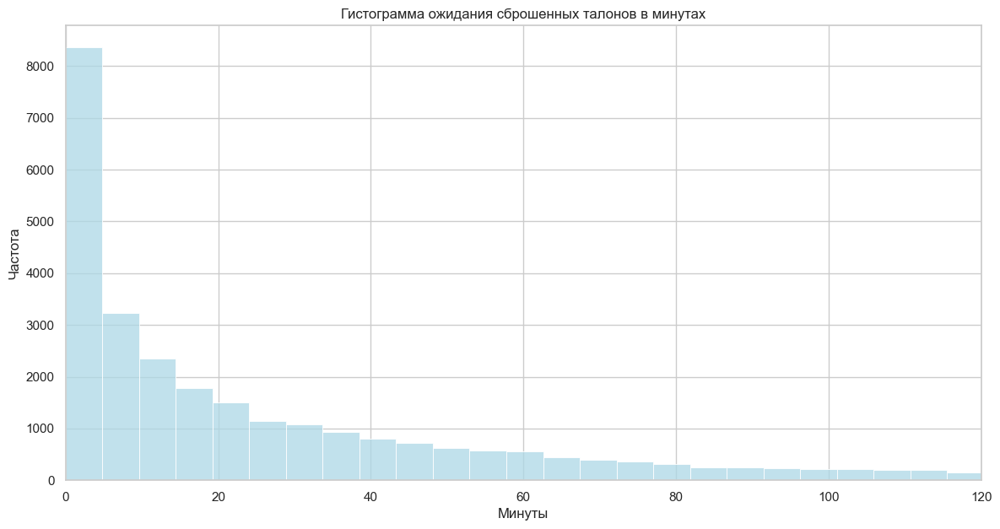

In [67]:
#построим гистограмму data['сек_ожидание']
sns.set(style="whitegrid")
plt.figure(figsize=(14, 7))
sns.histplot(data=dropped_data['мин_ожидание'], bins=120, color='lightblue')
plt.title('Гистограмма ожидания сброшенных талонов в минутах')
plt.xlabel('Минуты')
plt.ylabel('Частота')
plt.grid(True)
plt.xlim(0, 120)  
plt.show()

* Гистограмма показывает что довольно значительная часть талонов которые были вызваны ранее 20 минут, были сброшены. Т.е. медианная величина таки лучше отображает действительность.

### Промежуточный итог
* У талонов имеется 4 статуса, их общее соотношение выглядит так:
    * 93.07% (419 694) всех талонов были обслужены
    * 6.52% (29 405) всех талонов были сброшены (т.е. клиенты не подошли к окну)
    * 0.33% (1 489) всех талонов были переведены к другому окну для дальнейшего обслуживания.
    * 0.08% (351) талонов был отложен.
* В зависимости от офиса соотношение меняется, но не сильно. 
    * Наибольшая доля обслуженных талонов наблюдается в офисе 123 - 95.73% (74 099), наименьшая доля в офисе ЖОР - 92.21%(32 411)
    * Наибольшая доля сброшенных талонов наблюдается в офисе ГО - 7.6%(17 688), наименьшая доля в офисе ДОР - 3.18%(652)
* Время ожидания в очереди в зависимости от итогового статуса талона выглядит так:
    * Среднее время ожидания в очереди обслуженных талонов составляет 11 минут. Медианное время ожидания в очереди 3 минуты 31 секунда. 
    * Среднее время ожидания в очереди сброшенных талонов составляет 40 минут 47 секунд, а медианное время 16 минут 21 секунда. 
    * Такая большая разница во времени ожидания между средним и медианным объясняется долей выбросов, но удалить и корректировать их мы не стали и не будем, т.к. это все же объективный показатель лежащий в основе оценки работы организации. 
* Гистограмма времени ожидания сброшенных талонов показывает нам что большая часть бывает вызвана до 20 минут ожидания, т.е. подтверждает нашу догадку о влиянии доли выбросов на средние показатели. 

## Популярные талоны и их обслуживание.
Создадим таблицу с данными где будут отражены 10 самых популярных талонов, с их количеством и занимаемой долей, а также с информацией ожидания в очереди и скорости обслуживания таких талонов в минутах. Далее отобразим в графике количественные значения и размер доли популярных талонов. 

#### Общее

In [68]:
# Группируем данные и считаем количество талонов, медиану и среднее
data_talon = data.groupby('категория_операции').agg(
    количество_талонов=('регистрация', 'count'),
    медианное_время_ожидания=('мин_ожидание', 'median'),
    среднее_время_ожидания=('мин_ожидание', 'mean'),
    медианное_время_обслуживания=('мин_обслуживание', 'median'),
    среднее_время_обслуживания=('мин_обслуживание', 'mean')
).reset_index()

# Сортируем по количеству талонов в порядке убывания
data_talon = data_talon.sort_values(by='количество_талонов', ascending=False)

# Рассчитываем долю талонов
data_talon['доля_талонов'] = (data_talon['количество_талонов'] / data_talon['количество_талонов'].sum() * 100).round(1).map('{:.1f}%'.format)

# Округляем средние времена до двух знаков после запятой
data_talon[['среднее_время_ожидания', 'среднее_время_обслуживания']] = data_talon[
    ['среднее_время_ожидания', 'среднее_время_обслуживания']
].round(2)
# Выводим топ-10 записей
data_talon.head(10)

,категория_операции,количество_талонов,медианное_время_ожидания,среднее_время_ожидания,медианное_время_обслуживания,среднее_время_обслуживания,доля_талонов
38,Т30,91703,11.05,30.89,24.92,29.41,20.3%
1,1В20,76941,2.03,5.08,5.98,8.16,17.1%
29,П9,62105,3.87,5.61,32.62,37.77,13.8%
11,В31,42891,2.75,5.63,5.57,7.77,9.5%
5,1У54,32342,5.05,10.75,7.20,9.30,7.2%
34,С73,30774,12.22,20.71,17.88,20.85,6.8%
40,Ф7,15379,0.77,3.21,3.23,5.46,3.4%
39,У91,13570,3.25,7.16,6.82,9.07,3.0%
2,1Д11,10073,2.07,4.98,11.58,15.41,2.2%
3,1Е13,8797,3.03,8.51,12.93,15.07,2.0%


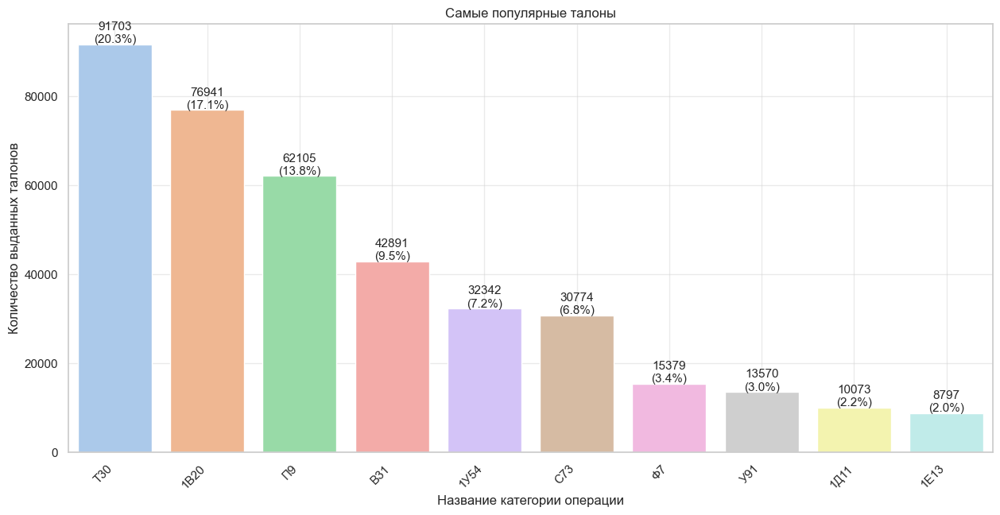

In [69]:
#строим график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='категория_операции', y='количество_талонов', data=data_talon.head(10), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('Название категории операции')
plt.ylabel('Количество выданных талонов')
plt.title('Самые популярные талоны')
plt.grid(alpha=0.4)

#числовые значения и проценты в графике
for p, count, percentage in zip(ax.patches, data_talon['количество_талонов'], data_talon['доля_талонов']):
    ax.annotate(f"{count}\n({percentage})",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize=11) 

plt.show()

* Самым популярные талоны среди всех офисов:
    * Т30 - 20.3% при выданных 91 703. 
        * Длина ожидания в очереди данного талона среднее 31 минут, медианное 11 минут.
        * Длина обслуживания данного талона среднее 29 минут, медианное 25 минут.
    * 1В20 - 17.1% при выданных 76 941.
        * Длина ожидания в очереди данного талона среднее 5 минут, медианное 2 минут.
        * Длина обслуживания данного талона среднее 8 минут, медианное 5 минут.
    * П9 - 13.8% при выданных 62 105.
        * Длина ожидания в очереди данного талона среднее 6 минут, медианное 4 минут.
        * Длина обслуживания данного талона среднее 38 минут, медианное 33 минут.

#### Популярные талоны в офисе ГО.

In [70]:
# Группируем данные и считаем количество талонов, медиану и среднее
go_talon = go_office.groupby('категория_операции').agg(
    количество_талонов=('регистрация', 'count'),
    медианное_время_ожидания=('мин_ожидание', 'median'),
    среднее_время_ожидания=('мин_ожидание', 'mean'),
    медианное_время_обслуживания=('мин_обслуживание', 'median'),
    среднее_время_обслуживания=('мин_обслуживание', 'mean')
).reset_index()

# Сортируем по количеству талонов в порядке убывания
go_talon = go_talon.sort_values(by='количество_талонов', ascending=False)

# Рассчитываем долю талонов
go_talon['доля_талонов'] = (go_talon['количество_талонов'] / go_talon['количество_талонов'].sum() * 100).round(1).map('{:.1f}%'.format)

# Округляем средние времена до двух знаков после запятой
go_talon[['среднее_время_ожидания', 'среднее_время_обслуживания']] = go_talon[
    ['среднее_время_ожидания', 'среднее_время_обслуживания']
].round(2)

# Выводим топ-10 записей
go_talon.head(10)

,категория_операции,количество_талонов,медианное_время_ожидания,среднее_время_ожидания,медианное_время_обслуживания,среднее_время_обслуживания,доля_талонов
1,1В20,44158,2.98,5.92,5.97,8.23,19.0%
29,П9,39025,5.10,6.48,33.65,38.88,16.8%
38,Т30,34652,22.97,46.54,27.77,32.21,14.9%
34,С73,19756,17.95,25.84,16.53,19.55,8.5%
5,1У54,17515,10.62,15.30,7.92,9.84,7.5%
11,В31,15447,4.37,7.03,5.92,8.02,6.6%
40,Ф7,8410,1.22,3.47,3.28,5.62,3.6%
28,О17,6143,4.22,10.42,30.83,35.48,2.6%
39,У91,5824,6.30,10.23,8.04,10.32,2.5%
23,Л115,5754,9.30,15.86,18.42,21.67,2.5%


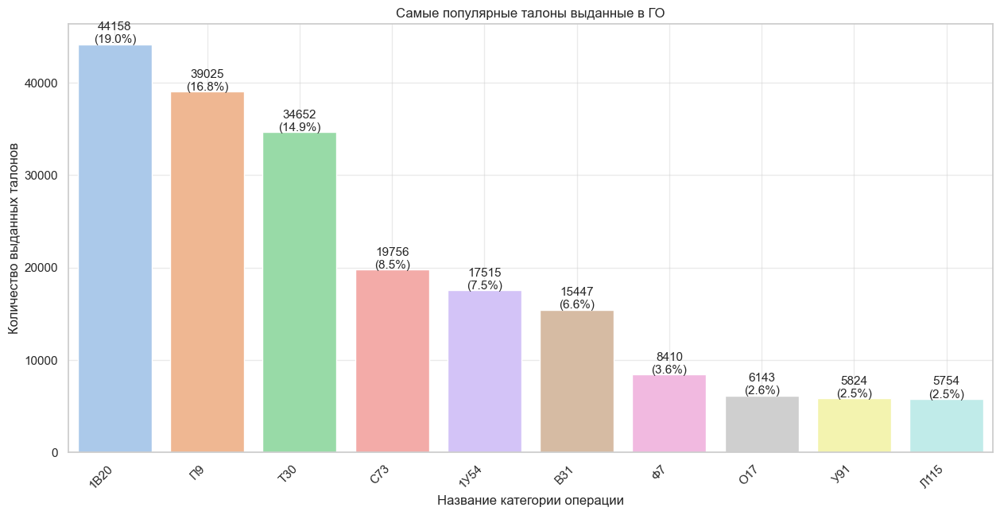

In [71]:
#строим график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='категория_операции', y='количество_талонов', data=go_talon.head(10), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('Название категории операции')
plt.ylabel('Количество выданных талонов')
plt.title('Самые популярные талоны выданные в ГО')
plt.grid(alpha=0.4)

#числовые значения и проценты в графике
for p, count, percentage in zip(ax.patches, go_talon['количество_талонов'], go_talon['доля_талонов']):
    ax.annotate(f"{count}\n({percentage})",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize=11) 

plt.show()

* Самые популярные талоны в офисе ГО:
    * 1В20 - 19% при выданных 44 158. 
        * Длина ожидания в очереди данного талона среднее 6 минут, медианное 3 минут.
        * Длина обслуживания данного талона среднее 8 минут, медианное 6 минут.
    * П9 - 16.8% при выданных 39 025.
        * Длина ожидания в очереди данного талона среднее 7 минут, медианное 5 минут.
        * Длина обслуживания данного талона среднее 39 минут, медианное 34 минут.
    * Т30 - 14.9% при выданных 34 652.
        * Длина ожидания в очереди данного талона среднее 47 минут, медианное 23 минут.
        * Длина обслуживания данного талона среднее 32 минут, медианное 28 минут.

#### Популярные талоны в офисе 123

In [72]:
# Группируем данные и считаем количество талонов, медиану и среднее
ott_talon = ott_office.groupby('категория_операции').agg(
    количество_талонов=('номер_талона', 'count'),
    медианное_время_ожидания=('мин_ожидание', 'median'),
    среднее_время_ожидания=('мин_ожидание', 'mean'),
    медианное_время_обслуживания=('мин_обслуживание', 'median'),
    среднее_время_обслуживания=('мин_обслуживание', 'mean')
).reset_index()

# Сортируем по количеству талонов в порядке убывания
ott_talon = ott_talon.sort_values(by='количество_талонов', ascending=False)

# Рассчитываем долю талонов
ott_talon['доля_талонов'] = (ott_talon['количество_талонов'] / ott_talon['количество_талонов'].sum() * 100).round(1).map('{:.1f}%'.format)

# Округляем средние времена до двух знаков после запятой
ott_talon[['среднее_время_ожидания', 'среднее_время_обслуживания']] = ott_talon[
    ['среднее_время_ожидания', 'среднее_время_обслуживания']
].round(2)

# Выводим топ-10 записей
ott_talon.head(10)

,категория_операции,количество_талонов,медианное_время_ожидания,среднее_время_ожидания,медианное_время_обслуживания,среднее_время_обслуживания,доля_талонов
22,П9,15903,2.32,4.61,32.72,37.77,20.5%
0,1В20,15274,1.10,4.14,6.72,8.93,19.7%
30,Т30,11667,7.13,30.28,26.78,30.61,15.1%
26,С73,8371,5.78,12.01,20.05,22.95,10.8%
4,1У54,5894,1.14,5.50,8.93,11.18,7.6%
6,В31,5593,1.73,3.84,7.65,10.34,7.2%
32,Ф7,1896,0.12,2.70,4.52,6.96,2.4%
31,У91,1826,0.75,4.43,9.01,11.25,2.4%
2,1Е13,1808,3.36,9.12,15.29,17.49,2.3%
1,1Д11,1791,0.97,4.14,14.25,18.66,2.3%


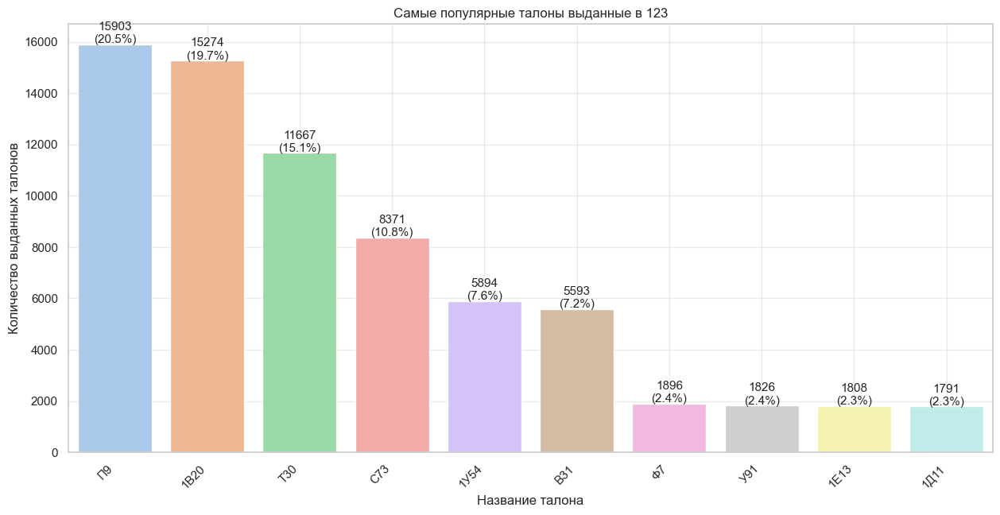

In [73]:
#строим график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='категория_операции', y='количество_талонов', data=ott_talon.head(10), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('Название талона')
plt.ylabel('Количество выданных талонов')
plt.title('Самые популярные талоны выданные в 123')
plt.grid(alpha=0.4)

#числовые значения и проценты в графике
for p, count, percentage in zip(ax.patches, ott_talon['количество_талонов'], ott_talon['доля_талонов']):
    ax.annotate(f"{count}\n({percentage})",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize=11) 

plt.show()

* Самые популярные талоны в офисе 123:
    * П9 - 20.5% при выданных 15 903. 
        * Длина ожидания в очереди данного талона среднее 5 минут, медианное 3 минуты.
        * Длина обслуживания данного талона среднее 38 минут, медианное 33 минут.
    * 1В20 - 19.7% при выданных 15 274.
        * Длина ожидания в очереди данного талона среднее 4 минуты, медианное 1 минута.
        * Длина обслуживания данного талона среднее 9 минут, медианное 7 минут.
    * Т30 - 15.1% при выданных 11 667.
        * Длина ожидания в очереди данного талона среднее 30 минут, медианное 7 минут.
        * Длина обслуживания данного талона среднее 31 минут, медианное 27 минут.

#### Популярные талоны в офисе ЯРИ

In [74]:
# Группируем данные и считаем количество талонов, медиану и среднее
yari_talon = yari_office.groupby('категория_операции').agg(
    количество_талонов=('номер_талона', 'count'),
    медианное_время_ожидания=('мин_ожидание', 'median'),
    среднее_время_ожидания=('мин_ожидание', 'mean'),
    медианное_время_обслуживания=('мин_обслуживание', 'median'),
    среднее_время_обслуживания=('мин_обслуживание', 'mean')
).reset_index()

# Сортируем по количеству талонов в порядке убывания
yari_talon = yari_talon.sort_values(by='количество_талонов', ascending=False)

# Рассчитываем долю талонов
yari_talon['доля_талонов'] = (yari_talon['количество_талонов'] / yari_talon['количество_талонов'].sum() * 100).round(1).map('{:.1f}%'.format)

# Округляем средние времена до двух знаков после запятой
yari_talon[['среднее_время_ожидания', 'среднее_время_обслуживания']] = yari_talon[
    ['среднее_время_ожидания', 'среднее_время_обслуживания']
].round(2)

# Выводим топ-10 записей
yari_talon.head(10)

,категория_операции,количество_талонов,медианное_время_ожидания,среднее_время_ожидания,медианное_время_обслуживания,среднее_время_обслуживания,доля_талонов
6,В31,13576,1.92,5.22,4.68,6.86,31.4%
31,Т30,9791,6.12,21.19,23.60,28.02,22.7%
39,ЮЛ86,4445,1.15,3.57,32.20,37.29,10.3%
34,ФЛ85,4026,1.20,3.80,28.82,33.12,9.3%
32,У91,3349,0.67,3.86,5.73,8.23,7.8%
10,Д33,1970,2.15,5.74,12.08,14.92,4.6%
33,Ф7,1240,0.22,2.11,2.30,3.66,2.9%
0,1В20,791,0.97,2.48,4.52,6.20,1.8%
12,Е93,749,1.52,6.07,11.08,12.25,1.7%
27,С73,584,7.16,14.38,21.64,23.56,1.4%


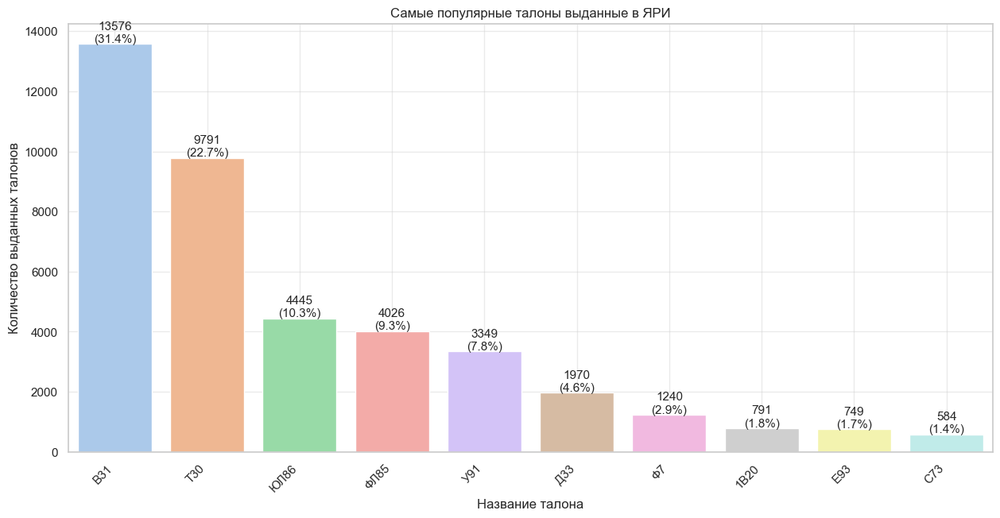

In [75]:
#строим график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='категория_операции', y='количество_талонов', data=yari_talon.head(10), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('Название талона')
plt.ylabel('Количество выданных талонов')
plt.title('Самые популярные талоны выданные в ЯРИ')
plt.grid(alpha=0.4)

#числовые значения и проценты в графике
for p, count, percentage in zip(ax.patches, yari_talon['количество_талонов'], yari_talon['доля_талонов']):
    ax.annotate(f"{count}\n({percentage})",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize=11) 

plt.show()

* Самые популярные талоны в офисе ЯРИ:
    * В31 - 31.4% при выданных 13 576. 
        * Длина ожидания в очереди данного талона среднее 5 минут, медианное 2 минуты.
        * Длина обслуживания данного талона среднее 7 минут, медианное 5 минут.
    * Т30 - 22.7% при выданных 9 791.
        * Длина ожидания в очереди данного талона среднее 21 минуты, медианное 6 минута.
        * Длина обслуживания данного талона среднее 28 минут, медианное 24 минут.
    * ЮЛ86 - 10.3% при выданных 4 445.
        * Длина ожидания в очереди данного талона среднее 4 минут, медианное 1 минут.
        * Длина обслуживания данного талона среднее 37 минут, медианное 32 минут.
    * ФЛ85 - 9.3% при выданных 4026.
        * Длина ожидания в очереди данного талона среднее 4 минут, медианное 1 минут.
        * Длина обслуживания данного талона среднее 33 минут, медианное 29 минут.

#### Популярные талоны в офисе ЖОР

In [76]:
# Группируем данные и считаем количество талонов, медиану и среднее
jor_talon = jor_office.groupby('категория_операции').agg(
    количество_талонов=('номер_талона', 'count'),
    медианное_время_ожидания=('мин_ожидание', 'median'),
    среднее_время_ожидания=('мин_ожидание', 'mean'),
    медианное_время_обслуживания=('мин_обслуживание', 'median'),
    среднее_время_обслуживания=('мин_обслуживание', 'mean')
).reset_index()

# Сортируем по количеству талонов в порядке убывания
jor_talon = jor_talon.sort_values(by='количество_талонов', ascending=False)

# Рассчитываем долю талонов
jor_talon['доля_талонов'] = (jor_talon['количество_талонов'] / jor_talon['количество_талонов'].sum() * 100).round(1).map('{:.1f}%'.format)

# Округляем средние времена до двух знаков после запятой
jor_talon[['среднее_время_ожидания', 'среднее_время_обслуживания']] = jor_talon[
    ['среднее_время_ожидания', 'среднее_время_обслуживания']
].round(2)

# Выводим топ-10 записей
jor_talon.head(10)

,категория_операции,количество_талонов,медианное_время_ожидания,среднее_время_ожидания,медианное_время_обслуживания,среднее_время_обслуживания,доля_талонов
28,Т30,13267,17.430,29.02,22.150,26.13,37.7%
0,1В20,6363,1.620,5.92,4.870,6.64,18.1%
3,1У54,3890,3.430,7.55,3.800,6.38,11.1%
5,В31,2467,4.030,7.62,4.720,6.77,7.0%
22,П9,2148,2.525,4.75,27.085,32.41,6.1%
2,1Е13,1560,2.210,7.18,10.985,12.60,4.4%
30,Ф7,992,3.230,7.62,2.820,4.73,2.8%
29,У91,924,5.335,7.90,3.550,6.03,2.6%
1,1Д11,907,2.950,7.79,5.970,10.26,2.6%
10,Е93,483,5.370,14.69,11.620,14.26,1.4%


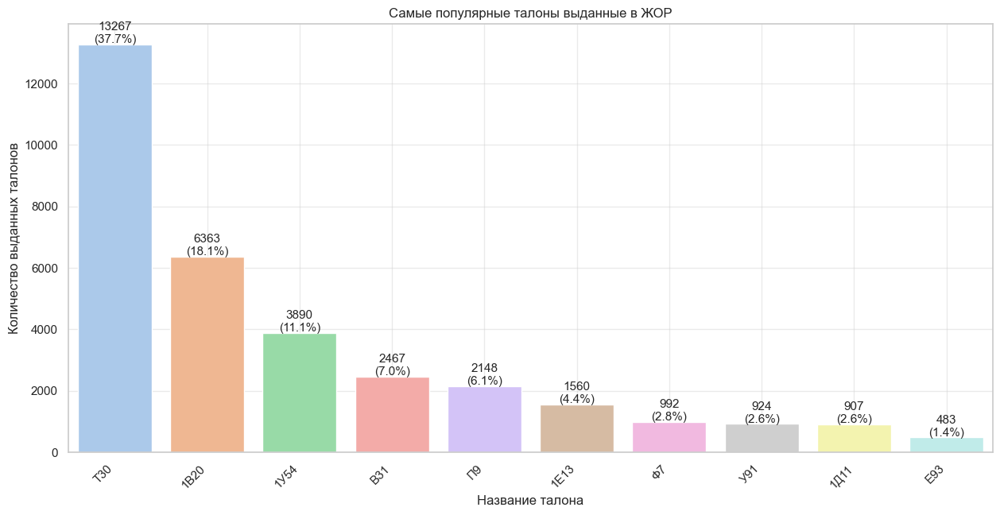

In [77]:
#строим график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='категория_операции', y='количество_талонов', data=jor_talon.head(10), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('Название талона')
plt.ylabel('Количество выданных талонов')
plt.title('Самые популярные талоны выданные в ЖОР')
plt.grid(alpha=0.4)

#числовые значения и проценты в графике
for p, count, percentage in zip(ax.patches, jor_talon['количество_талонов'], jor_talon['доля_талонов']):
    ax.annotate(f"{count}\n({percentage})",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize=11) 

plt.show()

* Самые популярные талоны в офисе ЖОР:
    * Т30 - 37.7% при выданных 13 267. 
        * Длина ожидания в очереди данного талона среднее 29 минут, медианное 17 минут.
        * Длина обслуживания данного талона среднее 26 минут, медианное 22 минут.
    * 1В20 - 18.1% при выданных 6 363.
        * Длина ожидания в очереди данного талона среднее 6 минуты, медианное 2 минута.
        * Длина обслуживания данного талона среднее 7 минут, медианное 5 минут.
    * 1У54 - 11.1% при выданных 3 890.
        * Длина ожидания в очереди данного талона среднее 8 минут, медианное 3 минут.	
        * Длина обслуживания данного талона среднее 6 минут, медианное 4 минут.	

#### Популярные талоны в офисе 203

In [78]:
# Группируем данные и считаем количество талонов, медиану и среднее
tzt_talon = tzt_office.groupby('категория_операции').agg(
    количество_талонов=('номер_талона', 'count'),
    медианное_время_ожидания=('мин_ожидание', 'median'),
    среднее_время_ожидания=('мин_ожидание', 'mean'),
    медианное_время_обслуживания=('мин_обслуживание', 'median'),
    среднее_время_обслуживания=('мин_обслуживание', 'mean')
).reset_index()

# Сортируем по количеству талонов в порядке убывания
tzt_talon = tzt_talon.sort_values(by='количество_талонов', ascending=False)

# Рассчитываем долю талонов
tzt_talon['доля_талонов'] = (tzt_talon['количество_талонов'] / tzt_talon['количество_талонов'].sum() * 100).round(1).map('{:.1f}%'.format)

# Округляем средние времена до двух знаков после запятой
tzt_talon[['среднее_время_ожидания', 'среднее_время_обслуживания']] = tzt_talon[
    ['среднее_время_ожидания', 'среднее_время_обслуживания']
].round(2)

# Выводим топ-10 записей
tzt_talon.head(10)

,категория_операции,количество_талонов,медианное_время_ожидания,среднее_время_ожидания,медианное_время_обслуживания,среднее_время_обслуживания,доля_талонов
31,Т30,15153,2.73,13.60,20.380,24.47,36.1%
0,1В20,6930,0.43,3.05,5.320,6.78,16.5%
6,В31,3766,1.67,3.97,5.400,6.58,9.0%
4,1У54,3395,0.82,4.19,3.980,6.26,8.1%
23,П9,2719,0.52,2.34,22.270,26.25,6.5%
33,Ф7,2015,0.12,1.86,2.370,3.90,4.8%
27,С73,1446,2.22,8.40,20.490,23.40,3.4%
32,У91,1134,3.09,5.61,3.100,5.14,2.7%
2,1Е13,1109,0.17,2.66,10.680,12.21,2.6%
1,1Д11,1108,0.88,4.02,7.575,11.55,2.6%


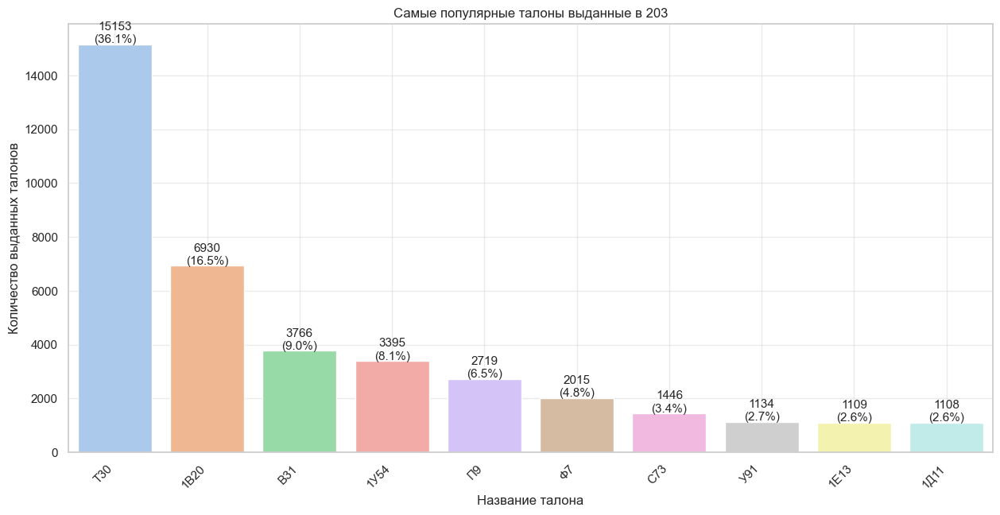

In [79]:
#строим график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='категория_операции', y='количество_талонов', data=tzt_talon.head(10), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('Название талона')
plt.ylabel('Количество выданных талонов')
plt.title('Самые популярные талоны выданные в 203')
plt.grid(alpha=0.4)

#числовые значения и проценты в графике
for p, count, percentage in zip(ax.patches, tzt_talon['количество_талонов'], tzt_talon['доля_талонов']):
    ax.annotate(f"{count}\n({percentage})",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize=11) 

plt.show()

* Самые популярные талоны в офисе 203:
    * Т30 - 36.1% при выданных 15 153. 
        * Длина ожидания в очереди данного талона среднее 14 минут, медианное 3 минут.
        * Длина обслуживания данного талона среднее 25 минут, медианное 20 минут.
    * 1В20 - 16.5% при выданных 6 930.
        * Длина ожидания в очереди данного талона среднее 3 минуты, медианное менее 1 минуты.	
        * Длина обслуживания данного талона среднее 7 минут, медианное 5 минут.
    * В31 - 9% при выданных 3 766.
        * Длина ожидания в очереди данного талона среднее 4 минут, медианное 2 минут.
        * Длина обслуживания данного талона среднее 7 минут, медианное 5 минут.	
    * 1У54 - 8.1% при выданных 3 395.
        * Длина ожидания в очереди данного талона среднее 4 минута, медианное менее 1 минуты.	
        * Длина обслуживания данного талона среднее 6 минут, медианное 4 минут.	

#### Популярные талоны в офисе ДОР

In [80]:
# Группируем данные и считаем количество талонов, медиану и среднее
dor_talon = dor_office.groupby('категория_операции').agg(
    количество_талонов=('номер_талона', 'count'),
    медианное_время_ожидания=('мин_ожидание', 'median'),
    среднее_время_ожидания=('мин_ожидание', 'mean'),
    медианное_время_обслуживания=('мин_обслуживание', 'median'),
    среднее_время_обслуживания=('мин_обслуживание', 'mean')
).reset_index()

# Сортируем по количеству талонов в порядке убывания
dor_talon = dor_talon.sort_values(by='количество_талонов', ascending=False)

# Рассчитываем долю талонов
dor_talon['доля_талонов'] = (dor_talon['количество_талонов'] / dor_talon['количество_талонов'].sum() * 100).round(1).map('{:.1f}%'.format)

# Округляем средние времена до двух знаков после запятой
dor_talon[['среднее_время_ожидания', 'среднее_время_обслуживания']] = dor_talon[
    ['среднее_время_ожидания', 'среднее_время_обслуживания']
].round(2)

# Выводим топ-10 записей
dor_talon.head(10)

,категория_операции,количество_талонов,медианное_время_ожидания,среднее_время_ожидания,медианное_время_обслуживания,среднее_время_обслуживания,доля_талонов
28,Т30,7173,0.73,9.54,27.67,32.26,34.9%
0,1В20,3425,0.07,1.58,7.18,9.84,16.7%
20,П9,2308,0.33,2.37,32.87,37.51,11.2%
6,В31,2042,0.47,3.35,6.07,8.26,9.9%
4,1У54,1528,0.17,2.20,7.21,9.92,7.4%
30,Ф7,826,0.08,1.45,4.99,7.75,4.0%
24,С73,617,1.47,9.65,22.40,25.69,3.0%
2,1Е13,529,0.25,2.08,15.22,16.46,2.6%
29,У91,513,1.62,5.71,4.30,6.78,2.5%
1,1Д11,477,0.50,3.48,14.02,17.33,2.3%


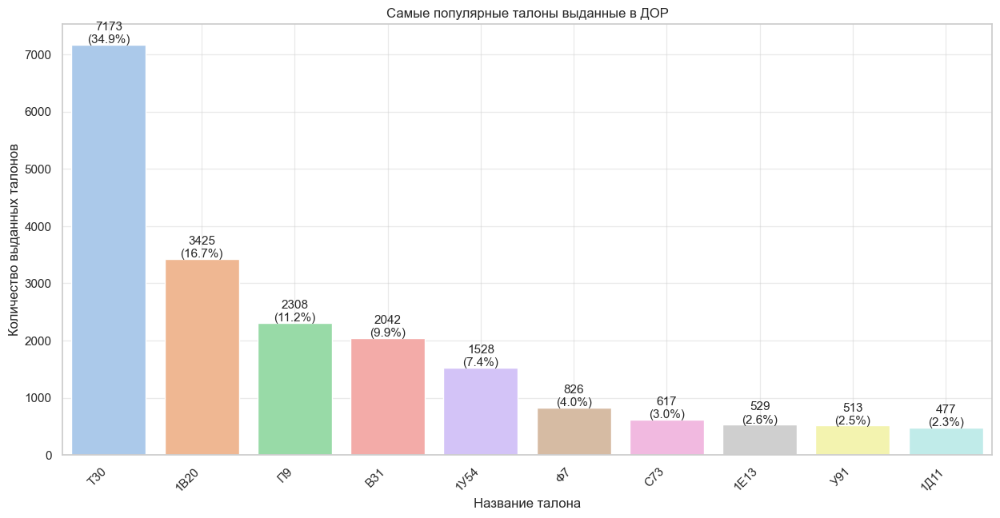

In [81]:
#строим график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='категория_операции', y='количество_талонов', data=dor_talon.head(10), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('Название талона')
plt.ylabel('Количество выданных талонов')
plt.title('Самые популярные талоны выданные в ДОР')
plt.grid(alpha=0.4)

#числовые значения и проценты в графике
for p, count, percentage in zip(ax.patches, dor_talon['количество_талонов'], dor_talon['доля_талонов']):
    ax.annotate(f"{count}\n({percentage})",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize=11) 

plt.show()

* Самые популярные талоны в офисе ДОР:
    * Т30 - 34.9% при выданных 7 173. 
        * Длина ожидания в очереди данного талона среднее 10 минут, медианное менее 1 минуты.
        * Длина обслуживания данного талона среднее 32 минут, медианное 28 минут.
    * 1В20 - 16.7% при выданных 3 425.
        * Длина ожидания в очереди данного талона среднее 2 минуты, медианное менее 1 минуты.	
        * Длина обслуживания данного талона среднее 10 минут, медианное 7 минут.
    * П9 - 11.2% при выданных 2 308.
        * Длина ожидания в очереди данного талона среднее 3 минут, медианное менее 1 минуты.	
        * Длина обслуживания данного талона среднее 38 минут, медианное 33 минут.

## Нагрузка
### Количество талонов по офисам

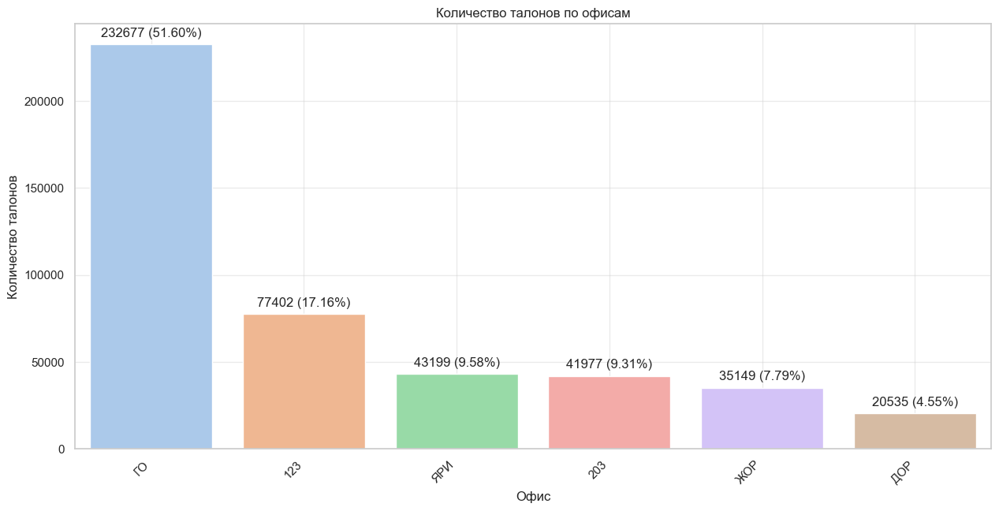

In [82]:
#датафрейм для графика
plot_office = data.groupby('офис').agg({'номер_талона': 'count'}).reset_index()

#расчет %
total_talons = plot_office['номер_талона'].sum()
plot_office['проценты'] = (plot_office['номер_талона'] / total_talons) * 100

#сортировка по столбцу с %
plot_office = plot_office.sort_values('проценты', ascending=False)

#график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='офис', y='номер_талона', data=plot_office, palette='pastel')

#настройки графика
plt.xticks(rotation=45, ha='right')
plt.xlabel('Офис')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по офисам')
plt.grid(alpha=0.4)

#числовые значения в графике
for p, count, percent in zip(ax.patches, plot_office['номер_талона'], plot_office['проценты']):
    ax.annotate(f"{format(count, '.0f')} ({format(percent, '.2f')}%)",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()

* наибольшее количество талонов выдано в офисе ГО - 232677(51.6%), наименьшее количество талонов выдано в офисе ДОР - 20535(4.55%)

### Продуктивность

In [83]:
#создаем первый столбец с количеством талонов
count_by_office = data.groupby('офис').agg({'номер_талона': 'count'}).reset_index()

#создаем второй столбец с количеством окон
unique_windows_by_office = data.groupby('офис').agg({'окно': 'nunique'}).reset_index()

#объединяем
productivity = pd.merge(count_by_office, unique_windows_by_office, on='офис')

#создаем третий столбец и упорядочиваем
productivity['количество_талонов_на_окно'] = round(productivity['номер_талона'] / productivity['окно'], 2)
productivity = productivity.sort_values(by='номер_талона', ascending=False)

#переименуем столбцы для внятности
productivity = productivity.rename(columns={
    'номер_талона': 'количество_талонов',
    'окно': 'окна'})

productivity

,офис,количество_талонов,окна,количество_талонов_на_окно
2,ГО,232677,55,4230.49
0,123,77402,26,2977.00
5,ЯРИ,43199,12,3599.92
1,203,41977,9,4664.11
4,ЖОР,35149,7,5021.29
3,ДОР,20535,7,2933.57


* Учитывая что в  каждом офисе разное количество сотрудников, а в нашем случае это обозначение считается количеством окон, наибольшую нагрузку принимает на себя офис ЖОР у которого выдано 5021,29 талонов на окно. В офисе ГО хоть и выдано наибольшее количество талонов, нагрузка чуть меньше и составляет 4230,49 талонов на окно, хотя даже таким образом второе место достается другому офису, а именно офису 203 с 4664,11 талонами на окно.

In [84]:
#создаем первый столбец с количеством талонов
count_by_office_served = served_data.groupby('офис').agg({'номер_талона': 'count'}).reset_index()

#создаем второй столбец с количеством окон
unique_windows_by_office_served = served_data.groupby('офис').agg({'окно': 'nunique'}).reset_index()

#объединяем
productivity_served = pd.merge(count_by_office_served, unique_windows_by_office_served, on='офис')

#создаем третий столбец и упорядочиваем
productivity_served ['количество_обслуженных_талонов_на_окно'] = round(productivity_served ['номер_талона'] / productivity_served ['окно'], 2)
productivity_served  = productivity_served .sort_values(by='номер_талона', ascending=False)

#переименуем столбцы для внятности
productivity_served  = productivity_served .rename(columns={
    'номер_талона': 'количество_обслуженных_талонов',
    'окно': 'окна'})

productivity_served 

,офис,количество_обслуженных_талонов,окна,количество_обслуженных_талонов_на_окно
2,ГО,214651,55,3902.75
0,123,74099,26,2849.96
5,ЯРИ,40146,12,3345.50
1,203,38786,9,4309.56
4,ЖОР,32411,7,4630.14
3,ДОР,19601,7,2800.14


* Здесь же мы видим не просто выданные талоны, а обслуженные талоны. Тем не менее очередность не поменялась и офисы ЖОР и 203 имея небольшое количество окон находятся в впереди более высокую нагрузку на окно. 

### Среднее ожидание в минутах и количество обслуженных талонов по месяцам

In [85]:
def process_office_data(office_name, office_df, office_served_df):
    wait_per_month = office_df.groupby('месяц')['мин_ожидание'].mean().round(1).reindex(months_order)
    talons_per_month_served = office_served_df.groupby('месяц')['мин_ожидание'].count().round(1).reindex(months_order)
    
    #свариваем друг к другу по столбцу 'месяц'
    wait_and_talons = pd.merge(wait_per_month, talons_per_month_served, on='месяц', how='outer')
    
    #название столбцов
    wait_and_talons.columns = [f'Среднее ожидание в минутах, офис {office_name}', f'Количество обслуженных талонов, офис {office_name}']
    
    return wait_and_talons

#объединение всех данных
avg_wait_and_count_talon = None
for office_name, (office_df, office_served_df) in offices.items():
    office_data = process_office_data(office_name, office_df, office_served_df)
    
    if avg_wait_and_count_talon is None:
        avg_wait_and_count_talon = office_data
    else:
        avg_wait_and_count_talon = pd.merge(avg_wait_and_count_talon, office_data, on='месяц', how='outer')

In [86]:
#выводим на экран наш результат
avg_wait_and_count_talon

,"Среднее ожидание в минутах, офис ГО","Количество обслуженных талонов, офис ГО","Среднее ожидание в минутах, офис 123","Количество обслуженных талонов, офис 123","Среднее ожидание в минутах, офис ЯРИ","Количество обслуженных талонов, офис ЯРИ","Среднее ожидание в минутах, офис ЖОР","Количество обслуженных талонов, офис ЖОР","Среднее ожидание в минутах, офис 203","Количество обслуженных талонов, офис 203","Среднее ожидание в минутах, офис ДОР","Количество обслуженных талонов, офис ДОР"
месяц,,,,,,,,,,,,
January,8.6,13844,2.1,4229,1.1,2028,6.9,2024,2.0,2155,1.5,982
February,10.7,15529,3.5,4813,1.7,2466,4.9,2343,1.9,2466,0.9,1161
March,9.4,18977,5.5,5864,2.6,3097,13.6,2859,3.0,3244,0.7,1409
April,8.6,17731,4.1,5764,2.2,2846,13.7,2946,3.7,2883,1.3,1279
May,10.5,18053,5.2,6185,1.4,3069,11.6,2903,2.1,2896,0.8,1395
June,17.3,17644,13.6,6047,5.1,3450,10.8,2584,6.4,3115,0.9,1462
July,22.6,19452,11.7,6947,13.6,3718,12.2,2791,6.0,3004,4.4,1610
August,24.1,22995,18.7,9026,13.1,4794,18.6,3735,11.4,4299,8.8,2267
September,27.6,18671,25.0,7263,22.2,3989,23.8,3477,15.6,4265,12.3,2311


* Расчитали среднее время ожидани для каждого офиса по месяцам, а так же количество обслуженных талонов в этот месяц.
* Пока по таблице мы можем видеть увеличение количества обслуженных таловнов, а также увеличение времеги ожидания в очереди
* Нарисуем графики для наглядности

### Тепловая карта среднего ожидания в очереди по офисам и месяцам

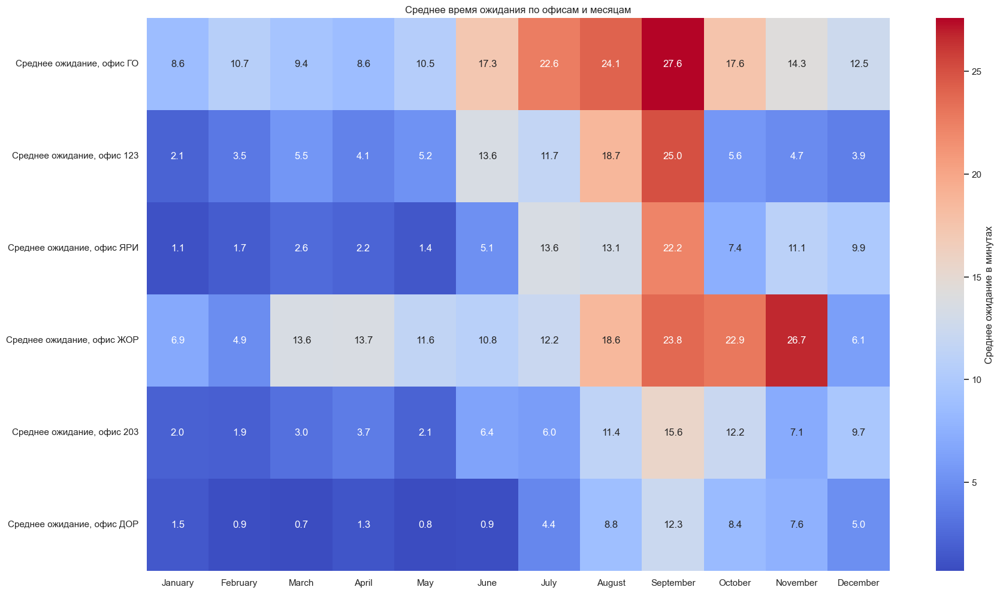

In [87]:
def process_office_data(office_name, office_df, office_served_df):
    wait_per_month = office_df.groupby('месяц')['мин_ожидание'].mean().round(1).reindex(months_order)
    talons_per_month_served = office_served_df.groupby('месяц')['мин_ожидание'].count().round(1).reindex(months_order)
    
    #свариваем друг к другу по столбцу 'месяц'
    wait_and_talons = pd.merge(wait_per_month, talons_per_month_served, on='месяц', how='outer')
    
    #название столбцов
    wait_and_talons.columns = [f'Среднее ожидание в минутах, офис {office_name}', f'Количество обслуженных талонов, офис {office_name}']
    
    return wait_and_talons

# Создаем датафрейм только со средним временем ожидания
avg_wait_time = pd.DataFrame(index=months_order)
for office_name, (office_df, office_served_df) in offices.items():
    wait_per_month = office_df.groupby('месяц')['мин_ожидание'].mean().round(1).reindex(months_order)
    avg_wait_time[f'Среднее ожидание, офис {office_name}'] = wait_per_month

# Создаем тепловую карту
plt.figure(figsize=(20, 12))
sns.heatmap(avg_wait_time.T, annot=True, cmap='coolwarm', fmt='.1f', cbar_kws={'label': 'Среднее ожидание в минутах'})
plt.title('Среднее время ожидания по офисам и месяцам')
plt.show()

* По тепловой карте видно что фактически у всех офисов идет постепенное увеличение среднего времени ожидания в офисах летом, в большинстве случаев пик ожидания пришелся на август и сентябрь. Кроме офиса ЖОР, у него пиковое ожидание произошло в ноябре, что в целом выбивается из общей картины.

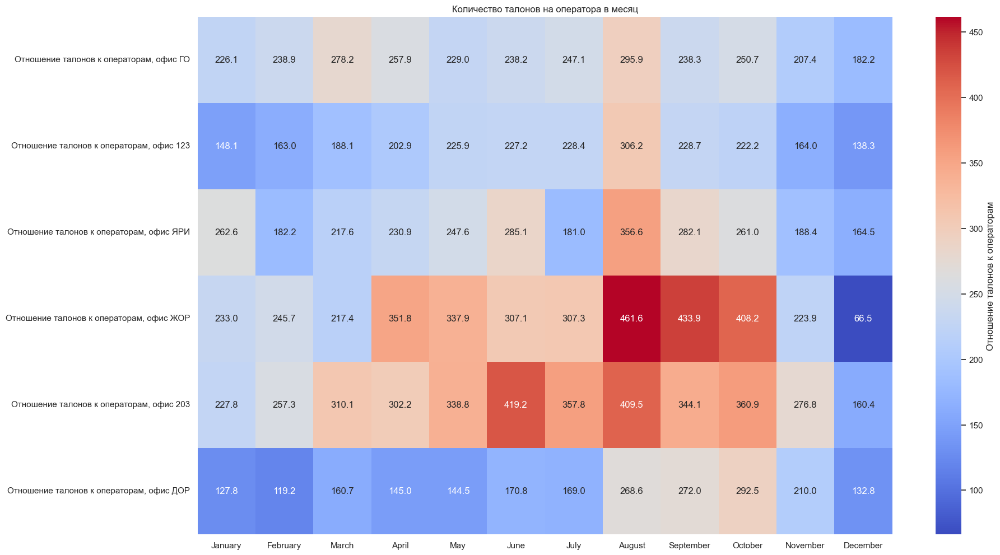

In [88]:
# Создаем датафрейм только с отношением талонов к операторам
talons_per_operator = pd.DataFrame(index=months_order)
for office_name, (office_df, office_served_df) in offices.items():
    ratio_per_month = (office_df.groupby('месяц')['регистрация'].count() / office_df.groupby('месяц')['номер_оператора'].nunique()).round(1).reindex(months_order)
    talons_per_operator[f'Отношение талонов к операторам, офис {office_name}'] = ratio_per_month

# Создаем тепловую карту
plt.figure(figsize=(20, 12))
sns.heatmap(talons_per_operator.T, annot=True, cmap='coolwarm', fmt='.1f', cbar_kws={'label': 'Отношение талонов к операторам'})
plt.title('Количество талонов на оператора в месяц')
plt.show()

* Тепловая карта соотношения количества талонов на одного оператора показывает что наибольшее количество талонов приходится на август. Но в офисе ЖОР повышенная нагрузка идет с апреля по октябрь. 

### Линейный график количества обслуженных талонов по месяцам и офисам

<Figure size 2000x1000 with 0 Axes>

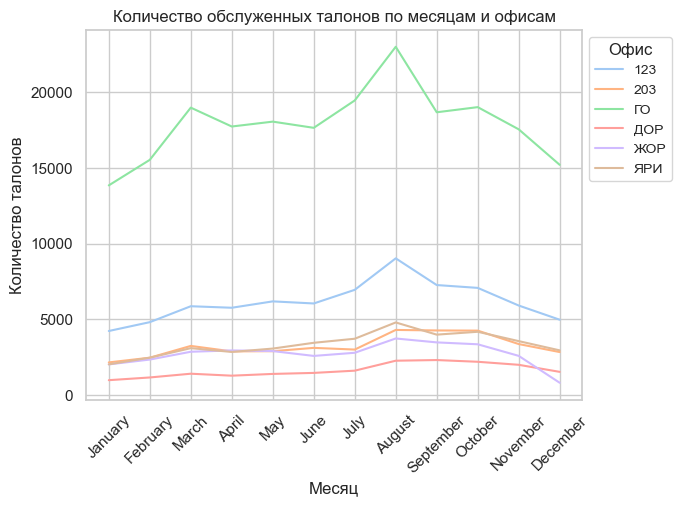

In [89]:
# Установка размера и создание графика с измененной пропорцией
plt.figure(figsize=(20, 10))

# Используем .plot() на DataFrame с параметром hue
served_data.groupby(['месяц', 'офис'])['номер_талона'].count().unstack().plot(kind='line', grid=True)

# Названия осей и заголовок графика
plt.title("Количество обслуженных талонов по месяцам и офисам")
plt.xlabel("Месяц")
plt.ylabel("Количество талонов")

# Установка меток на оси x для каждого месяца
plt.xticks(range(len(months_order)), months_order, rotation=45)

# Добавляем легенду с измененными параметрами
plt.legend(title='Офис', loc='upper left', bbox_to_anchor=(1, 1), fontsize='small')

plt.show()

* На линейном графике по количеству обслуженных талонов видно что так же пик приходится в основном на август. Первый и последний месяцы в году показывают минимальные результаты.

## Нагрузка по дням недели
### Количество талонов по дням недели
#### Общее

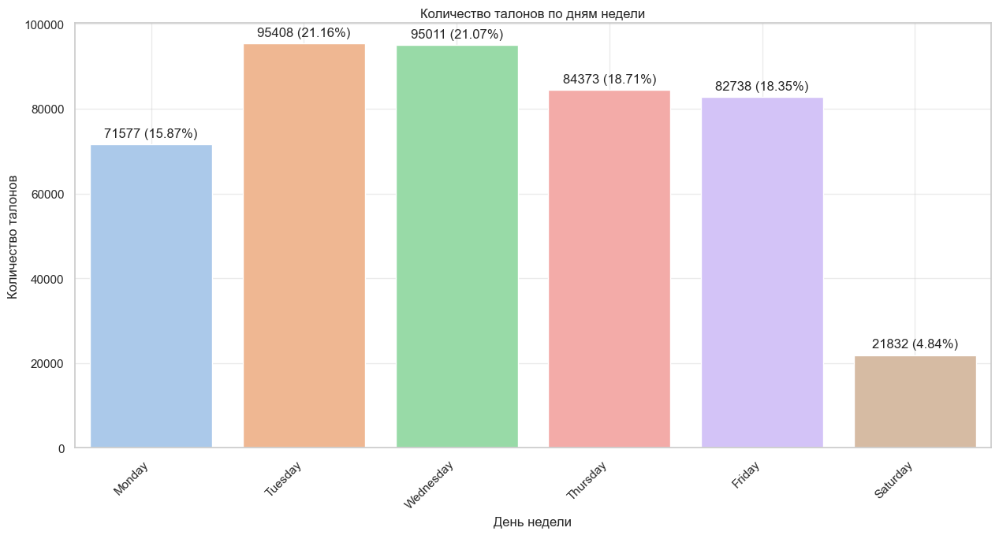

,день_недели,номер_талона,проценты
1,Monday,71577,15.872879
4,Tuesday,95408,21.157629
5,Wednesday,95011,21.069590
3,Thursday,84373,18.710513
0,Friday,82738,18.347936
2,Saturday,21832,4.841453


In [90]:
#датафрейм для графика
plot_data = data.groupby('день_недели').agg({'номер_талона': 'count'}).reset_index()

#преобразование столбца 'день_недели' в категориальный тип с учетом порядка
plot_data['день_недели'] = pd.Categorical(plot_data['день_недели'], categories=order_days, ordered=True)
plot_data = plot_data.sort_values(by='день_недели')

#добавляем столбец 'проценты'
plot_data['проценты'] = (plot_data['номер_талона'] / total_talons) * 100

#график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='день_недели', y='номер_талона', data=plot_data.sort_values(by='день_недели'), palette='pastel')

#подписи и наклон с сеткой
plt.xticks(rotation=45, ha='right')
plt.xlabel('День недели')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по дням недели')
plt.grid(alpha=0.4)


#числовые значения в графике
for p, count, percent in zip(ax.patches, plot_data['номер_талона'], plot_data['проценты']):
  ax.annotate(f"{format(count, '.0f')} ({format(percent, '.2f')}%)",
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center',
        xytext=(0, 10),
        textcoords='offset points')

   
plt.show()
plot_data

* По данному графику мы видим что наиболее загруженные дни Вторник и Среда и на них приходится 21.16% и 21.07% всеъ выданных талонов. Сильнее всех отстает Суббота и за ним понедельник, но скорее всего это объясняется графиком работы различных офисов. 

#### Количество талонов по дням недели в офисе ГО

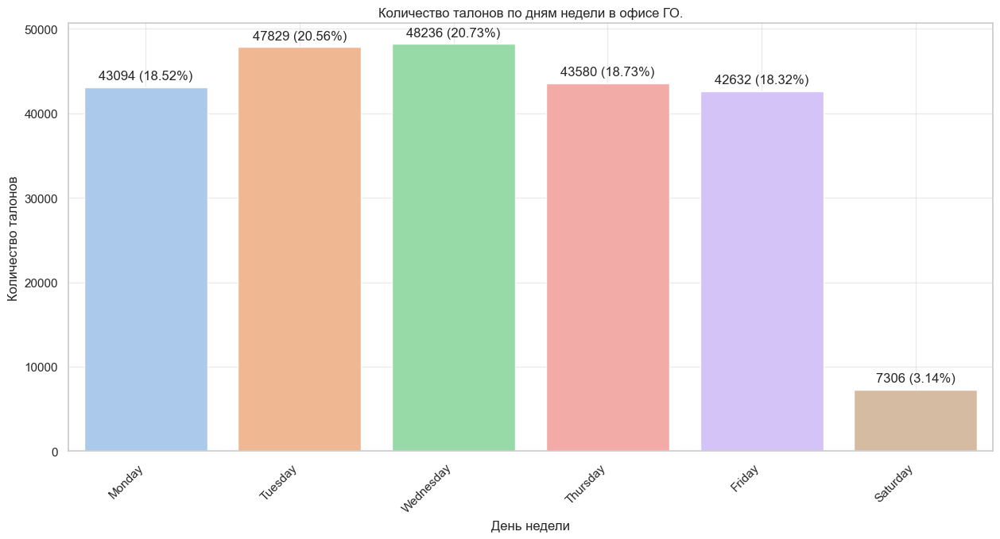

,день_недели,номер_талона,проценты
0,Monday,43094,18.520954
1,Tuesday,47829,20.555964
2,Wednesday,48236,20.730884
3,Thursday,43580,18.729827
4,Friday,42632,18.322395
5,Saturday,7306,3.139975


In [91]:
#создаем датафрейм для графика
go_plot = (go_office.groupby('день_недели')['номер_талона']
           .count()
           .reindex(order_days, fill_value=0)
           .reset_index())

#задаем порядок дней
go_plot['день_недели'] = pd.Categorical(go_plot['день_недели'], categories=order_days, ordered=True)
go_plot = go_plot.sort_values(by='день_недели')

#считаем проценты
go_plot['проценты'] = ((go_plot['номер_талона'] / go_plot['номер_талона'].sum()) * 100)

#сам график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='день_недели', y='номер_талона', data=go_plot, palette='pastel')

#настройка подписей
plt.xticks(rotation=45, ha='right')
plt.xlabel('День недели')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по дням недели в офисе ГО.')
plt.grid(alpha=0.4)

#числовые значения в графике
for p, count, percent in zip(ax.patches, go_plot['номер_талона'], go_plot['проценты']):
    ax.annotate(f"{count:.0f} ({percent:.2f}%)",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')
plt.show()
go_plot

* Наибольшее количество талонов выдано в среду - 48 236 (20.73%), а также немного отстает вторник - 47 829 (20.56%).
* Понедельник, четверг и пятница имеют примерно одинаковое количество талонов, около 18%, в то время как суббота сильно отстает - всего 7,306 (3.14%).
* Лидерство среды можно объяснить тем, что в этот день офис ГО работает на 2 часа дольше, что может привлекать больше клиентов.
* Интересно отметить большое количество выданных талонов во вторник. Возможно, в этот день существует определенная активность или условия, привлекающие клиентов.
* Отставание субботы также объясняется графиком работы, так как это сокращенный рабочий день. Меньшее количество часов работы сказывается на общем количестве выданных талонов.

#### Количество талонов по дням недели в офисе 123

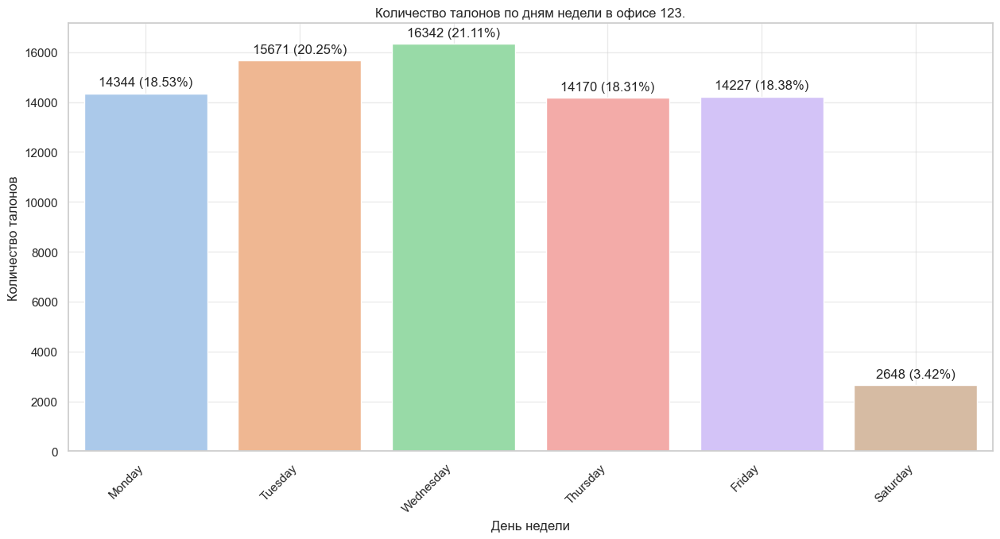

,день_недели,номер_талона,проценты
0,Monday,14344,18.531821
1,Tuesday,15671,20.246247
2,Wednesday,16342,21.113150
3,Thursday,14170,18.307020
4,Friday,14227,18.380662
5,Saturday,2648,3.421100


In [92]:
#создаем датафрейм для графика
ott_plot = (
    ott_office.groupby('день_недели')['номер_талона']
    .count()
    .reindex(order_days, fill_value=0)
    .reset_index()
)

#считаем проценты
ott_plot['проценты'] = (ott_plot['номер_талона'] / ott_plot['номер_талона'].sum()) * 100

#сам график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='день_недели', y='номер_талона', data=ott_plot, palette='pastel')

#настройка подписей
plt.xticks(rotation=45, ha='right')
plt.xlabel('День недели')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по дням недели в офисе 123.')
plt.grid(alpha=0.4)

#числовые значения в графике
for p, count, percent in zip(ax.patches, ott_plot['номер_талона'], ott_plot['проценты']):
    ax.annotate(f"{count:.0f} ({percent:.2f}%)",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()
ott_plot

* У офиса 123 схожий график работы с офисом ГО, поэтому тут так же лидирует по выданным талонам среда - 16 342(21.11%), и так же после неё сразу идет (уже с некоторым отрывом) вторник - 15 671(20.25%).
* Понедельник, четверг, пятница имеют схожие показатели в примерные 18% (от 14 170 до 14 344 талонов)
* Так же сильно отстает суббота 2 648(3.42%)

#### Количество талонов по дням недели в офисе ЯРИ

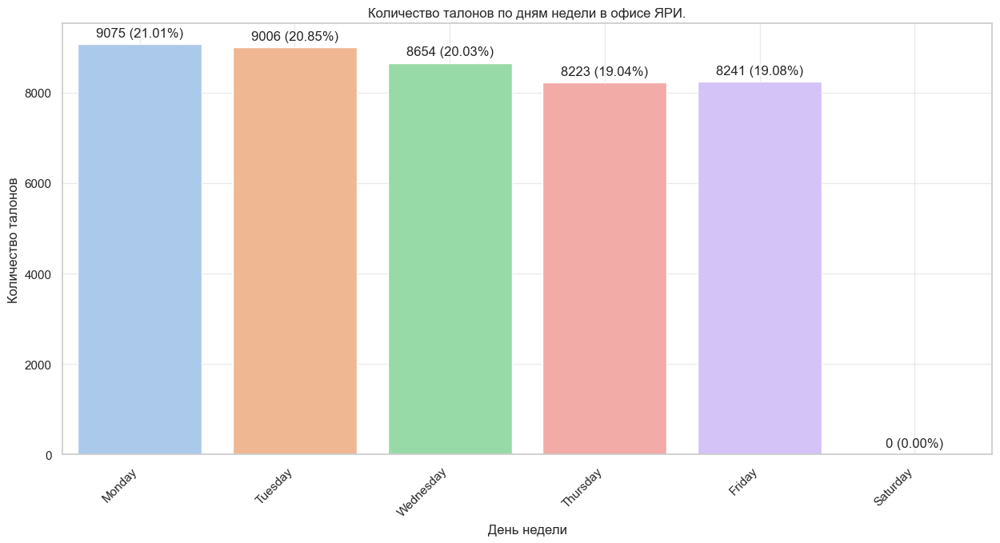

,день_недели,номер_талона,проценты
0,Monday,9075,21.007431
1,Tuesday,9006,20.847705
2,Wednesday,8654,20.032871
3,Thursday,8223,19.035163
4,Friday,8241,19.076830
5,Saturday,0,0.000000


In [93]:
#создаем датафрейм для графика
yari_plot = (
    yari_office.groupby('день_недели')['номер_талона']
    .count()
    .reindex(order_days, fill_value=0)
    .reset_index()
)

#считаем проценты
yari_plot['проценты'] = (yari_plot['номер_талона'] / yari_plot['номер_талона'].sum()) * 100

#сам график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='день_недели', y='номер_талона', data=yari_plot, palette='pastel')

#настройка подписей
plt.xticks(rotation=45, ha='right')
plt.xlabel('День недели')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по дням недели в офисе ЯРИ.')
plt.grid(alpha=0.4)

#числовые значения в графике
for p, count, percent in zip(ax.patches, yari_plot['номер_талона'], yari_plot['проценты']):
    ax.annotate(f"{count:.0f} ({percent:.2f}%)",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()
yari_plot

* Как мы видим в офисе ЯРИ пятидневка. Наибольшее количество талонов выдано в понедельник - 9 075(21.01%), наименьшее в четверг - 8 223 (19.04%). Но в целом распределение талонов по дням недели выглядит более равномерным чем в других офисах. 

#### Количество талонов по дням недели в офисе ЖОР

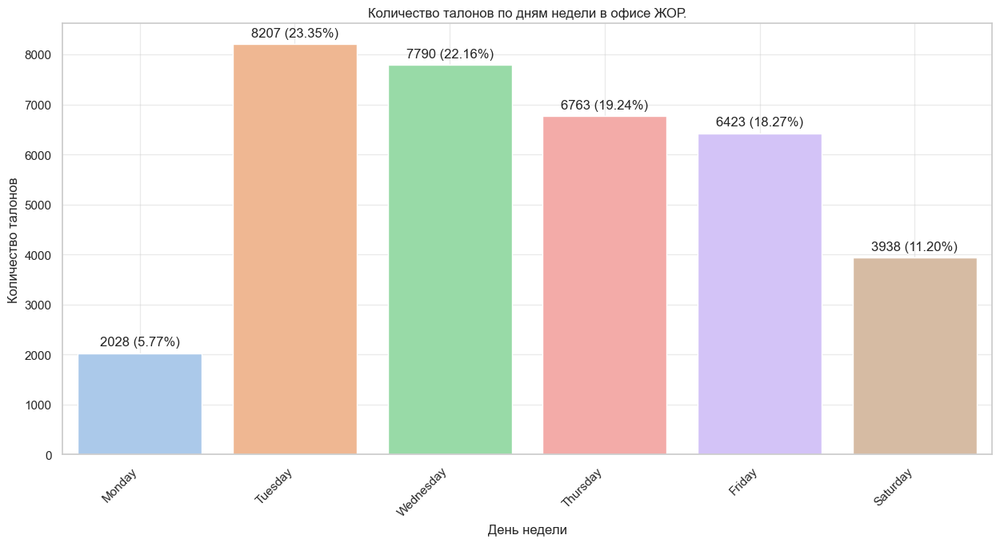

,день_недели,номер_талона,проценты
0,Monday,2028,5.769723
1,Tuesday,8207,23.349171
2,Wednesday,7790,22.162793
3,Thursday,6763,19.240946
4,Friday,6423,18.273635
5,Saturday,3938,11.203733


In [94]:
#создаем датафрейм для графика
jor_plot = (
    jor_office.groupby('день_недели')['номер_талона']
    .count()
    .reindex(order_days, fill_value=0)
    .reset_index()
)

#считаем проценты
jor_plot['проценты'] = (jor_plot['номер_талона'] / jor_plot['номер_талона'].sum()) * 100

#сам график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='день_недели', y='номер_талона', data=jor_plot, palette='pastel')

#настройка подписей
plt.xticks(rotation=45, ha='right')
plt.xlabel('День недели')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по дням недели в офисе ЖОР.')
plt.grid(alpha=0.4)

#числовые значения в графике
for p, count, percent in zip(ax.patches, jor_plot['номер_талона'], jor_plot['проценты']):
    ax.annotate(f"{count:.0f} ({percent:.2f}%)",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()
jor_plot

* Наибольшее количество талонов было выдано во вторник 8 207(23.35%), наименьшее в субботу - 3938(11.20%) если не считать понедельники - 2 028 (5.77%), в которые этот офис работал  до апреля. 
* Глянем что у нас там по понедельникам

In [95]:
# посмотрим на понедельники
jor_mondays = jor_office[jor_office['день_недели']== 'Monday']
jor_mondays['дата'].value_counts().sort_index()

2023-01-09    113
2023-01-16    109
2023-01-23    109
2023-01-30     84
2023-02-06    131
2023-02-13    129
2023-02-20    137
2023-02-27    128
2023-03-06    134
2023-03-13    130
2023-03-20    128
2023-03-27    155
2023-04-03    160
2023-04-10    121
2023-04-17    127
2023-04-24    133
Name: дата, dtype: int64

In [96]:
#сравним с субботами
jor_saturdays = jor_office[jor_office['день_недели']== 'Saturday']
jor_saturdays['дата'].value_counts().sort_index()

2023-01-14     38
2023-01-21     39
2023-01-28     39
2023-02-04     60
2023-02-11     40
2023-02-18     53
2023-02-25     33
2023-03-04     47
2023-03-11     49
2023-03-18     51
2023-03-25     38
2023-04-01     55
2023-04-08     49
2023-04-15     49
2023-04-22     80
2023-04-29     53
2023-05-13    119
2023-05-20     72
2023-05-27     78
2023-06-03     81
2023-06-17    102
2023-06-24     61
2023-07-01     78
2023-07-08     54
2023-07-15    103
2023-07-22    107
2023-07-29     89
2023-08-05     79
2023-08-12     87
2023-08-19    123
2023-08-26    166
2023-09-02    141
2023-09-09    119
2023-09-16    122
2023-09-23    145
2023-09-30    147
2023-10-07    141
2023-10-14    143
2023-10-21    146
2023-10-28    122
2023-11-11    123
2023-11-18    126
2023-11-25    119
2023-12-02    107
2023-12-23     65
Name: дата, dtype: int64

* Офис работал в тестовом режиме по понедельникам почти полные 4 месяца. Выдано 2 028 талонов. 
* Поверхностное сравнение суббот и понедельников дает нам понять что клиенты предпочитают понедельники. 

#### Количество талонов по дням недели в офисе 203

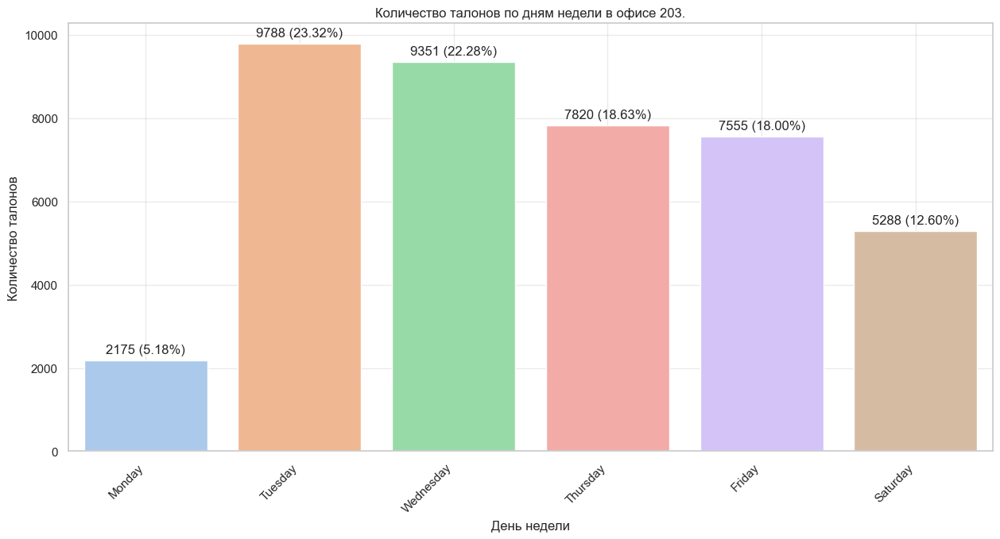

,день_недели,номер_талона,проценты
0,Monday,2175,5.181409
1,Tuesday,9788,23.317531
2,Wednesday,9351,22.276485
3,Thursday,7820,18.629249
4,Friday,7555,17.997951
5,Saturday,5288,12.597375


In [97]:
#создаем датафрейм для графика
tzt_plot = (
    tzt_office.groupby('день_недели')['номер_талона']
    .count()
    .reindex(order_days, fill_value=0)
    .reset_index()
)

#считаем проценты
tzt_plot['проценты'] = (tzt_plot['номер_талона'] / tzt_plot['номер_талона'].sum()) * 100

#сам график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='день_недели', y='номер_талона', data=tzt_plot, palette='pastel')

#настройка подписей
plt.xticks(rotation=45, ha='right')
plt.xlabel('День недели')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по дням недели в офисе 203.')
plt.grid(alpha=0.4)

#числовые значения в графике
for p, count, percent in zip(ax.patches, tzt_plot['номер_талона'], tzt_plot['проценты']):
    ax.annotate(f"{count:.0f} ({percent:.2f}%)",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()
tzt_plot

* Наблюдаем точно такую же картину как в и офисе ЖОР. Наиболее популярный день вторник 9 788(23.32%), далее идет по ниспадающей до субботы 5 288(12.6%)
* Понедельник, как мы предполагаем тоже входит в тестовый режим. Далее проверим. 

In [98]:
# посмотрим на понедельники
tzt_mondays = tzt_office[tzt_office['день_недели']== 'Monday']
tzt_mondays['дата'].value_counts().sort_index()

2023-01-09    145
2023-01-16    104
2023-01-23    107
2023-01-30    119
2023-02-06    137
2023-02-13    143
2023-02-20    133
2023-02-27    141
2023-03-06    123
2023-03-13    143
2023-03-20    176
2023-03-27    142
2023-04-03    137
2023-04-10    142
2023-04-17    149
2023-04-24    134
Name: дата, dtype: int64

In [99]:
#сравним с субботами
tzt_saturdays = tzt_office[tzt_office['день_недели']== 'Saturday']
tzt_saturdays['дата'].value_counts().sort_index()

2023-01-14     37
2023-01-21     44
2023-01-28     38
2023-02-04     59
2023-02-11     49
2023-02-18     52
2023-02-25     28
2023-03-04     44
2023-03-11     54
2023-03-18     53
2023-03-25     48
2023-04-01     33
2023-04-08     64
2023-04-15     63
2023-04-22     55
2023-04-29     61
2023-05-13     92
2023-05-20     85
2023-05-27    121
2023-06-03    109
2023-06-17    122
2023-06-24     79
2023-07-01     71
2023-07-08    114
2023-07-15     89
2023-07-22    111
2023-07-29    119
2023-08-05     93
2023-08-12    107
2023-08-19    126
2023-08-26    231
2023-09-02    266
2023-09-09    158
2023-09-16    144
2023-09-23    208
2023-09-30    196
2023-10-07    219
2023-10-14    181
2023-10-21    206
2023-10-28    165
2023-11-11    166
2023-11-18    150
2023-11-25    156
2023-12-02    145
2023-12-09    155
2023-12-16    196
2023-12-23    126
Name: дата, dtype: int64

* Так же поверхностный взгляд говорит о том что понедельник популярнее чем суббота. Но мы пока не можем этого с точностью утверждать и не ставим перед собой как цель это выяснить на данном этапе. Скорее всего мы не сможем произвести полное сравнение т.к. шло неравномерное распределение трудового ресурса в течении недели. 

#### Количество талонов по дням недели в офисе ДОР

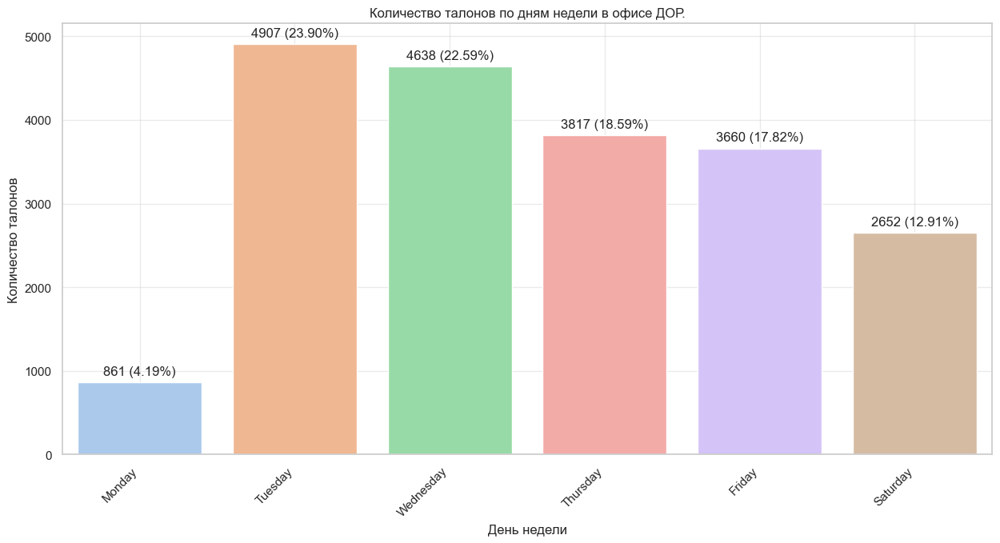

,день_недели,номер_талона,проценты
0,Monday,861,4.192841
1,Tuesday,4907,23.895788
2,Wednesday,4638,22.585829
3,Thursday,3817,18.587777
4,Friday,3660,17.823229
5,Saturday,2652,12.914536


In [100]:
#создаем датафрейм для графика
dor_plot = (
    dor_office.groupby('день_недели')['номер_талона']
    .count()
    .reindex(order_days, fill_value=0)
    .reset_index()
)

#считаем проценты
dor_plot['проценты'] = (dor_plot['номер_талона'] / dor_plot['номер_талона'].sum()) * 100

#сам график
plt.figure(figsize=(15, 7))
sns.set_palette('pastel')
ax = sns.barplot(x='день_недели', y='номер_талона', data=dor_plot, palette='pastel')

#настройка подписей
plt.xticks(rotation=45, ha='right')
plt.xlabel('День недели')
plt.ylabel('Количество талонов')
plt.title('Количество талонов по дням недели в офисе ДОР.')
plt.grid(alpha=0.4)

#числовые значения в графике
for p, count, percent in zip(ax.patches, dor_plot['номер_талона'], dor_plot['проценты']):
    ax.annotate(f"{count:.0f} ({percent:.2f}%)",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points')

plt.show()
dor_plot

* Наиболее популярный день вторник - 4 907 (23.90%),а самый непопулярный день суббота - 2 652 (12.91%), если не учитывать тестовый понедельник - 861 (4.19%)

In [101]:
# посмотрим на понедельники
dor_mondays = dor_office[dor_office['день_недели']== 'Monday']
dor_mondays['дата'].value_counts().sort_index()

2023-01-09    51
2023-01-16    53
2023-01-23    46
2023-01-30    39
2023-02-06    48
2023-02-13    60
2023-02-20    57
2023-02-27    58
2023-03-06    53
2023-03-13    51
2023-03-20    52
2023-03-27    62
2023-04-03    49
2023-04-10    62
2023-04-17    47
2023-04-24    73
Name: дата, dtype: int64

In [102]:
#сравним с субботами
dor_saturdays = dor_office[dor_office['день_недели']== 'Saturday']
dor_saturdays['дата'].value_counts().sort_index()

2023-01-14     22
2023-01-21     23
2023-01-28     24
2023-02-04     26
2023-02-11     25
2023-02-18     18
2023-02-25     20
2023-03-04     24
2023-03-11     23
2023-03-18     30
2023-03-25     26
2023-04-01     27
2023-04-08     18
2023-04-15     19
2023-04-22     24
2023-04-29     24
2023-05-13     53
2023-05-20     48
2023-05-27     54
2023-06-03     48
2023-06-17     51
2023-06-24     39
2023-07-01     64
2023-07-08     59
2023-07-15     63
2023-07-22     53
2023-07-29     63
2023-08-05     69
2023-08-12    103
2023-08-19     72
2023-08-26    119
2023-09-02     88
2023-09-09     75
2023-09-16     64
2023-09-23     84
2023-09-30     85
2023-10-07    101
2023-10-14     96
2023-10-21     87
2023-10-28     94
2023-11-11     88
2023-11-18     69
2023-11-25     76
2023-12-02     73
2023-12-09     82
2023-12-16    104
2023-12-23     55
Name: дата, dtype: int64

* На первый взгляд понедельник более популярен по сравнению с субботой, хотя по субботам происходят некоторые выбросы.

### Промежуточный итог по количеству талонов по дням недели
* Прежде всего нужно отметить что все рассматриваемые офисы разные. Как по размеру и количеству персонала в нем, так и расположением и проходимостью включая так же и разные графики работы этих офисов, сделано это было для максимального комфорта для клиентов исходя из производственных мощностей. 

* Общие данные говорят что самыми популярными днями у клиентов являются как вторник(95 408 талонов(21.16%)) и среда(95 011 талонов (21.07%)) за ними идут четверг(84 373 талонов (18.71%)) и пятница(82 738 талонов (18.35%)), далее идет понедельник(71 577 талонов (15.87%)) и самым непопулярным днем выглядит суббота(21 832 талонов (4.84%))
* Наиболее крупный офис ГО показывает что:
    * Наибольшее количество талонов выдано в среду - 48 236 (20.73%), а также немного отстает вторник - 47 829 (20.56%).
    * Понедельник, четверг и пятница имеют примерно одинаковое количество талонов, около 18%, в то время как суббота сильно отстает - всего 7,306 (3.14%).
    * Лидерство среды можно объяснить тем, что в этот день офис ГО работает на 2 часа дольше, что может привлекать больше клиентов.
    * Интересно отметить большое количество выданных талонов во вторник. Возможно, в этот день существует определенная активность или условия, привлекающие клиентов.
    * Отставание субботы также объясняется графиком работы, так как это сокращенный рабочий день. Меньшее количество часов работы сказывается на общем количестве выданных талонов.
* Офис 123 :
    * У офиса 123 схожий график работы с офисом ГО, поэтому тут так же лидирует по выданным талонам среда - 16 342(21.11%), и так же после неё сразу идет (уже с некоторым отрывом) вторник - 15 671(20.25%).
    * Понедельник, четверг, пятница имеют схожие показатели в примерные 18% (от 14 170 до 14 344 талонов)
    * Так же сильно отстает суббота 2 648(3.42%)
* У офиса ЯРИ пятнидневка с понедельника по пятницу весь 2023 год. И наибольшее количество талонов выдано в понедельник - 9 075(21.01%), наименьшее в четверг - 8 223 (19.04%). Но в целом распределение талонов по дням недели выглядит более равномерным чем в других офисах. 
* Офис ЖОР:
    * Наибольшее количество талонов было выдано во вторник 8 207(23.35%), наименьшее в субботу - 3938(11.20%) если не считать понедельники - 2 028 (5.77%), в которые этот офис работал  до апреля. 
    * Офис работал в тестовом режиме по понедельникам почти полные 4 месяца с января по апрель включительно. Суммарно по  понедельникам выдано 2 028 талонов. 
    * Поверхностное сравнение суббот и понедельников дает нам понять что клиенты предпочитают понедельники. 
* Офис 203:
    * Наблюдаем точно такую же картину как в и офисе ЖОР. Наиболее популярный день вторник 9 788(23.32%), далее идет по ниспадающей до субботы 5 288(12.6%)
    * Понедельник тоже входит в тестовый режим. Поверхностный взгляд говорит о том что понедельник популярнее чем суббота. Но мы пока не можем этого с точностью утверждать и не ставим перед собой как цель это выяснить на данном этапе. Скорее всего мы не сможем произвести полное сравнение т.к. шло неравномерное распределение трудового ресурса в течении недели. 
* Офис ДОР:
    * Наиболее популярный день вторник - 4 907 (23.90%),а самый непопулярный день суббота - 2 652 (12.91%), если не учитывать тестовый понедельник - 861 (4.19%)

* Насколько мы знаем, график в работы в среду выстроен в 2 смены и офисы работают дольше обычного, для большего охвата аудитории. Но как мы видим, в большинстве случаев обычный будний вторник стоит либо наравне либо опережает среду по количеству выданных талонов. 

## Медианное время ожидания в зависимости от дня недели:
#### Общее

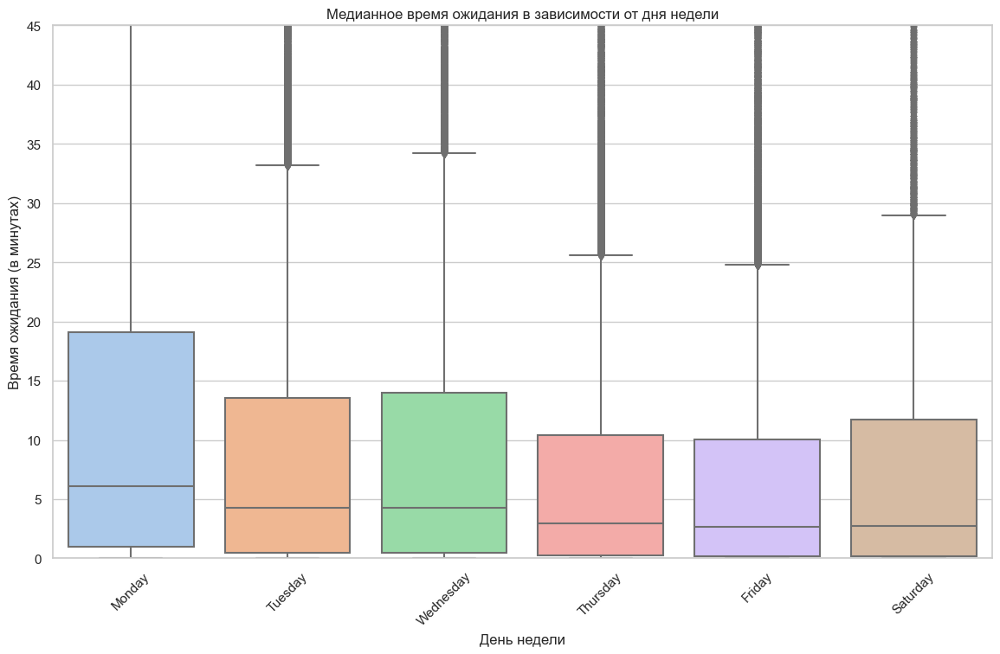

день_недели
Monday      0 days 00:06:04
Tuesday     0 days 00:04:15
Wednesday   0 days 00:04:18
Thursday    0 days 00:02:58
Friday      0 days 00:02:41
Saturday    0 days 00:02:46
Name: ожидание, dtype: timedelta64[ns]

In [103]:
#преобразовываем столбец 'день_недели' в тип данных категории с определенным порядком
data['день_недели'] = pd.Categorical(data['день_недели'], categories=order_days, ordered=True)

#график
plt.figure(figsize=(14, 8))
sns.boxplot(x='день_недели', y='мин_ожидание', data=data.sort_values('день_недели')) 
plt.xlabel('День недели')
plt.ylabel('Время ожидания (в минутах)')
plt.title('Медианное время ожидания в зависимости от дня недели')
plt.ylim([0, 45])
plt.xticks(rotation=45)
plt.show()

#минутная таблица медианного значения
display(data.groupby('день_недели')['ожидание'].median().reindex(order_days))

In [104]:
#выведем для сравнения средние значения
display(data.groupby('день_недели')['ожидание'].mean().reindex(order_days))

день_недели
Monday      0 days 00:17:37.543009625
Tuesday     0 days 00:13:27.390858208
Wednesday   0 days 00:14:07.749386913
Thursday    0 days 00:10:35.728396524
Friday      0 days 00:09:57.059670284
Saturday    0 days 00:10:32.213814584
Name: ожидание, dtype: timedelta64[ns]

* Ящики с усиками показывают что в понедельник разброс ожидания выше всего. 
* Медианное ожидание ниже всего в пятницу и достигает 2 минуты 41 секунды. Наибольшее медианное ожидание достигает в понедельник и равняется 6 минутам 4 секундам.
* Для сравнения, самое короткое среднее ожидание так же в пятницу, 9 минут 57 секунд. Самое долгое среднее ожидание в понедельник и составляет 17 минут 37 секунд. 
* Общее сравнение вторника и среды показывает что вторник, немного но лучше в плане ожидания в очереди, медианные 04:15 у вторника и 04:18, а так же рсдение 13:27 у вторника и 14:07 у среды. 

#### Медианное время ожидания в зависимости от дня недели в офисе ГО

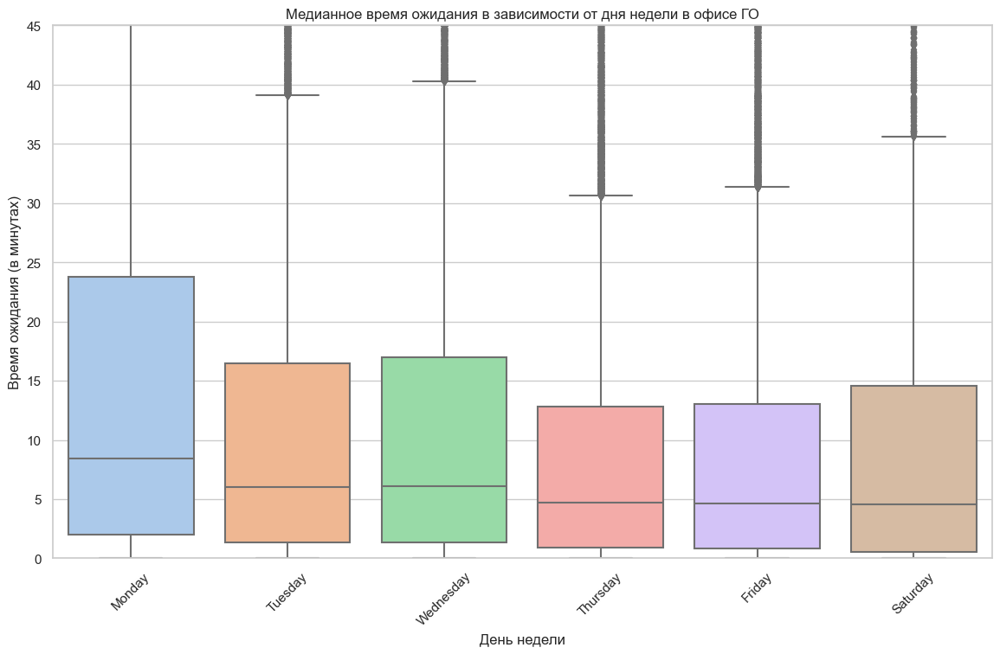

день_недели
Monday      0 days 00:08:25
Tuesday     0 days 00:06:03
Wednesday   0 days 00:06:04
Thursday    0 days 00:04:42
Friday      0 days 00:04:37
Saturday    0 days 00:04:34
Name: ожидание, dtype: timedelta64[ns]

In [105]:
#преобразовываем столбец 'день_недели' в тип данных категории с определенным порядком
go_office['день_недели'] = pd.Categorical(go_office['день_недели'], categories=order_days, ordered=True)

#график
plt.figure(figsize=(14, 8))
sns.boxplot(x='день_недели', y='мин_ожидание', data=go_office.sort_values('день_недели')) 
plt.xlabel('День недели')
plt.ylabel('Время ожидания (в минутах)')
plt.title('Медианное время ожидания в зависимости от дня недели в офисе ГО')
plt.ylim([0, 45])
plt.xticks(rotation=45)
plt.show()

#таблица медианного ожидания по дням недели
go_office.groupby('день_недели')['ожидание'].median().reindex(order_days)

In [106]:
#таблица среднего ожидания по дням недели
go_office.groupby('день_недели')['ожидание'].mean().reindex(order_days)

день_недели
Monday      0 days 00:20:50.136353088
Tuesday     0 days 00:16:11.456773087
Wednesday   0 days 00:16:59.504229206
Thursday    0 days 00:13:24.928292794
Friday      0 days 00:12:44.614374179
Saturday    0 days 00:12:54.596906652
Name: ожидание, dtype: timedelta64[ns]

* Ящики с усиками показывают что в понедельник разброс ожидания выше всего. Самый низкий разброс ожидания в четверг.
* Медианное ожидание ниже всего в пятницу и достигает 4 минуты 34 секунды, но стоит отметить пятница с четверг отстают не более чем на 8 секунд. Наибольшее медианное ожидание достигает в понедельник и равняется 8 минутам 25 секундам.
* Для сравнения, самое короткое среднее ожидание так же в пятницу, 12 минут 44 секунд. Самое долгое среднее ожидание в понедельник и составляет 20 минут 50 секунд. 
* Среднее ожидание во вторник 16:11, а в среду 16:59, а медианное ожидание очень еще ближе, во вторник 06:03 и в среду 06:04. 

#### Медианное время ожидания в зависимости от дня недели в офисе 123

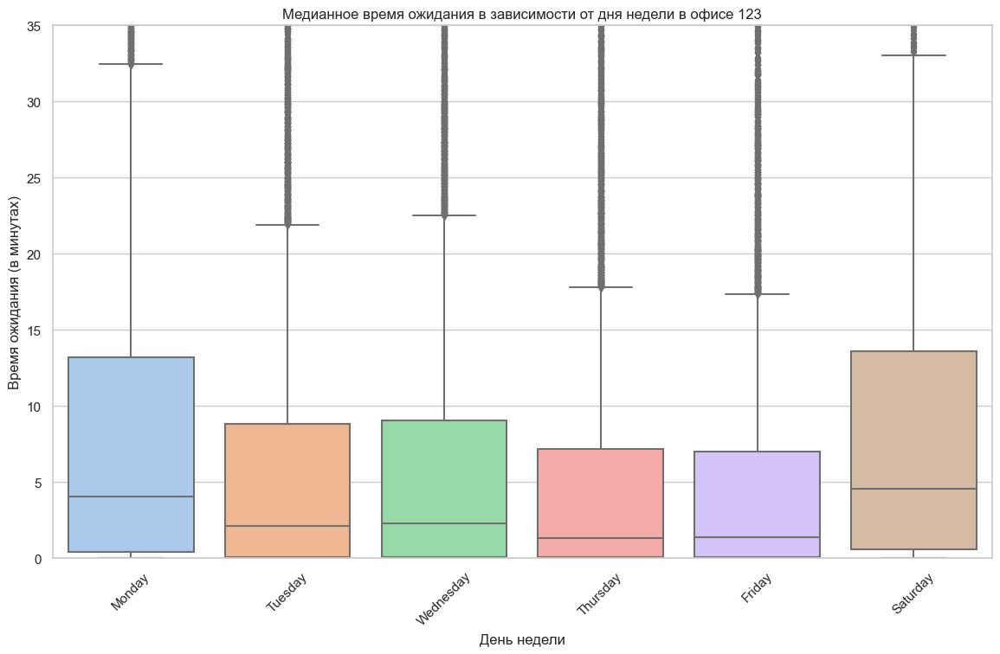

день_недели
Monday      0 days 00:04:04
Tuesday     0 days 00:02:09
Wednesday   0 days 00:02:19
Thursday    0 days 00:01:20
Friday      0 days 00:01:24
Saturday    0 days 00:04:35
Name: ожидание, dtype: timedelta64[ns]

In [107]:
#преобразовываем столбец 'день_недели' в тип данных категории с определенным порядком
ott_office['день_недели'] = pd.Categorical(ott_office['день_недели'], categories=order_days, ordered=True)

#график
plt.figure(figsize=(14, 8))
sns.boxplot(x='день_недели', y='мин_ожидание', data=ott_office.sort_values('день_недели')) 
plt.xlabel('День недели')
plt.ylabel('Время ожидания (в минутах)')
plt.title('Медианное время ожидания в зависимости от дня недели в офисе 123')
plt.ylim([0, 35])
plt.xticks(rotation=45)
plt.show()

#таблица медианного ожидания по дням недели
ott_office.groupby('день_недели')['ожидание'].median().reindex(order_days)

In [108]:
#таблица среднего ожидания по дням недели
ott_office.groupby('день_недели')['ожидание'].mean().reindex(order_days)

день_недели
Monday      0 days 00:13:56.191717791
Tuesday     0 days 00:09:36.305277263
Wednesday   0 days 00:10:08.917329580
Thursday    0 days 00:07:31.750952717
Friday      0 days 00:07:31.783650804
Saturday    0 days 00:11:14.628776435
Name: ожидание, dtype: timedelta64[ns]

* По графику мы видим что в офисе 123 разброс значений в целом ниже чем в офисе ГО, что так же отображается в "высоте" графика отображающей время ожидания клиентов в очереди. Мы снизили его с 45 до 35
* Ящики с усиками показывают что в субботу разброс ожидания выше всего. Самый низкий разброс ожидания в четверг, но разница с пятнице крайне мала. 
* Медианное ожидание ниже всего в пятницу и достигает 4 минуты 34 секунды, но стоит отметить пятница с четверг отстают не более чем на 8 секунд. Наибольшее медианное ожидание достигает в понедельник и равняется 8 минутам 25 секундам.
* Для сравнения, самое короткое среднее ожидание так же в пятницу, 12 минут 44 секунд. Самое долгое среднее ожидание в понедельник и составляет 20 минут 50 секунд. 
* Во вторник среднее ожидание 09:36, в среду 10:08, медианное ожиданиево вторник 02:09, в среду 02:19.

#### Медианное время ожидания в зависимости от дня недели в офисе ЯРИ

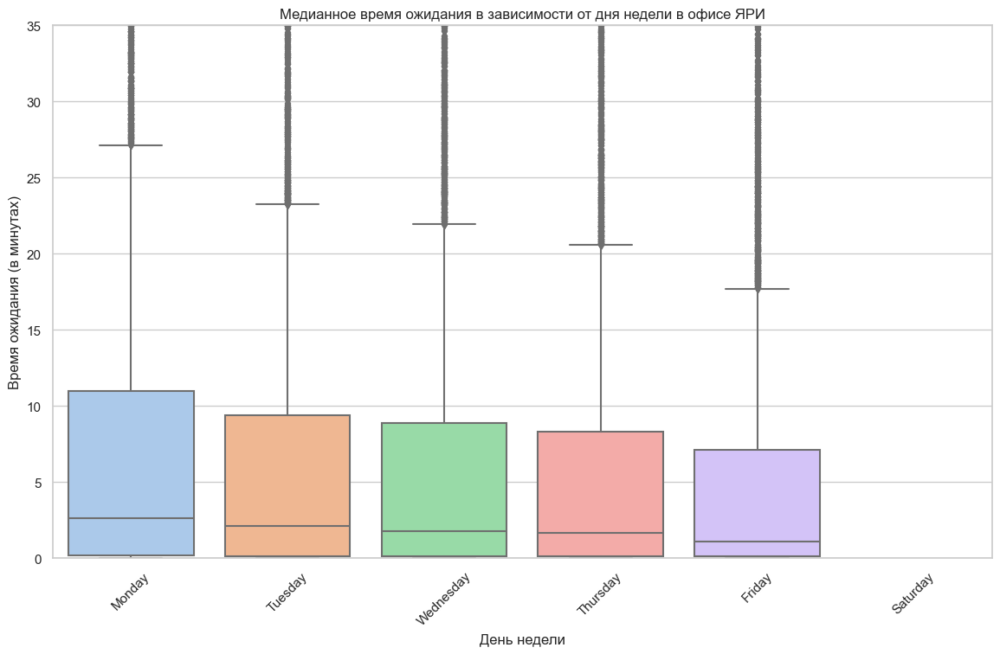

день_недели
Monday      0 days 00:02:38
Tuesday     0 days 00:02:07
Wednesday   0 days 00:01:46
Thursday    0 days 00:01:41
Friday      0 days 00:01:07
Saturday                NaT
Name: ожидание, dtype: timedelta64[ns]

In [109]:
#преобразовываем столбец 'день_недели' в тип данных категории с определенным порядком
yari_office['день_недели'] = pd.Categorical(yari_office['день_недели'], categories=order_days, ordered=True)

#график
plt.figure(figsize=(14, 8))
sns.boxplot(x='день_недели', y='мин_ожидание', data=yari_office.sort_values('день_недели')) 
plt.xlabel('День недели')
plt.ylabel('Время ожидания (в минутах)')
plt.title('Медианное время ожидания в зависимости от дня недели в офисе ЯРИ')
plt.ylim([0, 35])
plt.xticks(rotation=45)
plt.show()

#таблица медианного ожидания по дням недели
yari_office.groupby('день_недели')['ожидание'].median().reindex(order_days)

In [110]:
#таблица среднего ожидания по дням недели
yari_office.groupby('день_недели')['ожидание'].mean().reindex(order_days)

день_недели
Monday      0 days 00:11:34.848264462
Tuesday     0 days 00:08:42.691761048
Wednesday   0 days 00:08:21.991449040
Thursday    0 days 00:07:58.359479508
Friday      0 days 00:06:51.005581846
Saturday                          NaT
Name: ожидание, dtype: timedelta64[ns]

* По графику мы видим что в офисе ЯРИ разброс значений в целом низкий, минимальный разброс проглядывается в пятницу. Интересный результат, учитывая что в четвер и пятницу выдается одинаковое количество талонов. 
* Медианное ожидание ниже всего в пятницу и достигает 1 минуты 7 секунд. Наибольшее медианное ожидание достигает в понедельник и равняется 2 минутам 38 секундам. Как мы видим, разница не очень большая. 
* Для сравнения, самое короткое среднее ожидание так же в пятницу, 6 минут 51 секунд. Самое долгое среднее ожидание в понедельник и составляет 11 минут 34 секунд. 
* Во вторник среднее ожидание 08:42, в среду 08:21, медианное ожиданиево вторник 02:07, в среду 01:46. Стоит учитывать что у офиса ЯРИ особый режим работы (обычная пятидневка с 9 до 6, с понедельника по пятницу).

#### Медианное время ожидания в зависимости от дня недели в офисе ЖОР

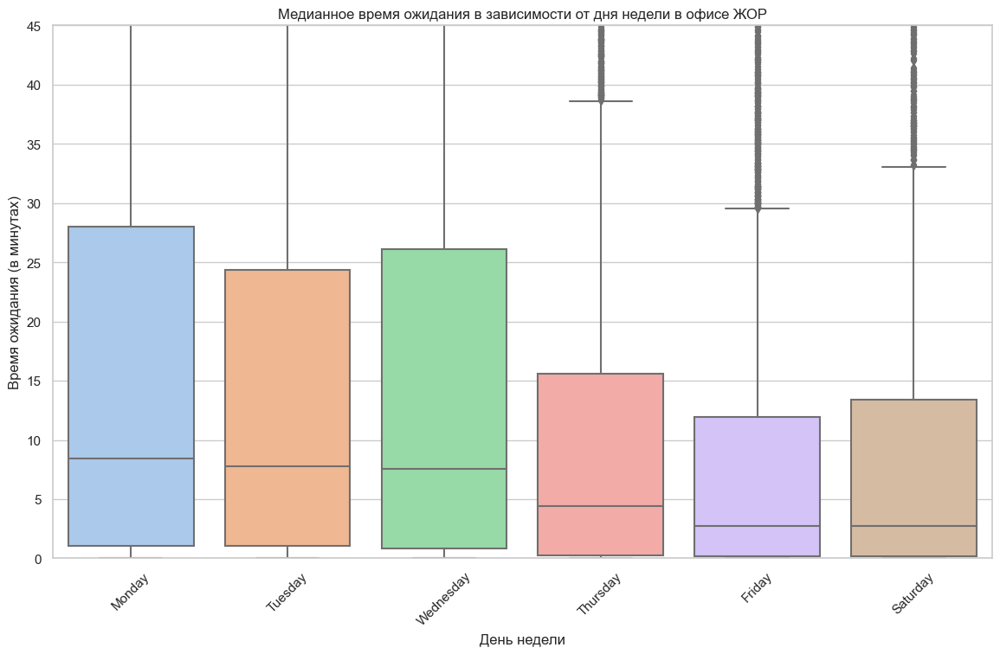

день_недели
Monday      0 days 00:08:24.500000
Tuesday            0 days 00:07:45
Wednesday   0 days 00:07:33.500000
Thursday           0 days 00:04:25
Friday             0 days 00:02:44
Saturday           0 days 00:02:42
Name: ожидание, dtype: timedelta64[ns]

In [111]:
#преобразовываем столбец 'день_недели' в тип данных категории с определенным порядком
jor_office['день_недели'] = pd.Categorical(jor_office['день_недели'], categories=order_days, ordered=True)

#график
plt.figure(figsize=(14, 8))
sns.boxplot(x='день_недели', y='мин_ожидание', data=jor_office.sort_values('день_недели')) 
plt.xlabel('День недели')
plt.ylabel('Время ожидания (в минутах)')
plt.title('Медианное время ожидания в зависимости от дня недели в офисе ЖОР')
plt.ylim([0, 45])
plt.xticks(rotation=45)
plt.show()

#таблица медианного ожидания по дням недели
jor_office.groupby('день_недели')['ожидание'].median().reindex(order_days)

In [112]:
#таблица среднего ожидания по дням недели
jor_office.groupby('день_недели')['ожидание'].mean().reindex(order_days)

день_недели
Monday      0 days 00:21:52.379191321
Tuesday     0 days 00:19:22.670525161
Wednesday   0 days 00:19:58.126829268
Thursday    0 days 00:12:08.975306816
Friday      0 days 00:09:56.201619181
Saturday    0 days 00:11:49.212036566
Name: ожидание, dtype: timedelta64[ns]

* По графику мы видим что в офисе ЖОР разброс значений значительный. Правда нужно учитывать что офис работал по понедельникам в тестовом режиме. И наибольшее количество талонов было выдано во вторник, а потом уже в среду, но ящик с усиками показывает что разброс ожидания в очереди в среду немного, но выше. Предположительно это вызвано распределением графика работы сотрудников. 
* Медианное ожидание ниже всего в субботу и достигает 2 минуты 42 секунд. Наибольшее медианное ожидание достигает во вторник и равняется 7 минутам 45 секундам.(в связи с тем что понедельник был тестовый, мы его в расчет не берем)  
* Для сравнения, самое короткое среднее ожидание в пятницу, 9 минут 56 секунд. Самое долгое среднее ожидание в среду и составляет 19 минут 58 секунд.(в связи с тем что понедельник был тестовый, мы его в расчет не берем)  
* Учитывая все вышеперечисленное мы можем утверждать что выбросы ожидания чаще всего происходит в среду. Т.к. ящик с усиками показывает повышенный разброс, а так же разница между медианным ожиданием и средним настолько высока, что меняется порядок между рейтингами. 
* Во вторник среднее ожидание 19:22, в среду 19:58, медианное ожидание во вторник 07:45, в среду 07:33. 

#### Медианное время ожидания в зависимости от дня недели в офисе 203

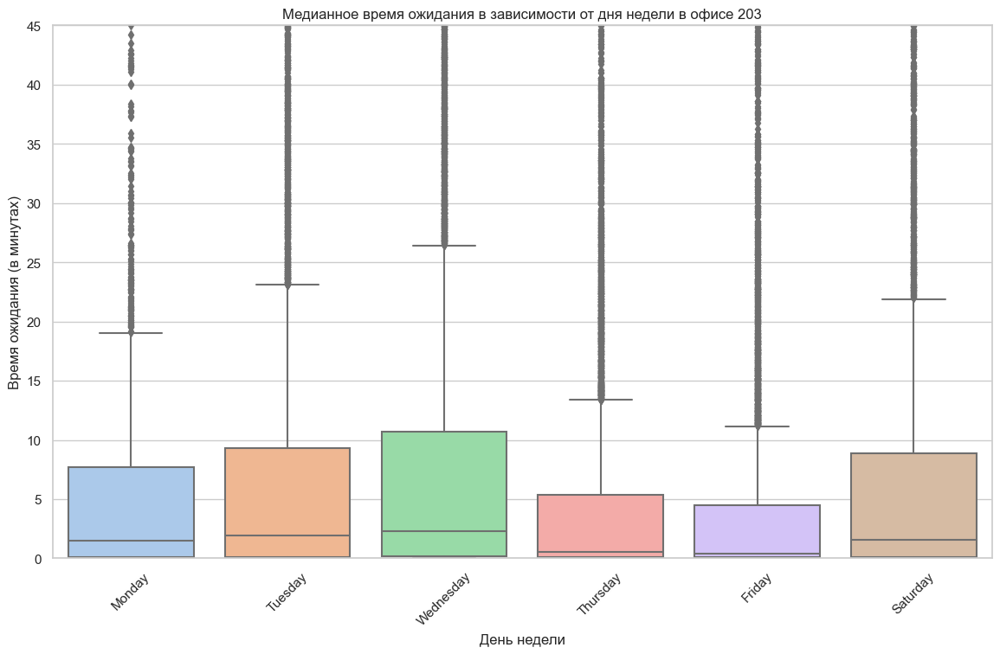

день_недели
Monday             0 days 00:01:28
Tuesday            0 days 00:01:54
Wednesday          0 days 00:02:19
Thursday    0 days 00:00:30.500000
Friday             0 days 00:00:22
Saturday           0 days 00:01:32
Name: ожидание, dtype: timedelta64[ns]

In [113]:
#преобразовываем столбец 'день_недели' в тип данных категории с определенным порядком
tzt_office['день_недели'] = pd.Categorical(tzt_office['день_недели'], categories=order_days, ordered=True)

#график
plt.figure(figsize=(14, 8))
sns.boxplot(x='день_недели', y='мин_ожидание', data=tzt_office.sort_values('день_недели')) 
plt.xlabel('День недели')
plt.ylabel('Время ожидания (в минутах)')
plt.title('Медианное время ожидания в зависимости от дня недели в офисе 203')
plt.ylim([0, 45])
plt.xticks(rotation=45)
plt.show()

#таблица медианного ожидания по дням недели
tzt_office.groupby('день_недели')['ожидание'].median().reindex(order_days)

In [114]:
#таблица среднего ожидания по дням недели
tzt_office.groupby('день_недели')['ожидание'].mean().reindex(order_days)

день_недели
Monday      0 days 00:05:52.602758620
Tuesday     0 days 00:09:27.786166734
Wednesday   0 days 00:10:14.133461661
Thursday    0 days 00:04:55.872122762
Friday      0 days 00:05:01.291859695
Saturday    0 days 00:08:17.381429652
Name: ожидание, dtype: timedelta64[ns]

* Сразу бросается в глаза очень низкий разброс медианного ожидания на графике. Особенно в пятницу, он менее 5 минут. 
* Медианное ожидание ниже всего в пятницу и достигает 22 секунд! Наибольшее медианное ожидание достигает в среду и равняется 2 минутам 19 секундам. Очень впечятляющие цифры. (в связи с тем что понедельник был тестовый, мы его в расчет не берем)  
* Для сравнения, самое короткое среднее ожидание в четверг, 4 минут 55 секунд. Самое долгое среднее ожидание в среду и составляет 10 минут 14 секунд.(в связи с тем что понедельник был тестовый, мы его в расчет не берем)  
* Во вторник среднее ожидание 09:27, в среду 10:14, медианное ожидание во вторник 01:54, в среду 02:19. 

#### Медианное время ожидания в зависимости от дня недели в офисе ДОР

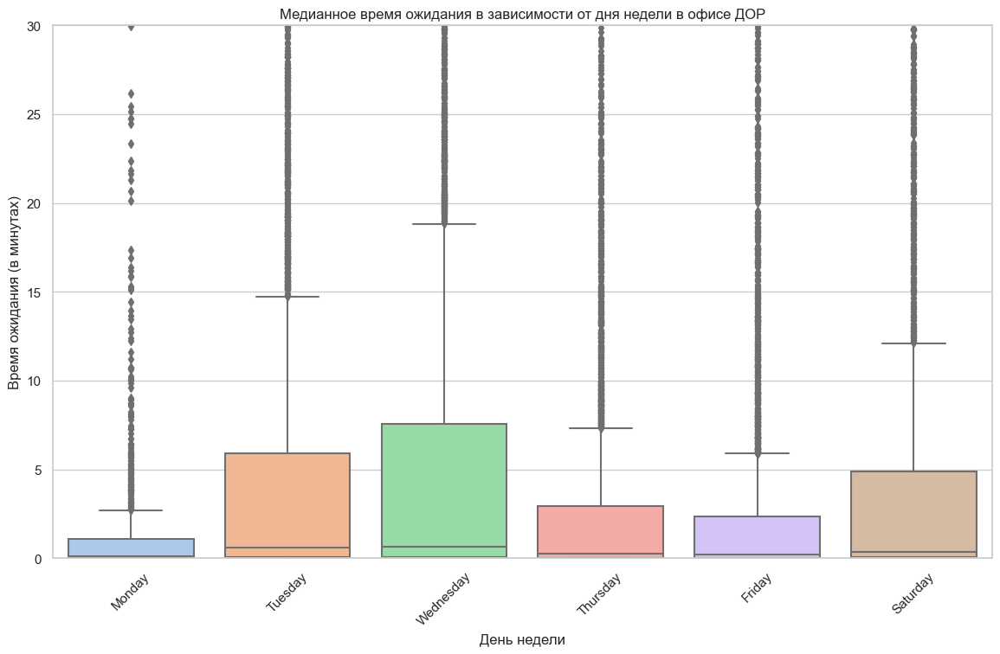

день_недели
Monday             0 days 00:00:07
Tuesday            0 days 00:00:36
Wednesday          0 days 00:00:40
Thursday           0 days 00:00:15
Friday      0 days 00:00:12.500000
Saturday           0 days 00:00:23
Name: ожидание, dtype: timedelta64[ns]

In [115]:
#преобразовываем столбец 'день_недели' в тип данных категории с определенным порядком
dor_office['день_недели'] = pd.Categorical(dor_office['день_недели'], categories=order_days, ordered=True)

#график
plt.figure(figsize=(14, 8))
sns.boxplot(x='день_недели', y='мин_ожидание', data=dor_office.sort_values('день_недели')) 
plt.xlabel('День недели')
plt.ylabel('Время ожидания (в минутах)')
plt.title('Медианное время ожидания в зависимости от дня недели в офисе ДОР')
plt.ylim([0, 30])
plt.xticks(rotation=45)
plt.show()

#таблица медианного ожидания по дням недели
dor_office.groupby('день_недели')['ожидание'].median().reindex(order_days)

In [116]:
#таблица среднего ожидания по дням недели
dor_office.groupby('день_недели')['ожидание'].mean().reindex(order_days)

день_недели
Monday      0 days 00:01:49.038327526
Tuesday     0 days 00:05:52.470144691
Wednesday   0 days 00:07:10.655454937
Thursday    0 days 00:04:16.980875032
Friday      0 days 00:04:01.037431693
Saturday    0 days 00:05:52.126696832
Name: ожидание, dtype: timedelta64[ns]

* Так же как и в офисе 203 видим низкий разброс ожидания, но он тут еще ниже. Разброс ящика менее пяти минут в четверг, пятницу и субботу. 
* Медианное ожидание ниже всего в пятницу и достигает 12,5 секунд! Наибольшее медианное ожидание достигает в среду и равняется 40 секундам! Очень впечятляющие цифры. (в связи с тем что понедельник был тестовый, мы его в расчет не берем)  
* Для сравнения, самое короткое среднее ожидание в пятницу, 4 минут 1 секунда. Самое долгое среднее ожидание в среду и составляет 7 минут 10 секунд.(в связи с тем что понедельник был тестовый, мы его в расчет не берем) 
* Во вторник среднее ожидание 05:52, в среду 04:16, медианное ожидание во вторник 00:36, в среду 00:04. 

#### Промежуточный итог
* Общие тренды:
    * Разброс ожидания в понедельник выше всего. Это отражается как в случае общего анализа, так и в рассмотрении каждого офиса отдельно.
    * Медианное ожидание наименьшее в пятницу. Пятница также имеет самое короткое среднее ожидание.
    * Наибольшее медианное ожидание наблюдается в понедельник. Это также подтверждается высоким средним ожиданием в этот день.
    * Вторник лучше среды по медианному и среднему ожиданию, хоть и немного, но учитывая что по количеству выданных талонов они почти наравне, это лучшее сравнение этих двух дней. 

* Анализ по офисам:
    * Офис ГО: Разброс ожидания в понедельник высок, но среднее и медианное ожидание выше всего в понедельник.
    * Офис 123: Разброс значений ниже, чем в офисе ГО. Медианное ожидание во вторник лучше, чем в среду.
    * Офис ЯРИ: Низкий разброс и стабильное медианное ожидание, особенно в пятницу. Вторник средний и медианный лучше среды.
    * Офис ЖОР: Высокий разброс и долгие ожидания в среду. Вторник и среда имеют самые высокие средние и медианные ожидания.
    * Офис 203: Низкий разброс и крайне короткое медианное ожидание в пятницу. Среднее и медианное ожидание в среду выше.
    * Офис ДОР: Низкий разброс и впечатляюще низкое медианное ожидание в пятницу. Среднее и медианное ожидание в среду выше.

* Обобщенно, офисы 203 и ДОР выделяются низким разбросом и короткими времени ожидания, особенно в пятницу. Офис ЖОР имеет более высокие значения и большой разброс, особенно в среду.

## Тепловые карты по неделям
### Общие сведения
#### Общий heatmap по выдаче талонов.

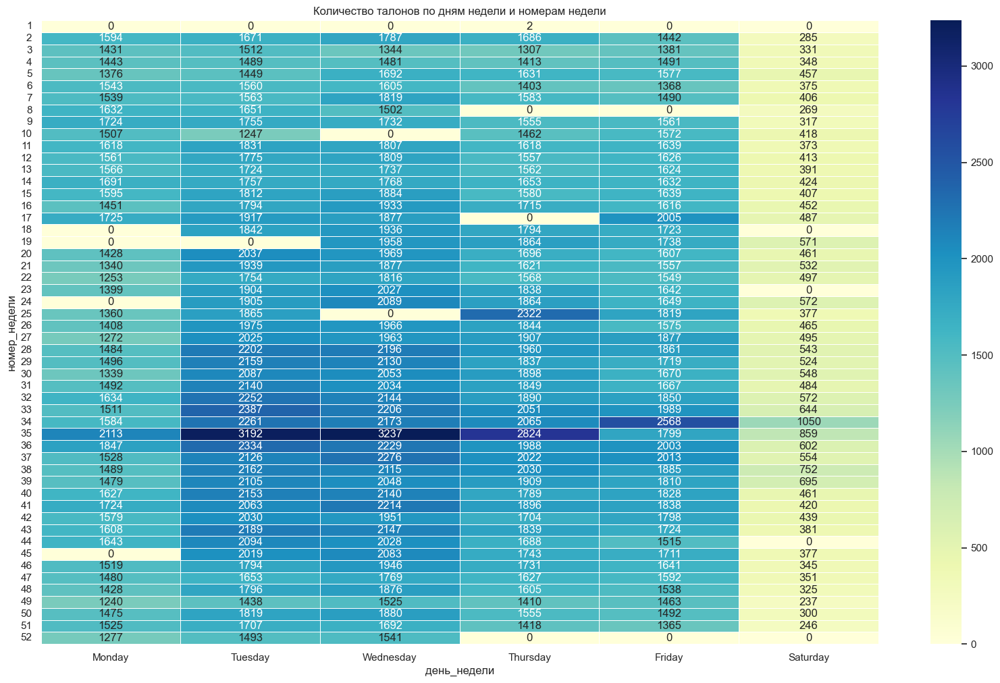

In [117]:
#таблица для тепловой карты
data_heatmap = data.pivot_table(values='номер_талона', index='номер_недели', columns='день_недели', aggfunc='count', fill_value=0)

#сортировка по дням недели
data_heatmap = data_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(data_heatmap, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество талонов по дням недели и номерам недели')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* На тепловой карте выданных талонов, мы видим что по понедельникам и субботам выдается меньше талонов. Скорее всего это связано с режимом работы и распределением трудовых ресурсов. Так же видны дни когда не выдвались талоны, это у нас праздничные и выходные дни.
* Хорошо и отчетливо видно что допольно плотно затемнена 35 неделя(понедельник, 28 августа – воскресенье, 3 сентября 2023 г), выглядит как подготовка к 1 сентября. 

#### Общий heatmap по количеству сотрудников

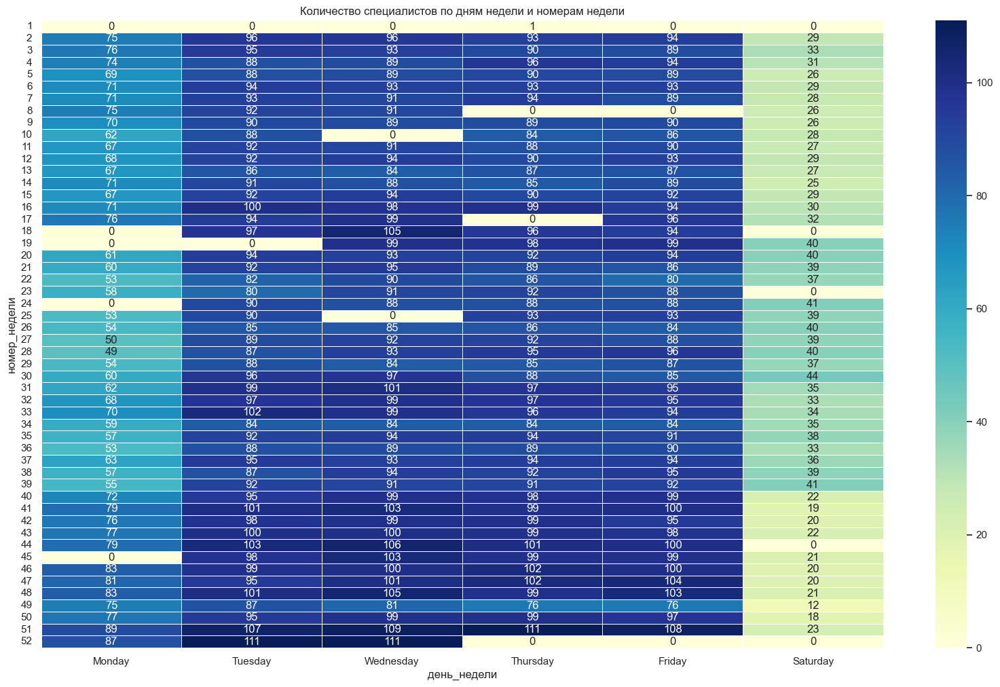

In [118]:
#таблица для тепловой карты
all_special = data.pivot_table(values='номер_оператора', index='номер_недели', columns='день_недели', aggfunc='nunique', fill_value=0)

#сортировка по дням недели
all_special = all_special[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(all_special, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество специалистов по дням недели и номерам недели')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* На этой тепловой карте мы видим что количество сотрудников уменьшается по субботам и по понедельникам, мы можем предположить особенности распределения в рабочем графике. 

#### Общий heatmap по соотношению количества выданных талонов на количество сотрудников в этот день. 

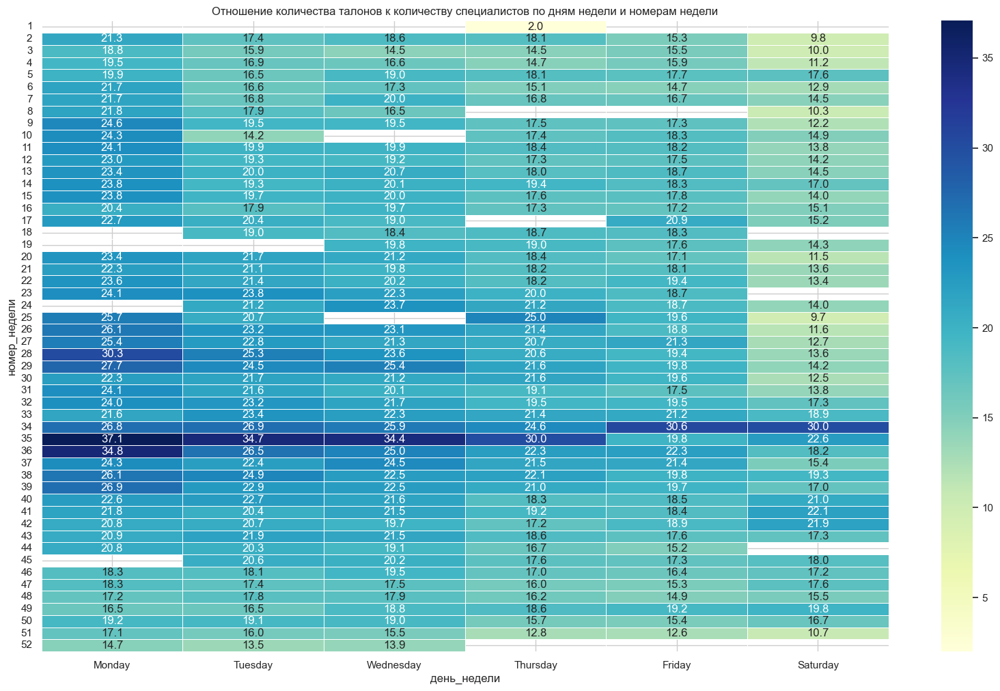

In [119]:
#соотношение
talons_per_operator = data_heatmap / all_special

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(talons_per_operator, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)

#настройка
plt.title('Отношение количества талонов к количеству специалистов по дням недели и номерам недели')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Нагрузка распределена более менее равномерно. Но мы видим что самые темные участки проглядываются на 35 неделе, это последняя неделя августа и начало сентября. 

#### Общий heatmap по среднему ожиданию в очереди в минутах. 

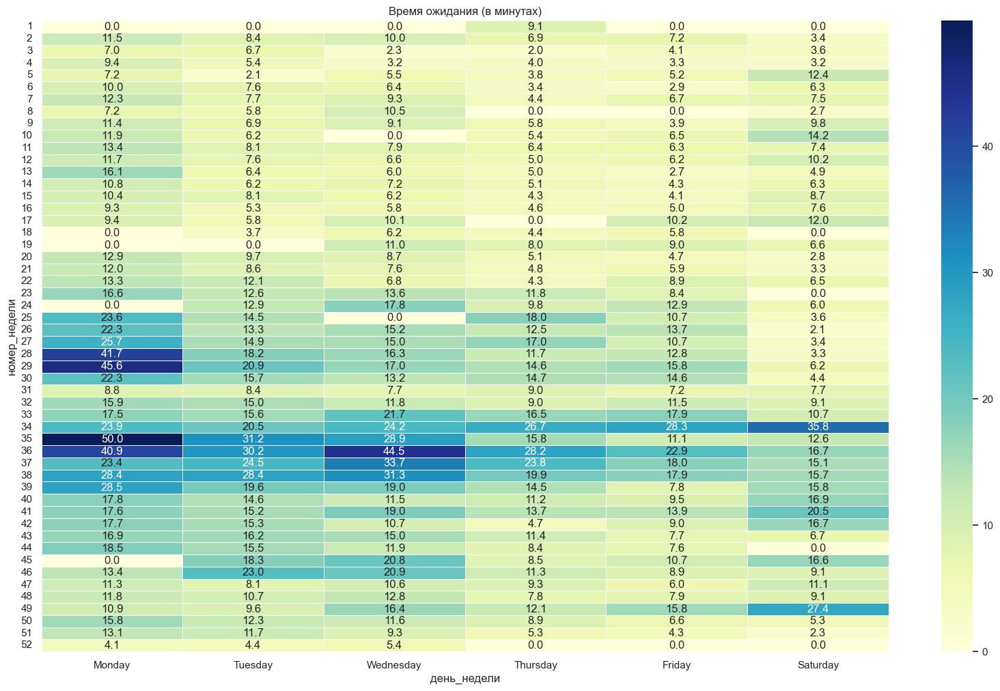

In [120]:
#таблица для тепловой карты
wait_heatmap = data.pivot_table(values='мин_ожидание', index='номер_недели', columns='день_недели', aggfunc='mean', fill_value=0)
wait_heatmap = wait_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(wait_heatmap, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)  

#настройка
plt.title('Время ожидания (в минутах)')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Наиболее часто среднее ожидание в минутах подскакивает по понедельникам с середины года. Наиболее же большое ожидание начинается с конца августа и продолжается в сентябре. 

### Сведения из офиса ГО
#### heatmap по выдаче талонов в офисе ГО

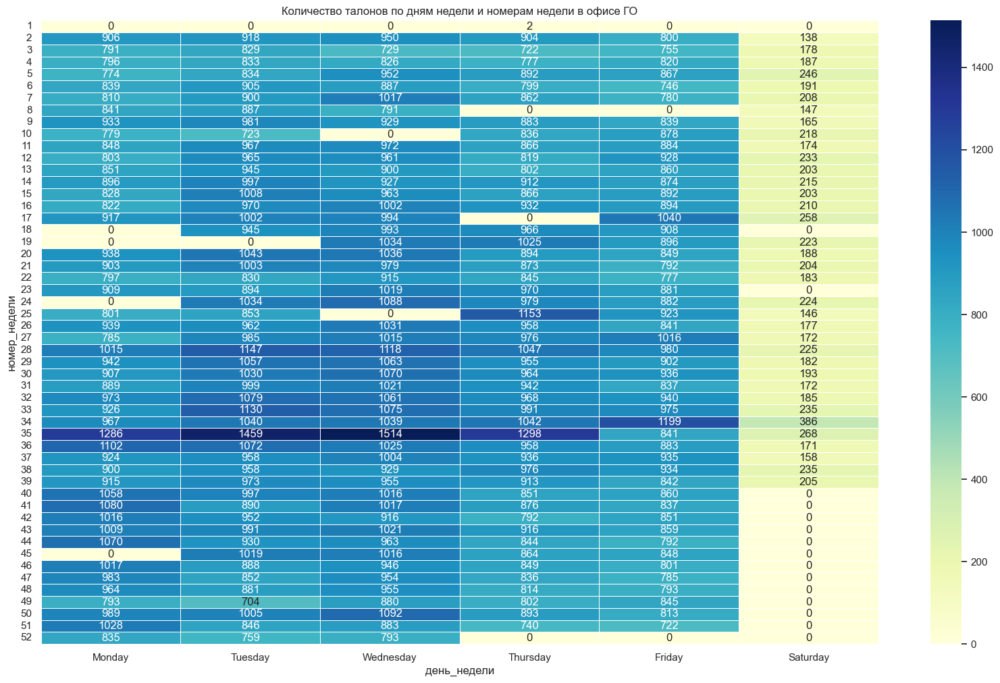

In [121]:
#таблица для тепловой карты
go_heatmap = go_office.pivot_table(values='номер_талона', index='номер_недели', columns='день_недели', aggfunc='count', fill_value=0)

#сортировка по дням недели
go_heatmap = go_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(go_heatmap, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество талонов по дням недели и номерам недели в офисе ГО')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Как мы видим с 40 недели (начало октября) офис ГО поменял график работы, и перестал принимать клиентов по субботам. Это вылилось в увеличение количества выданных талонов по понедельникам. 
* Но наибольшее количество выданных талонов все же наблюдается на 35 неделе (конец августа, начало сентября).
* Исходя из цвета таблицы можно сказать что в первой половине года выдавалось чуть меньше талонов. 

#### heatmap по количеству сотрудников  в офисе ГО

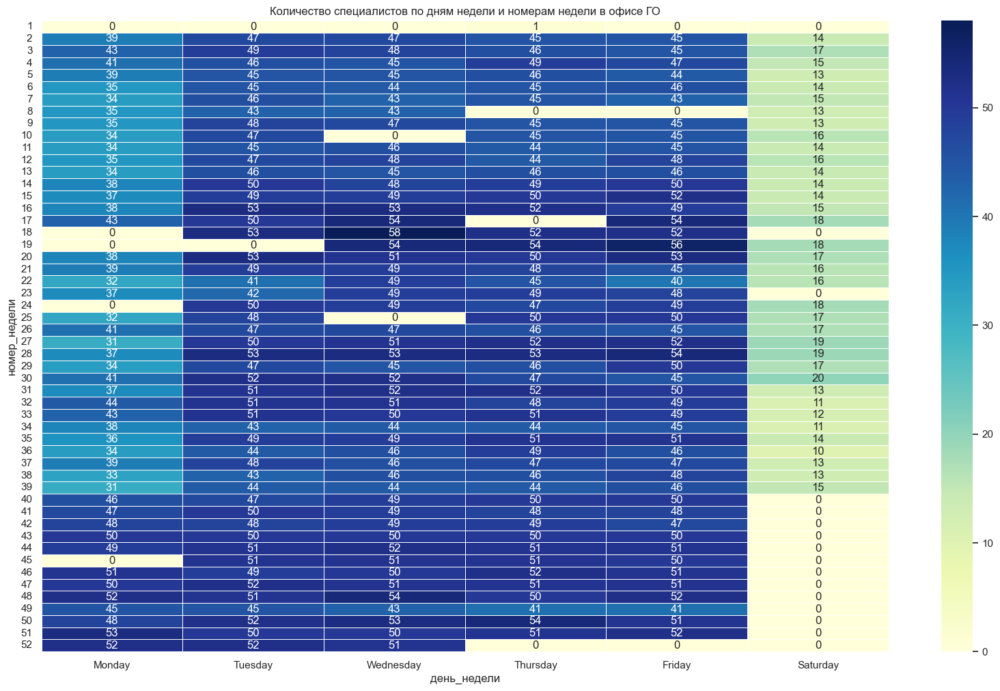

In [122]:
#таблица для тепловой карты
go_special = go_office.pivot_table(values='номер_оператора', index='номер_недели', columns='день_недели', aggfunc='nunique', fill_value=0)

#сортировка по дням недели
go_special = go_special[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(go_special, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество специалистов по дням недели и номерам недели в офисе ГО')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Количество сотрудников так же подтверждает изменение рабочего графика офиса ГО. Количество сотрудников по понедельникам с октября(40 неделя) и больше нет сотрудников в субботу с этого времени. 

#### heatmap по соотношению количества выданных талонов на количество сотрудников в этот день в офисе ГО

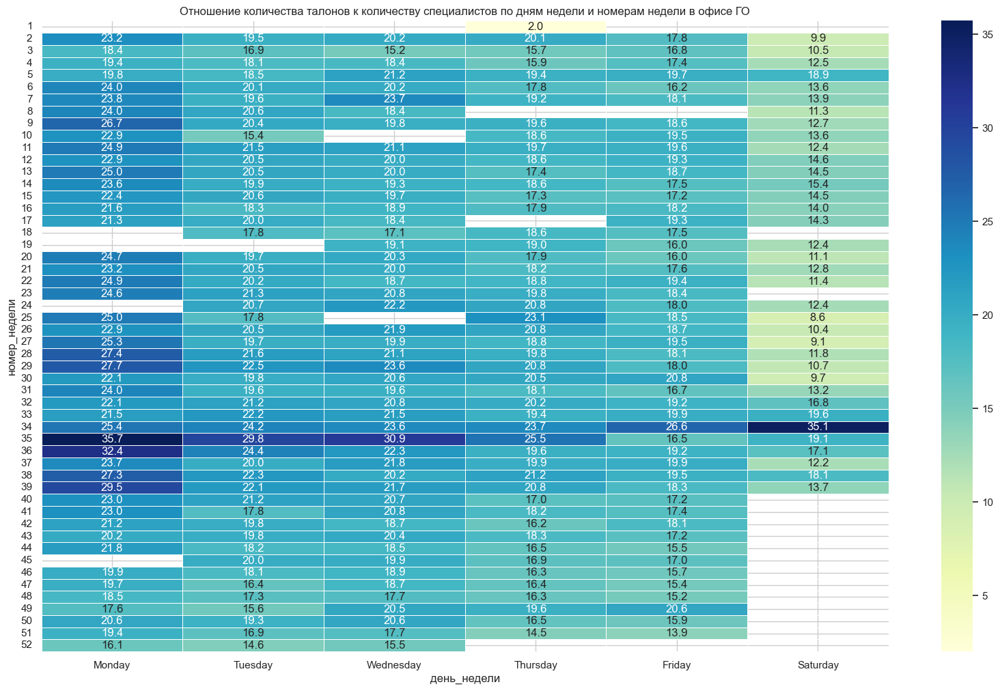

In [123]:
#соотношение
go_talons_per_operator = go_heatmap / go_special

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(go_talons_per_operator, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)

#настройка
plt.title('Отношение количества талонов к количеству специалистов по дням недели и номерам недели в офисе ГО')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Как и на общей тепловой картей видно что нагрузка выросла к концу 34 недели и продолжалась до пятницы 35 недели. Но после 1 сентября, распределение стало близким к нормальному. 

#### heatmap по среднему ожиданию в очереди в минутах в офисе ГО

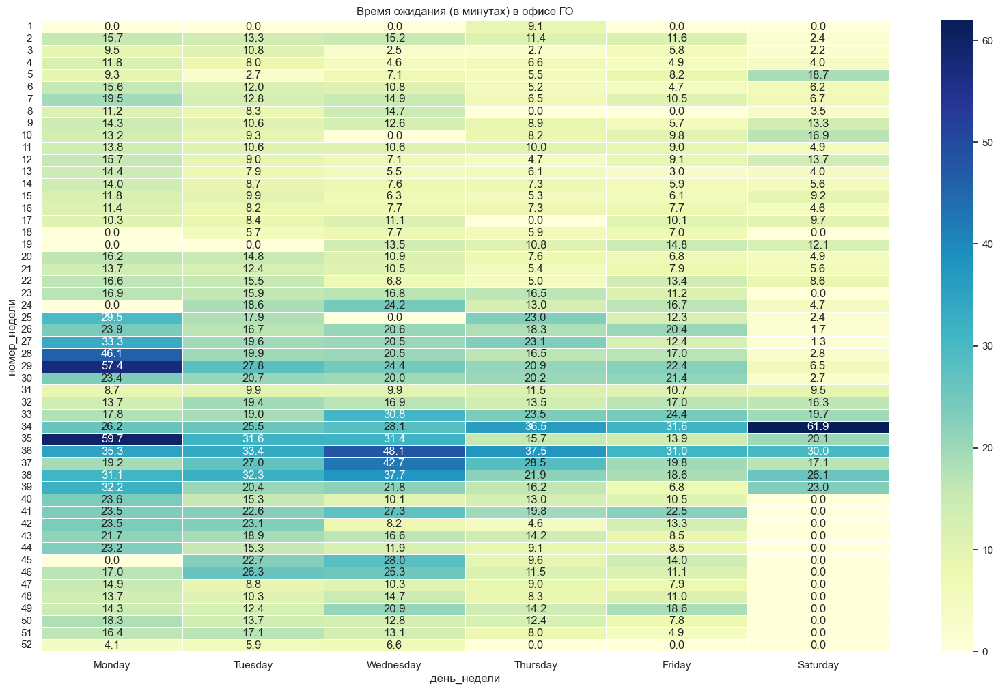

In [124]:
#таблица для тепловой карты
go_wait_heatmap = go_office.pivot_table(values='мин_ожидание', index='номер_недели', columns='день_недели', aggfunc='mean', fill_value=0)
go_wait_heatmap = go_wait_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(go_wait_heatmap, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)  

#настройка
plt.title('Время ожидания (в минутах) в офисе ГО')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Имеются крупные выбросы ожидания в очереди на которые стоит обратить внимание:
    * Конец 34 недели и 35 неделя (это конец августа)
    * Понедельники с 27 недели по 29. (начало июля)
* Так же стоит отметить что по средам среднее время ожидания выше чем во вторник, при почти равной нагрузке на одного сотрудника. 

### Сведения из офиса 123
#### heatmap по выдаче талонов в офисе 123

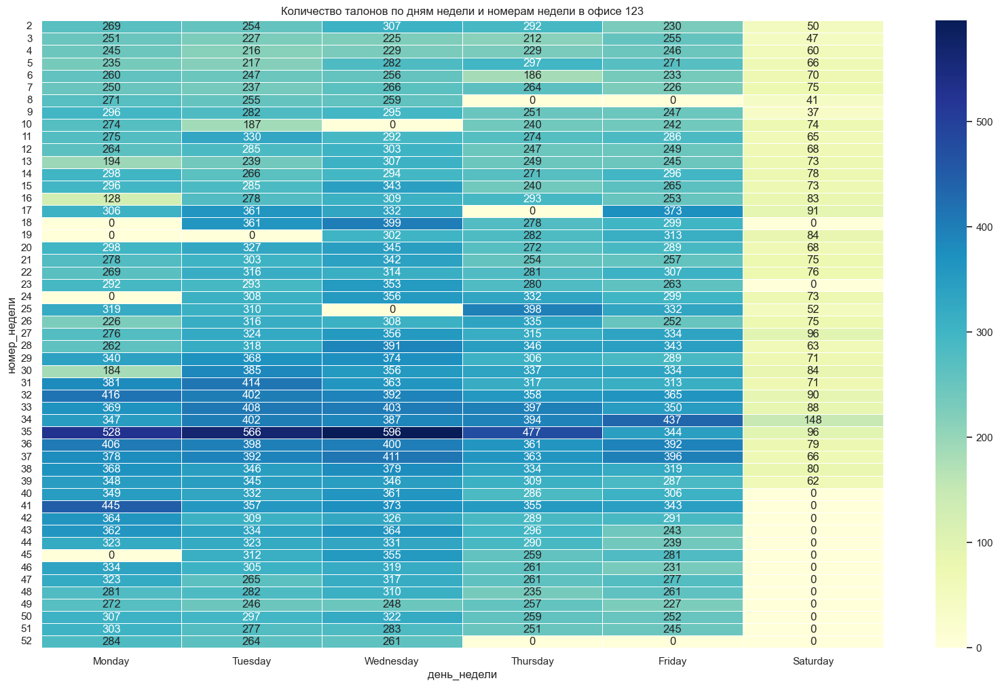

In [125]:
#таблица для тепловой карты
ott_heatmap = ott_office.pivot_table(values='номер_талона', index='номер_недели', columns='день_недели', aggfunc='count', fill_value=0)

#сортировка по дням недели
ott_heatmap = ott_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(ott_heatmap, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество талонов по дням недели и номерам недели в офисе 123')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Как и в офисе ГО мы видим затемнение на 35 неделе. Конец августа и начало сентября.
* Еще мы можем отметить что у офиса 123 такой же график как у ГО и начиная с 40 недели, режим работы сменился и офис перестал работать по субботам. Но в отличие от офиса ГО, мы тут не видим явного перераспределения нагрузки по другим дням. 

#### heatmap по количеству сотрудников  в офисе 123

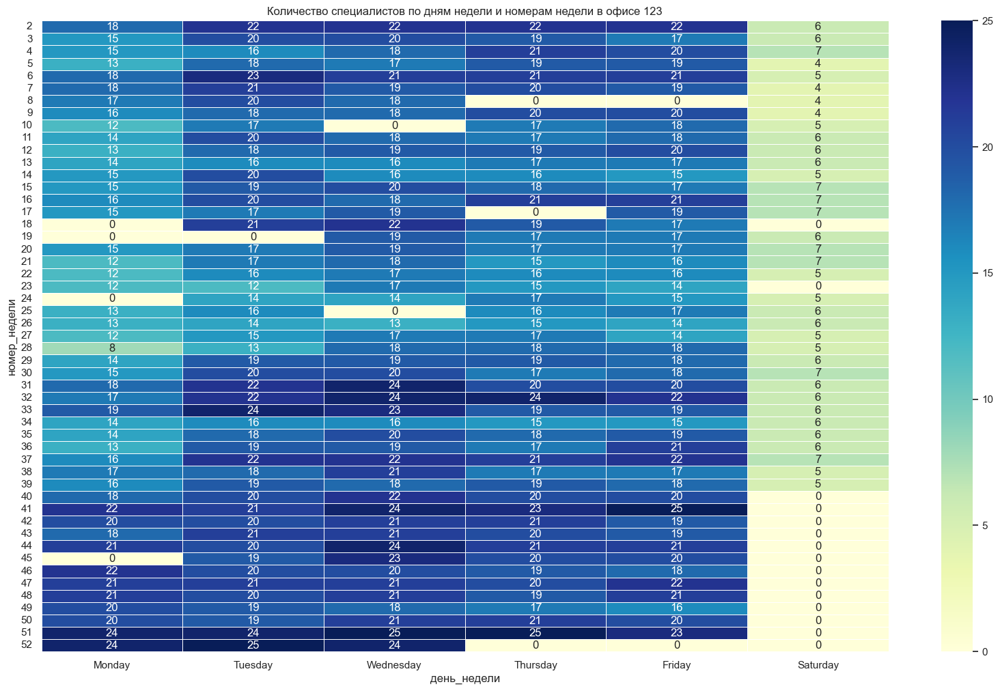

In [126]:
#таблица для тепловой карты
ott_special = ott_office.pivot_table(values='номер_оператора', index='номер_недели', columns='день_недели', aggfunc='nunique', fill_value=0)

#сортировка по дням недели
ott_special = ott_special[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(ott_special, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество специалистов по дням недели и номерам недели в офисе 123')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* К концу года штат был более укомплектован чем в середине года. 
* Сотрудники с субботы переместились на понедельник начиная с 41 недели, хотя суббота нерабочая была уже на 40. Хотя возможны и отпуска сотрудников. 

#### heatmap по соотношению количества выданных талонов на количество сотрудников в этот день в офисе 123

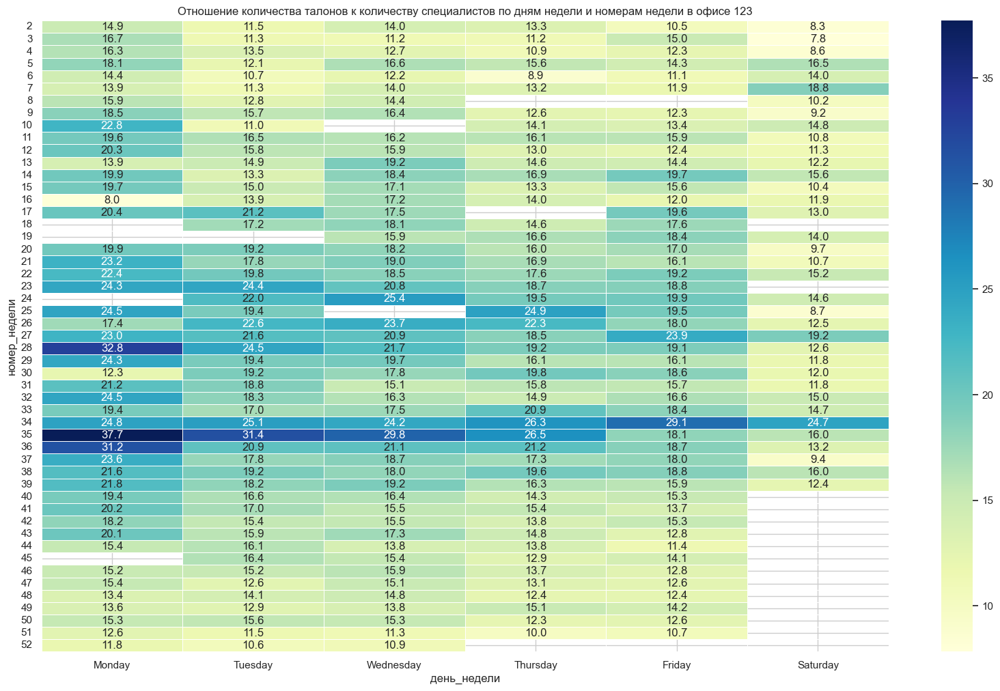

In [127]:
#соотношение
ott_talons_per_operator = ott_heatmap / ott_special

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(ott_talons_per_operator, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)

#настройка
plt.title('Отношение количества талонов к количеству специалистов по дням недели и номерам недели в офисе 123')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Наибольшая нагрузка на сотрудника видна в летние месяцы. Особенно хорошо выделяется конец августа, а именно 34-35 недели. 

#### heatmap по среднему ожиданию в очереди в минутах в офисе 123

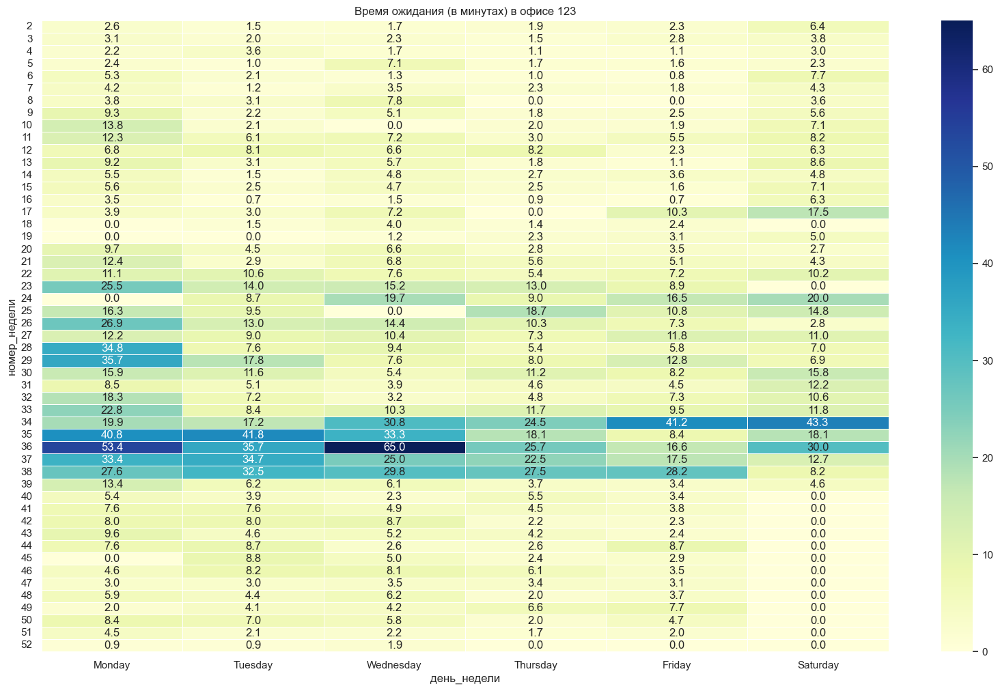

In [128]:
#таблица для тепловой карты
ott_wait_heatmap = ott_office.pivot_table(values='мин_ожидание', index='номер_недели', columns='день_недели', aggfunc='mean', fill_value=0)
ott_wait_heatmap = ott_wait_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(ott_wait_heatmap, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)  

#настройка
plt.title('Время ожидания (в минутах) в офисе 123')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Начиная с 34 заканчивая 38 неделей, т.е. с 21 августа по 22 сентября, в офисе 123 виден значительный рост ожидания в очереди. 

### Сведения из офиса ЯРИ
#### heatmap по выдаче талонов в офисе ЯРИ

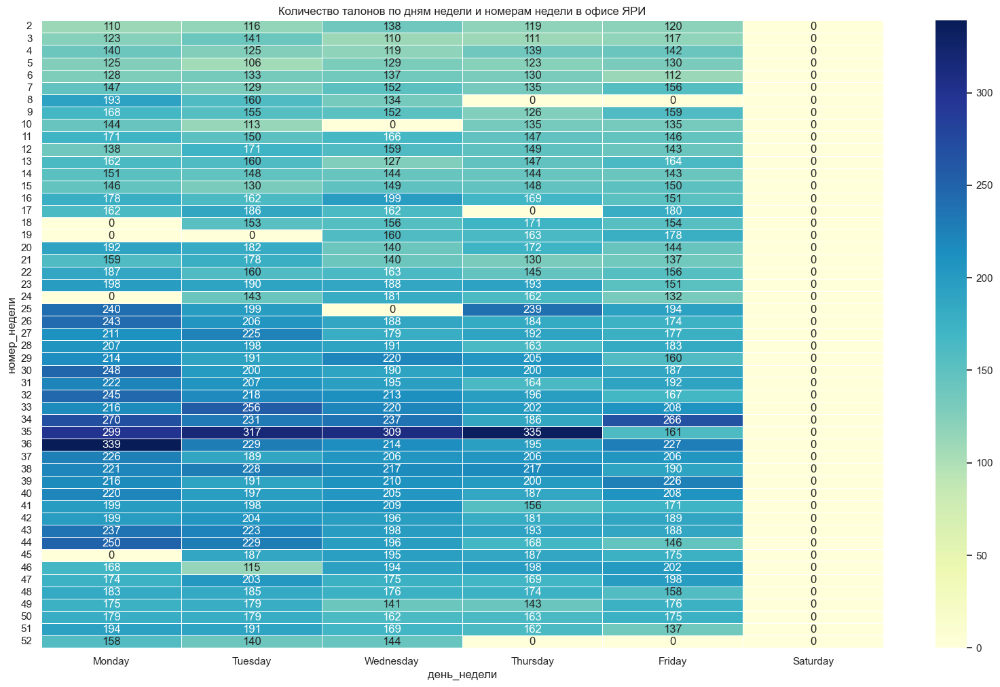

In [129]:
#таблица для тепловой карты
yari_heatmap = yari_office.pivot_table(values='номер_талона', index='номер_недели', columns='день_недели', aggfunc='count', fill_value=0)

#сортировка по дням недели
yari_heatmap = yari_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(yari_heatmap, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество талонов по дням недели и номерам недели в офисе ЯРИ')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Во второй половине года в офисе ЯРИ наблюдается выдача большего количества талонов. 
* Самой нагруженной неделей выдалась 35 неделя (конец августа). 

#### heatmap по количеству сотрудников  в офисе ЯРИ

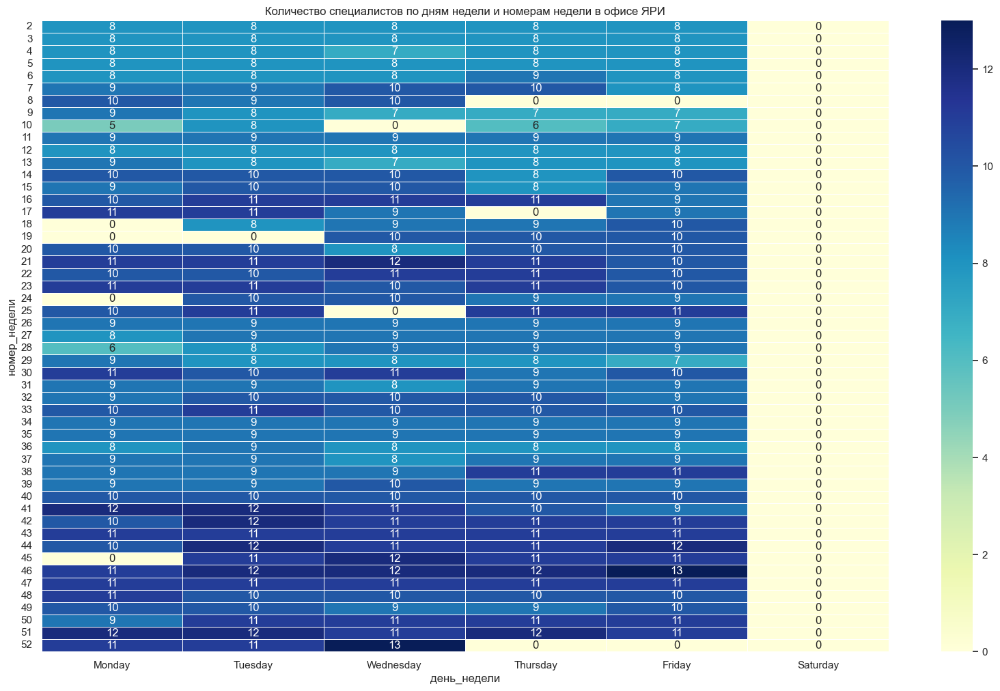

In [130]:
#таблица для тепловой карты
yari_special = yari_office.pivot_table(values='номер_оператора', index='номер_недели', columns='день_недели', aggfunc='nunique', fill_value=0)

#сортировка по дням недели
yari_special = yari_special[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(yari_special, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество специалистов по дням недели и номерам недели в офисе ЯРИ')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Цветовая гамма говорит о том что во второй половине года больше сотрудников в офисе. 

#### heatmap по соотношению количества выданных талонов на количество сотрудников в этот день в офисе ЯРИ

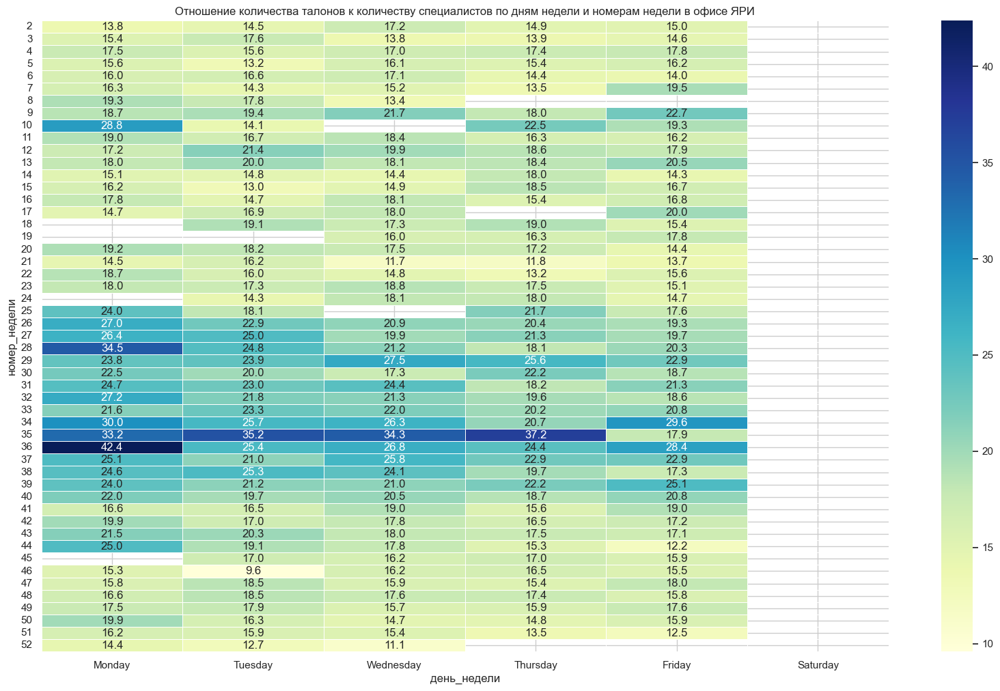

In [131]:
#соотношение
yari_talons_per_operator = yari_heatmap / yari_special

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(yari_talons_per_operator, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)

#настройка
plt.title('Отношение количества талонов к количеству специалистов по дням недели и номерам недели в офисе ЯРИ')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Как и везде очень хорошо видна 34-36 недели, где нагрузка на специалиста повышается. 
* Так же тут мы видим что повышенная грузка видна летом и в сентябре, а в особенности по понедельникам.

#### heatmap по среднему ожиданию в очереди в минутах в офисе ЯРИ

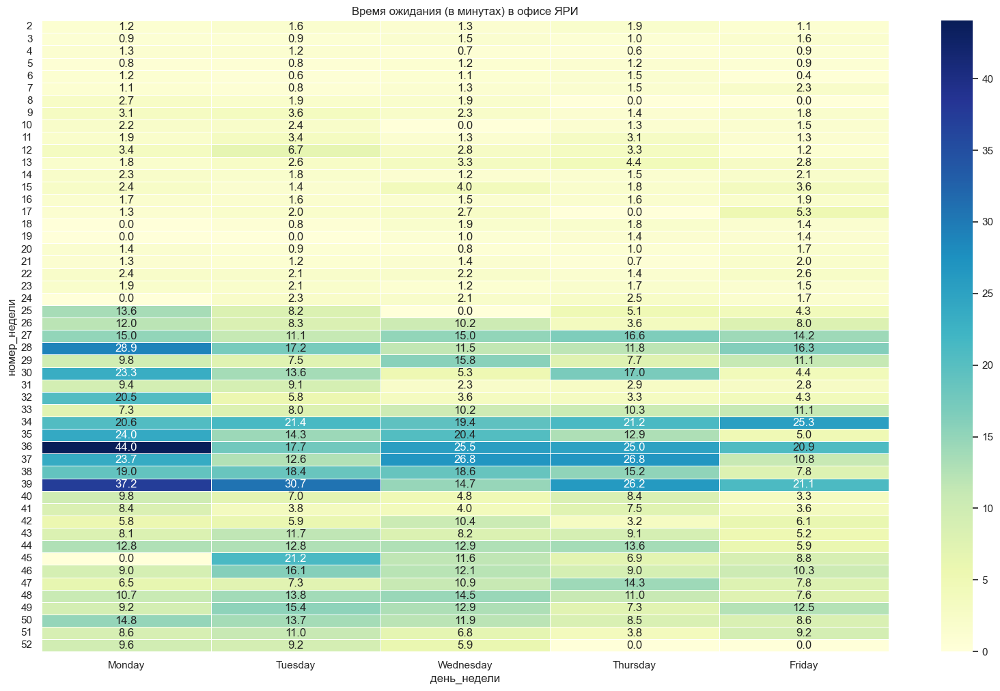

In [132]:
#таблица для тепловой карты
yari_wait_heatmap = yari_office.pivot_table(values='мин_ожидание', index='номер_недели', columns='день_недели', aggfunc='mean', fill_value=0)
#yari_wait_heatmap = yari_wait_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(yari_wait_heatmap, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)  

#настройка
plt.title('Время ожидания (в минутах) в офисе ЯРИ')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Увеличение среднего времени ожидания в очереди наблюдается с 25 недели (с 19 июня), резкий спад и некоторая стабилизация происходит с 40 недели (с 2 октября).

### Сведения из офиса ЖОР
#### heatmap по выдаче талонов в офисе ЖОР

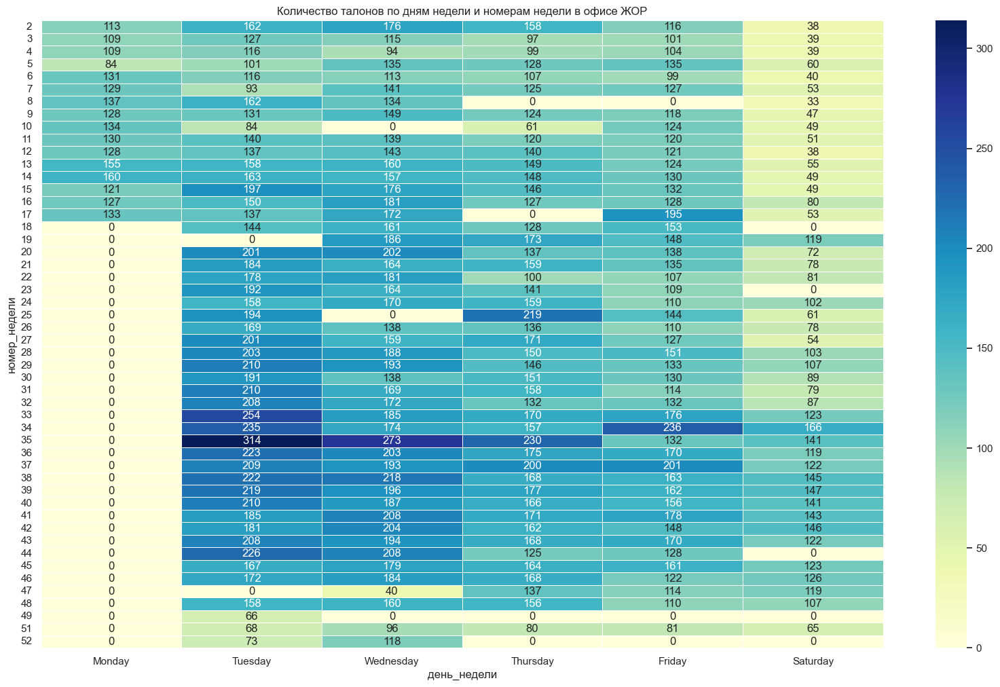

In [133]:
#таблица для тепловой карты
jor_heatmap = jor_office.pivot_table(values='номер_талона', index='номер_недели', columns='день_недели', aggfunc='count', fill_value=0)

#сортировка по дням недели
jor_heatmap = jor_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(jor_heatmap, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество талонов по дням недели и номерам недели в офисе ЖОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Количество выданных талонов, как и везде, высока на 35 неделе. Но при этом стоит отметить что выглядит так, как будто во второй половине офис ЖОР выдавал больше талонов, чем в первую. 

#### heatmap по количеству сотрудников  в офисе ЖОР

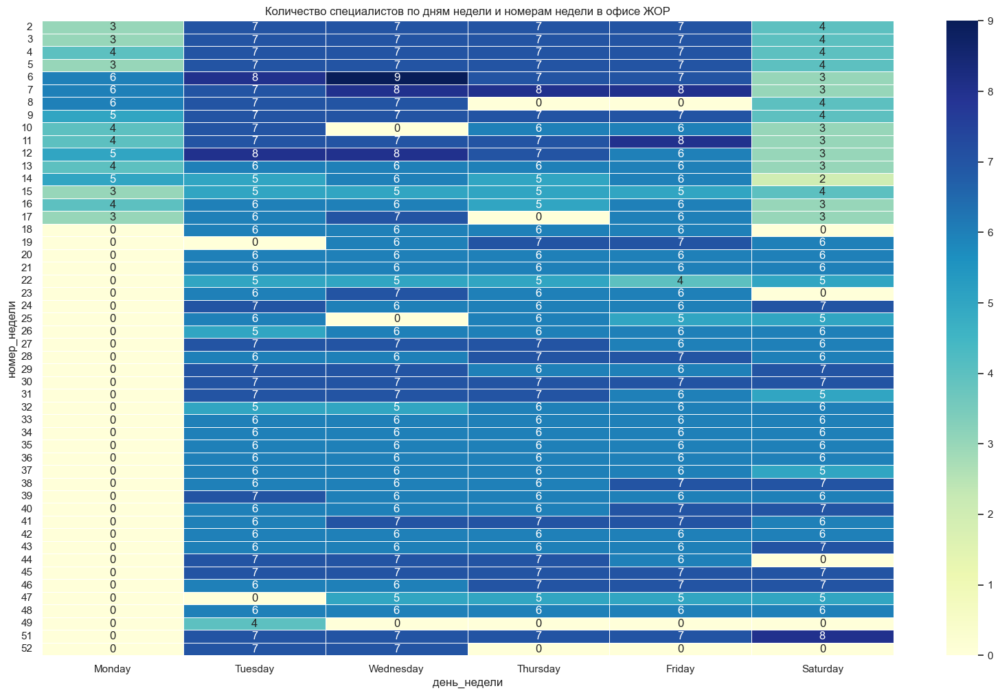

In [134]:
#таблица для тепловой карты
jor_special = jor_office.pivot_table(values='номер_оператора', index='номер_недели', columns='день_недели', aggfunc='nunique', fill_value=0)

#сортировка по дням недели
jor_special = jor_special[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(jor_special, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество специалистов по дням недели и номерам недели в офисе ЖОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Большую чатсь года в офисе работает 6 сотрудников. 

#### heatmap по соотношению количества выданных талонов на количество сотрудников в этот день в офисе ЖОР

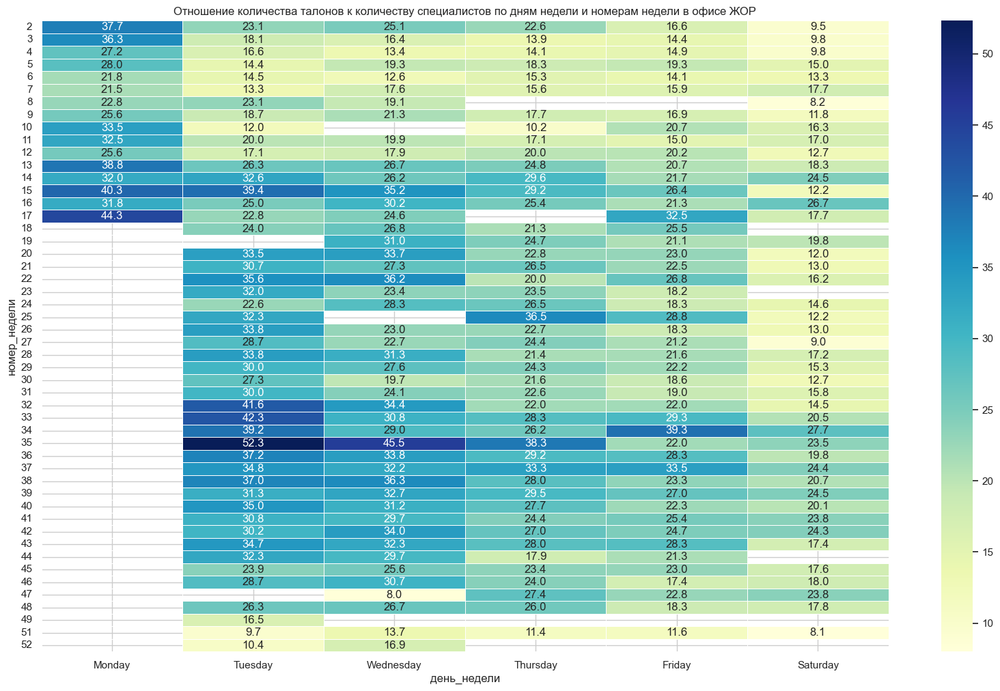

In [135]:
#соотношение
jor_talons_per_operator = jor_heatmap / jor_special

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(jor_talons_per_operator, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)

#настройка
plt.title('Отношение количества талонов к количеству специалистов по дням недели и номерам недели в офисе ЖОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Количество талонов на одного специалиста в офисе ЖОР одни из самых высоких. Во вторник 35 недели (29 августа) пришлось 52 талона на одного специалиста. Да и в целом нагрузка на сотрудников офиса ЖОР выглядит самой высокой. 
* Необходимо рекомендовать заказчику увеличить количество сотрудников в данном офисе или иными усилиями уменьшить нагрузку на сотрудников данного офиса. Мы и ранее видели что данный офис наиболее загружен. 

#### heatmap по среднему ожиданию в очереди в минутах в офисе ЖОР

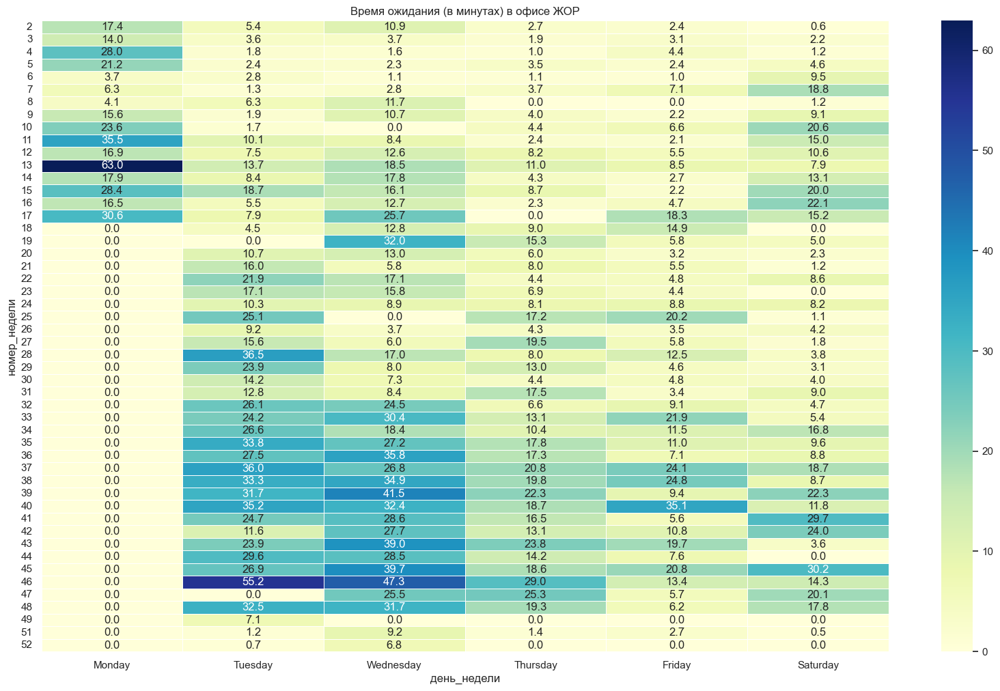

In [136]:
#таблица для тепловой карты
jor_wait_heatmap = jor_office.pivot_table(values='мин_ожидание', index='номер_недели', columns='день_недели', aggfunc='mean', fill_value=0)
#yari_wait_heatmap = yari_wait_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(jor_wait_heatmap, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)  

#настройка
plt.title('Время ожидания (в минутах) в офисе ЖОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* В плане среднего ожидания, офис ЖОР не является образцом стабильности. Но в первой половине недели очереди чаще ожидают дольше. Наибольший показатель был достигнут в понедельник 13 недели (27 марта) и достиг 63 минут. Что удивительно наибольшая нагрузка в 35 неделю, которая наблюдается во всех офисах, не особо поменяла ситуацию в офисе ЖОР.

### Сведения из офиса 203
#### heatmap по выдаче талонов в офисе 203

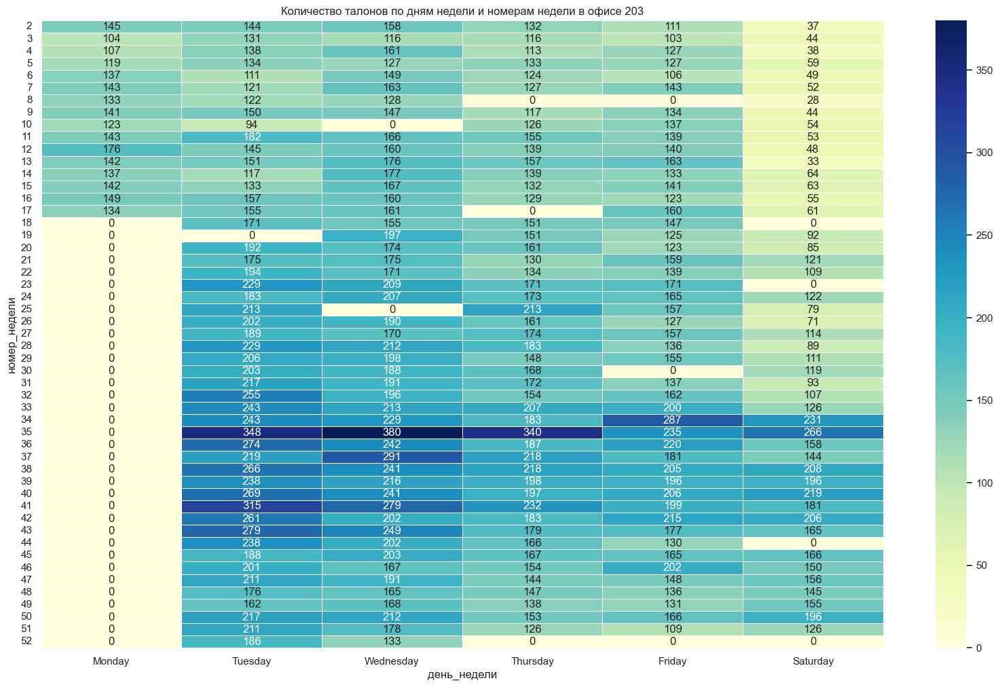

In [137]:
#таблица для тепловой карты
tzt_heatmap = tzt_office.pivot_table(values='номер_талона', index='номер_недели', columns='день_недели', aggfunc='count', fill_value=0)

#сортировка по дням недели
tzt_heatmap = tzt_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(tzt_heatmap, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество талонов по дням недели и номерам недели в офисе 203')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Офис 203 показвает довольно стабильные результаты по выдаче талонов, постепенно увеличивая этот показатель в течении всего года. Но впрочем как и везде конец августа, а именно 35 неделя выделяется по количеству выданных талонов. 


#### heatmap по количеству сотрудников  в офисе 203

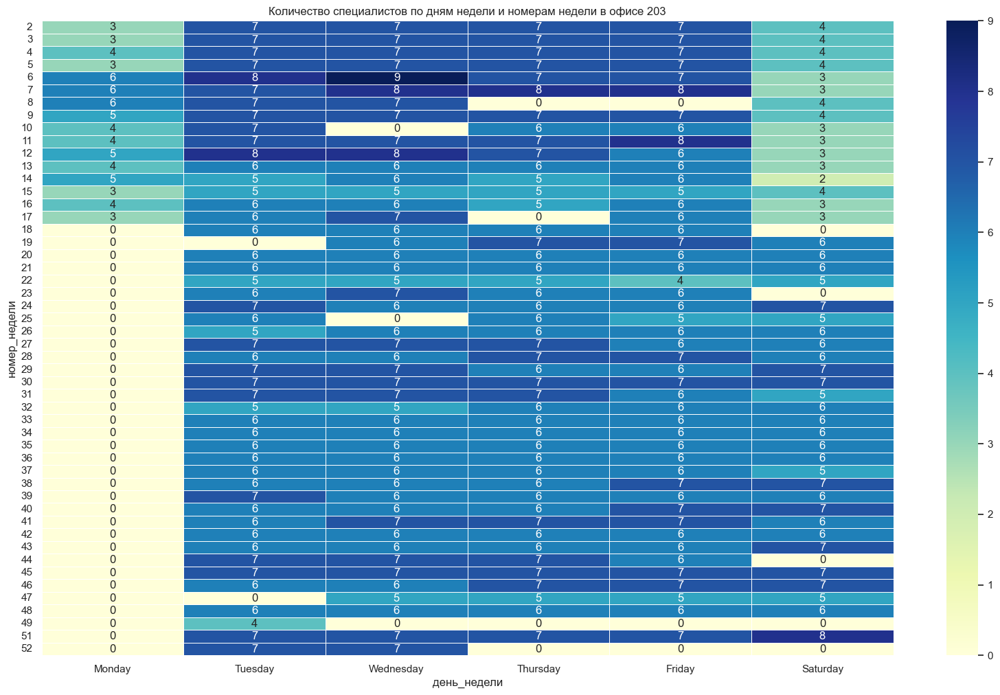

In [138]:
#таблица для тепловой карты
tzt_special = tzt_office.pivot_table(values='номер_оператора', index='номер_недели', columns='день_недели', aggfunc='nunique', fill_value=0)

#сортировка по дням недели
tzt_special = tzt_special[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(jor_special, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество специалистов по дням недели и номерам недели в офисе 203')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* В офисе 203, в большинстве своем 6-7 сотрудников. 

#### heatmap по соотношению количества выданных талонов на количество сотрудников в этот день в офисе 203

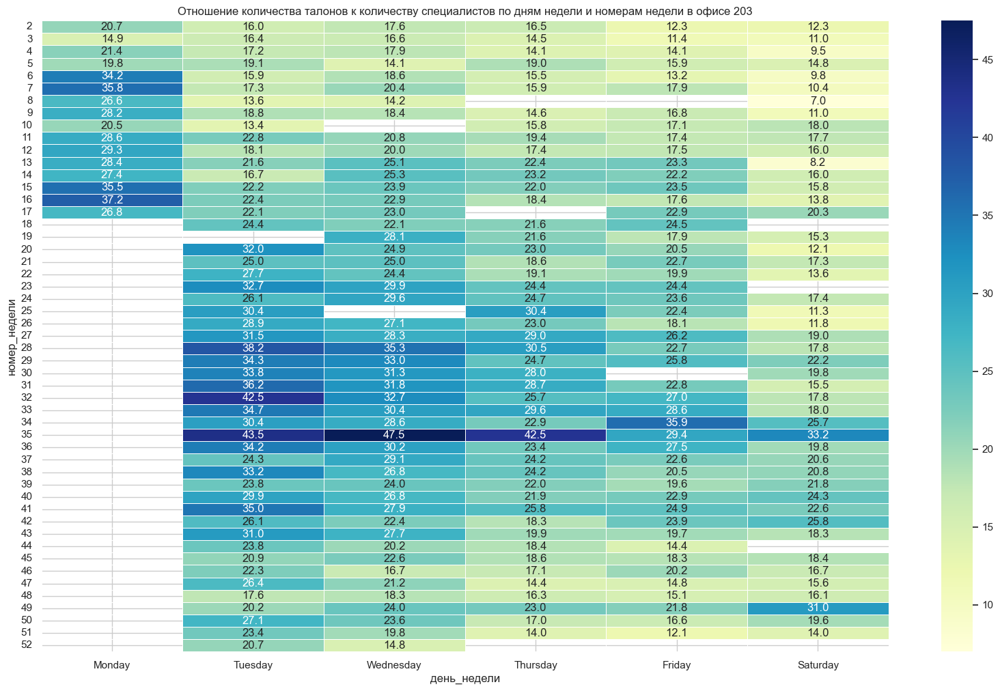

In [139]:
#соотношение
tzt_talons_per_operator = tzt_heatmap / tzt_special

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(tzt_talons_per_operator, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)

#настройка
plt.title('Отношение количества талонов к количеству специалистов по дням недели и номерам недели в офисе 203')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Наиболее нагруженные дни в офисе 203, это начало недели. Особенно высокая нагрузка наблюдается летом, начиная с 20 недели. 

#### heatmap по среднему ожиданию в очереди в минутах в офисе 203

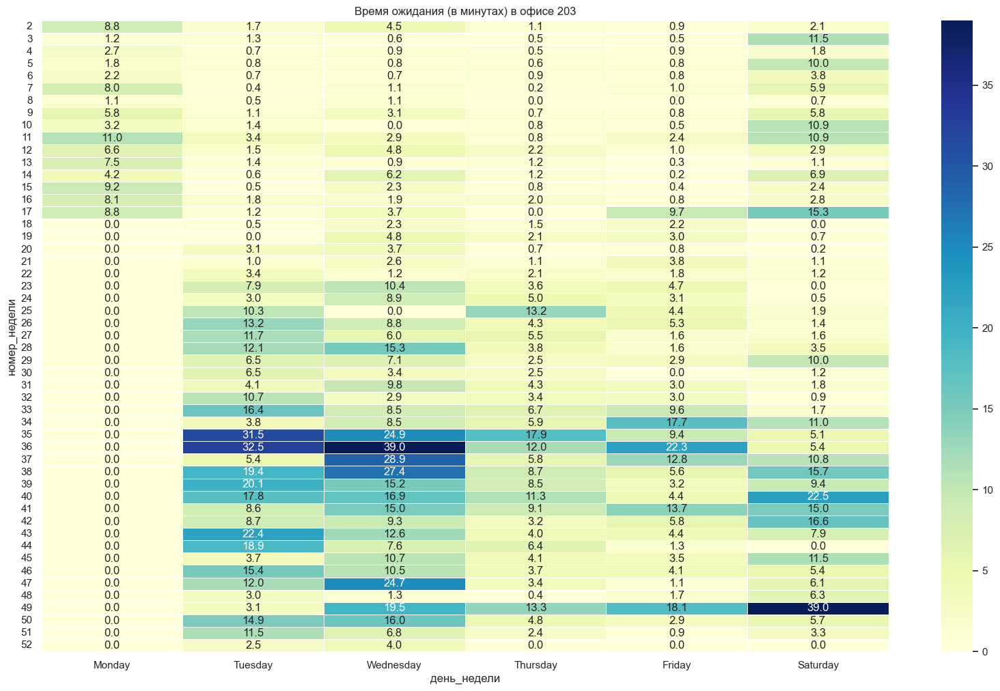

In [140]:
#таблица для тепловой карты
tzt_wait_heatmap = tzt_office.pivot_table(values='мин_ожидание', index='номер_недели', columns='день_недели', aggfunc='mean', fill_value=0)
#yari_wait_heatmap = yari_wait_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(tzt_wait_heatmap, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)  

#настройка
plt.title('Время ожидания (в минутах) в офисе 203')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Среднее ожидаение в очереди увеличивается в конце августа, а именно с конца 34 неделя, и периодически среднее ожидание повышается. 

### Сведения из офиса ДОР
#### heatmap по выдаче талонов в офисе ДОР

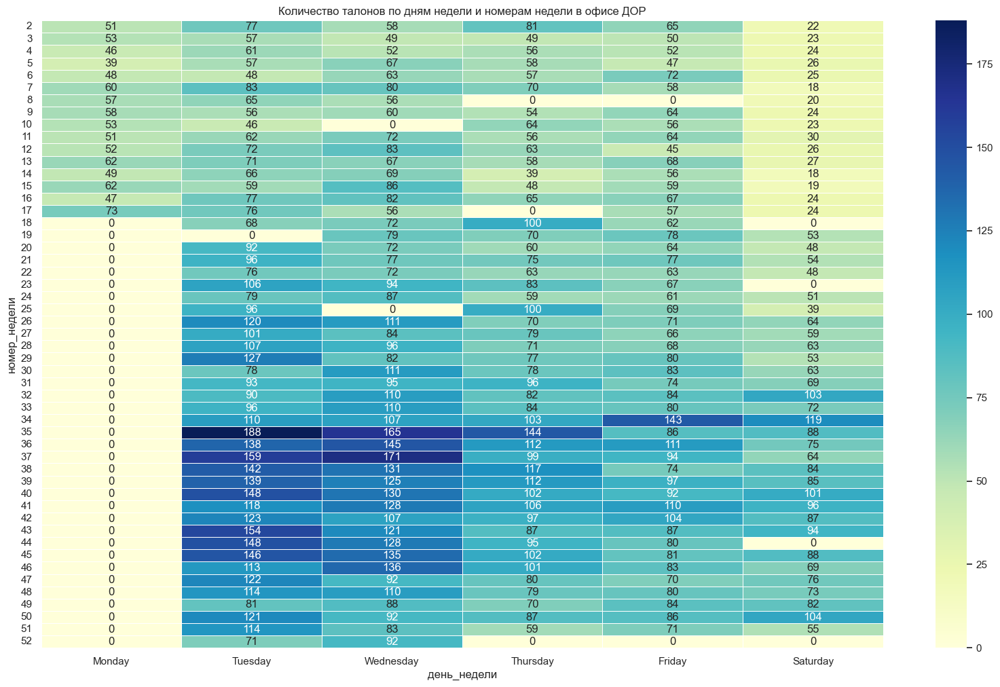

In [141]:
#таблица для тепловой карты
dor_heatmap = dor_office.pivot_table(values='номер_талона', index='номер_недели', columns='день_недели', aggfunc='count', fill_value=0)

#сортировка по дням недели
dor_heatmap = dor_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(dor_heatmap, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество талонов по дням недели и номерам недели в офисе ДОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Количество выдаваемых талонов вырослов во второй половине года. Наибольшее количество талонов выдавалось в конце августа, начиная с 35 недели, и в сентябре до 40 недели, далее идет некоторый спад до конца года. 

#### heatmap по количеству сотрудников  в офисе ДОР

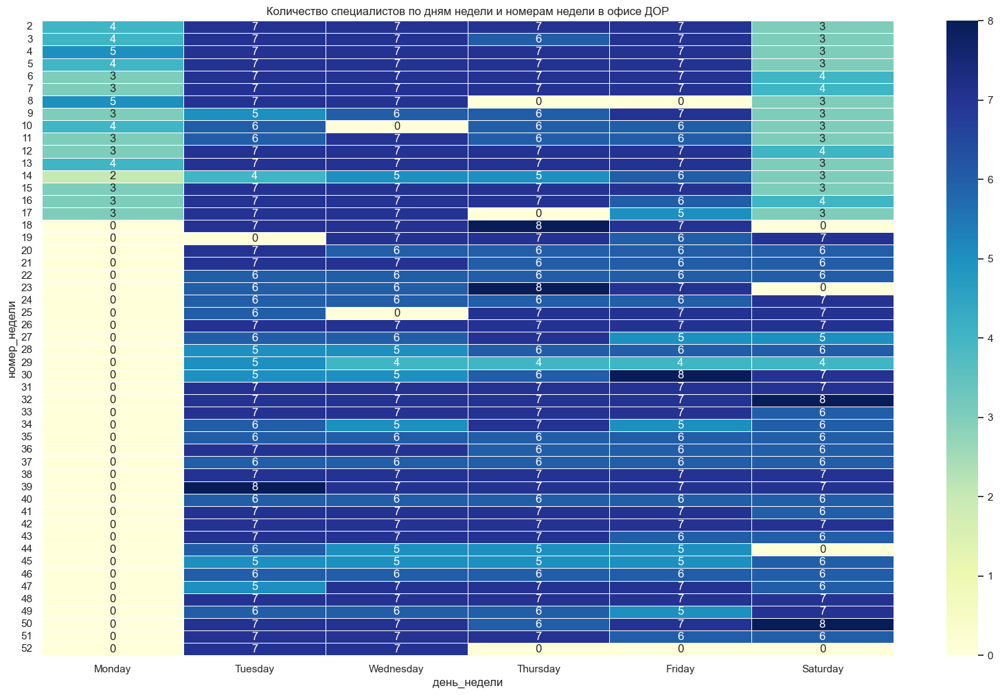

In [142]:
#таблица для тепловой карты
dor_special = dor_office.pivot_table(values='номер_оператора', index='номер_недели', columns='день_недели', aggfunc='nunique', fill_value=0)

#сортировка по дням недели
dor_special = dor_special[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(dor_special, cmap="YlGnBu", annot=True, fmt='d', linewidths=.5)

#настройка
plt.title('Количество специалистов по дням недели и номерам недели в офисе ДОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Количество сотрудников почти всегда около 6-7, а порой и 8 сотрудников.

#### heatmap по соотношению количества выданных талонов на количество сотрудников в этот день в офисе ДОР

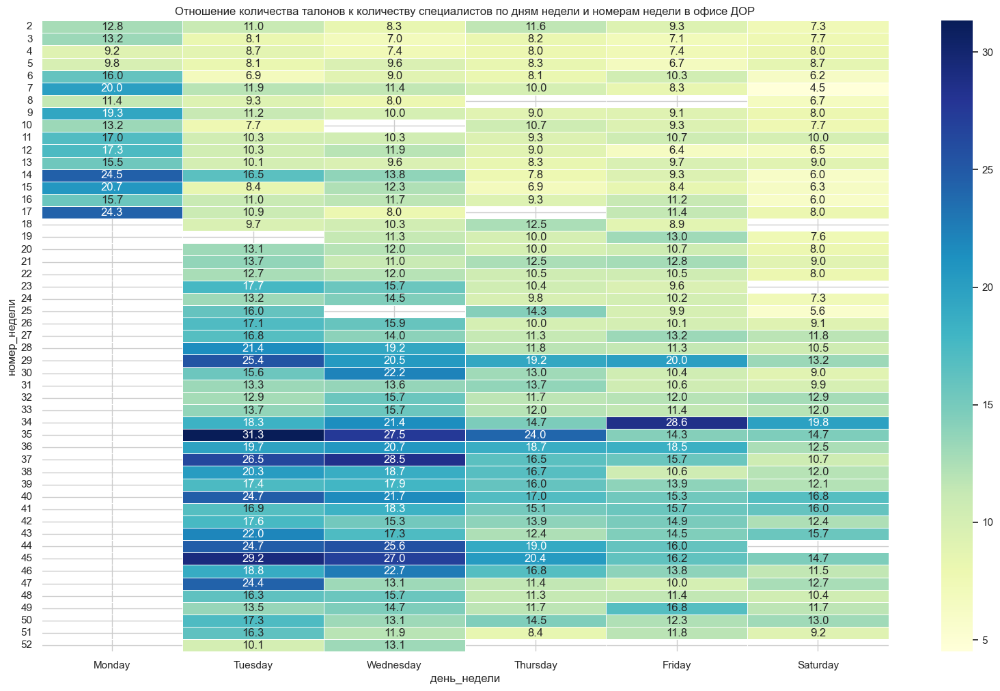

In [143]:
#соотношение
dor_talons_per_operator = dor_heatmap / dor_special

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(dor_talons_per_operator, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)

#настройка
plt.title('Отношение количества талонов к количеству специалистов по дням недели и номерам недели в офисе ДОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Увеличение нагрузки происходит постепенно с 20 недели. Что заметно как и в других офисах, основная нагрузка приходится на лето и сентябрь. В основном в первой половине недели. 

#### heatmap по среднему ожиданию в очереди в минутах в офисе ДОР

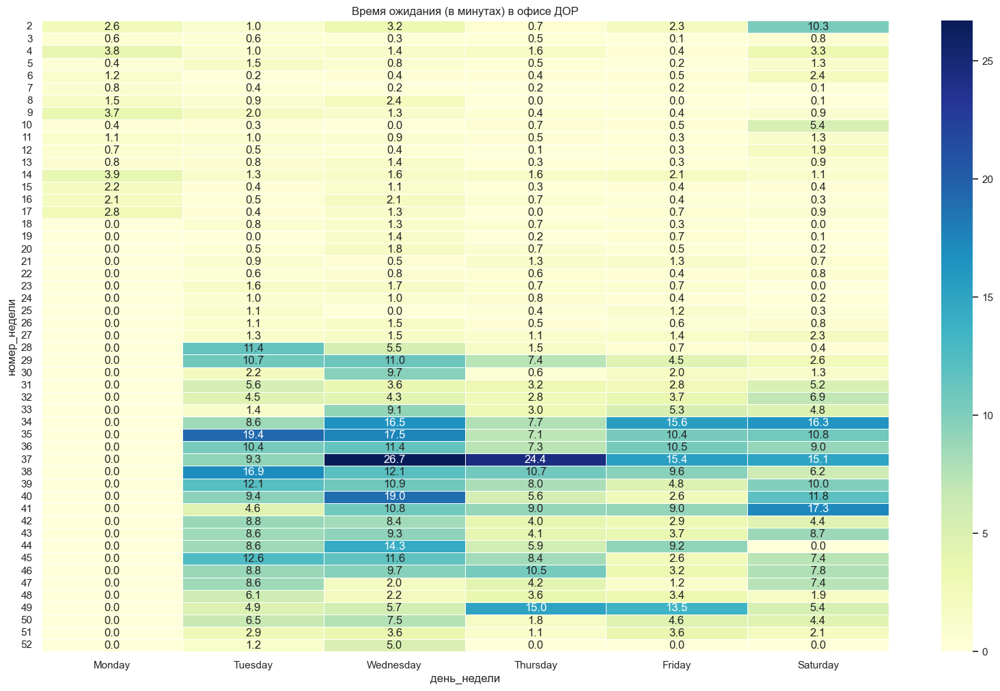

In [144]:
#таблица для тепловой карты
dor_wait_heatmap = dor_office.pivot_table(values='мин_ожидание', index='номер_недели', columns='день_недели', aggfunc='mean', fill_value=0)
#yari_wait_heatmap = yari_wait_heatmap[order_days]

#heatmap
plt.figure(figsize=(20, 12))
heatmap = sns.heatmap(dor_wait_heatmap, cmap="YlGnBu", annot=True, fmt='.1f', linewidths=.5)  

#настройка
plt.title('Время ожидания (в минутах) в офисе ДОР')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
plt.show()

* Как и везде увеличение ожидания в очереди происходит начиная с 35 недели (конец августа). 

# Выводы и рекомендации
## Выводы

* Мы ознакомились с датасетом project_q2, который ранее подготовили из файла выгрузки, скрыв персональные данные сотрудников и клиентов, а также зашифровав наименования талонов с названиями офисов. Датасет изначально имел 456629 строк и 16 столбцов. 
* При предобработке данных нами:
    * Удалены операторы 6, 74, 75, 76, 77, 119, а так же офис ВИН, так они не нужны заказчику. 
    * Обнаружены пропуски в нижеприведенных столбцах и полностью заполнены, т.к. мы знаем исходные данные.
        * вызван_на_обслуживание            248
        * время_начала_обслуживания       30107
        * время_окончания_обслуживания       32
    * Привели наименования столбцов к змеиному шрифту заменив пробелы на нижние подчеркивания, а также приведя к нижнему регистру
    * Столбцы даты и времени:
        * 'регистрация', 'вызван_на_обслуживание', 'время_начала_обслуживания', 'время_окончания_обслуживания' - приведены к типу datetime64
        * 'дата', 'день_недели', 'номер_недели', 'месяц' - добавлены новые столбцы для дальнешейго применения в работе
        * 'ожидание', 'ожидание_подхода_клиента', 'обслуживание' - приведены к типу timedelta64
        * 'сек_ожидание', 'сек_ожидание_подхода_клиента', 'сек_обслуживание', 'мин_ожидание ', 'мин_ожидание_подхода_клиента', 'мин_обслуживание ' - созданы новые столбцы для дальнейшего применения в работе
    * С выбросами не стали ничего делать т.к. 1060 строк не сильно повлияют на наше исследование. Но все же исправили излишки времени ожидания клиента, перекинув часть времени в обслуживание. 
    * После предобработки данных у нас осталось 450 939 строк, но стало 26 столбцов. 
* Анализ по популярности талонов показал нам следующее:
    * Самые часто встречающиеся талоны в тройках лидеров:
        * 1B20, П9, T30 являются наиболее часто встречающимися талонами в тройках лидеров по офисам ГО, 123, и ДОР.
        * В офисах ЯРИ, ЖОР и 203 встречаются вариации, но T30 сохраняет свою популярность.
    * Порядок талонов в тройках лидеров:
        * 1B20 часто встречается на первом месте в тройках лидеров (ГО, 123, ЖОР, ДОР).
        * В офисах ЯРИ и 203 T30 занимает первую позицию.
        * П9 чаще всего располагается на второй позиции, за исключением офиса ЖОР, где это могут быть 1B20 или 1У54.
    * Время ожидания и обслуживания:
        * 1B20: Время ожидания 5-6 минут, обслуживание 7-8 минут.
        * П9: Время ожидания 5-7 минут, обслуживание 38-39 минут.
        * T30: Время ожидания 14-47 минут, обслуживание 25-32 минут.
        * B31 (в ЯРИ): Время ожидания 5 минут, обслуживание 7 минут.
        * ЮЛ86 (в ЯРИ): Время ожидания 4 минуты, обслуживание 37 минут.
        * 1У54: Время ожидания 8 минут, обслуживание 6 минут.
    * Общие наблюдения:
        * Талоны 1B20 и П9 наиболее стабильно занимают верхние позиции в тройках лидеров, независимо от офиса.
        * T30, хотя и популярен, может иметь относительно высокое время ожидания и обслуживания, что требует внимания.
* Количество выданных талонов и обслуженных талонов показывает следующее
    * Выданные талоны:
        * Офис ГО (51.6%): Выдано 232 677 талонов, среднее 4230.49 талонов на окно.
        * Офис 123 (17%): Выдано 77 402 талона, среднее 2977.00 талонов на окно.
        * Офис ЯРИ (9%): Выдано 43 199 талонов, среднее 3599.92 талонов на окно.
        * Офис 203 (9%): Выдано 41 977 талонов, среднее 4664.11 талонов на окно.
        * Офис ЖОР (7%): Выдано 35 149 талонов, среднее 5021.29 талонов на окно.
        * Офис ДОР (4.55%): Выдано 20 535 талонов, среднее 2933.57 талона на окно.
    * Обслуженные талоны:
        * Офис ГО: Обслужено 214 651 талонов, среднее 3902.75 талонов на окно.
        * Офис 123: Обслужено 74 099 талонов, среднее 2849.96 талонов на окно.
        * Офис ЯРИ: Обслужено 40 146 талонов, среднее 3345.50 талонов на окно.
        * Офис 203: Обслужено 38 786 талонов, среднее 4309.56 талонов на окно.
        * Офис ЖОР: Обслужено 32 411 талонов, среднее 4630.14 талонов на окно.
        * Офис ДОР: Обслужено 19 601 талонов, среднее 2800.14 талона на окно.
* Помесячный обзор показывает следующее
    * Тепловая карта среднего времени ожидания:
        * Все офисы обычно демонстрируют увеличение времени ожидания летом, с пиком в августе и сентябре.
        * Офис ЖОР выделяется пиковым ожиданием в ноябре, что отличается от общей тенденции.
    * Тепловая карта соотношения талонов на оператора:
        * Наблюдается увеличение нагрузки во всех офисах в августе, особенно в ЖОР, где повышенная нагрузка продолжается с апреля по октябрь.
        * Линейный график по количеству обслуженных талонов:
        * Общий пик обслуженных талонов приходится на август, с минимальными значениями в начале и конце года.
    * Общие выводы помесячного обзора:
        * Офис ЖОР, несмотря на относительно небольшое количество выданных талонов, имеет самую высокую нагрузку на окно и выделяется пиковым временем ожидания.
        * Офис ГО, хотя и лидирует по количеству выданных талонов, имеет более умеренную нагрузку на окно.
        * Тепловые карты и графики подтверждают сезонные колебания в количестве талонов и времени ожидания, показывая пиковые нагрузки к августу и сентябрю, при этом показывая низкий спрос как в начале года так и в конце. 
* Количество талонов по дням недели:
    * Прежде всего нужно отметить что все рассматриваемые офисы разные. Как по размеру и количеству персонала в нем, так и расположением и проходимостью включая так же и разные графики работы этих офисов, сделано это было для максимального комфорта для клиентов исходя из производственных возможностей. 
    * Общая динамика:
        * Вторник и среда являются самыми популярными днями у клиентов, на них приходится более 21% выданных талонов на каждый из этих дней, т.е. в сумме они занимают почти половину всех выданных за неделю талонов. 
        * Суббота является наименее популярным днем с менее чем 5% от общего числа талонов.
    * Офис ГО:
        * В среду и вторник выдано наибольшее количество талонов. Возможно, продленное рабочее время в среду способствует увеличению посещаемости.
        * Суббота отстает из-за сокращенного рабочего дня (в среднем до 5 000 талонов).
    * Офис 123:
        * График работы схож с офисом ГО, с выдачей максимального числа талонов в среду и вторник.
        * Суббота также имеет наименьшее количество выданных талонов (в среднем 2 648).
    * Офис ЯРИ:
        * Равномерное распределение талонов по дням недели с небольшим перевесом в понедельник.
        * Офис работает весь рабочий период недели, что способствует более равномерному распределению талонов.
    * Офисы ЖОР и 203:
        * Вторник является наиболее популярным днем, а суббота - наименее популярным.
        * Оба офиса имели тестовый режим работы в понедельник, что влияет на общую динамику.
    * Офис ДОР:
        * Вторник - самый популярный день, суббота - наименее популярный (2,652 талона), если не учитывать тестовый понедельник (861 талон).
    * Общие заключения:
        * Наиболее популярные дни у клиентов вторник и среда, при этом в среду график работы более удлиненный.
        * Наименее популярный день суббота, скорее всего изза сокращенного дня, а так же изза изменния графиков работы в крупных офисах, которые перестали работать в субботу. 
* Время ожидания по дням недели:       
    * Общие тренды:
        * Разброс ожидания в понедельник выше всего. Это отражается как в случае общего анализа, так и в рассмотрении каждого офиса отдельно.
        * Медианное ожидание наименьшее в пятницу. Пятница также имеет самое короткое среднее ожидание.
        * Наибольшее медианное ожидание наблюдается в понедельник. Это также подтверждается высоким средним ожиданием в этот день.
        * Вторник лучше среды по медианному и среднему ожиданию, хоть и немного, но учитывая что по количеству выданных талонов они почти наравне, это лучшее сравнение этих двух дней. 
    * Анализ по офисам:
        * Офис ГО: Разброс ожидания в понедельник высок, но среднее и медианное ожидание выше всего в понедельник.
        * Офис 123: Разброс значений ниже, чем в офисе ГО. Медианное ожидание во вторник лучше, чем в среду.
        * Офис ЯРИ: Низкий разброс и стабильное медианное ожидание, особенно в пятницу. Вторник средний и медианный лучше среды.
        * Офис ЖОР: Высокий разброс и долгие ожидания в среду. Вторник и среда имеют самые высокие средние и медианные ожидания.
        * Офис 203: Низкий разброс и крайне короткое медианное ожидание в пятницу. Среднее и медианное ожидание в среду выше.
        * Офис ДОР: Низкий разброс и впечатляюще низкое медианное ожидание в пятницу. Среднее и медианное ожидание в среду выше.
    * Обобщенно, офисы 203 и ДОР выделяются низким разбросом и короткими времени ожидания, особенно в пятницу. Офис ЖОР имеет более высокие значения и большой разброс, особенно в среду.
* Так же мы составили 4 вида тепловых карт(количество выданных талонов, количество сотрудников, соотношение талонов к сотрудникам и среднее время ожидания в очеред) разбитую по дням недели и по номерам недель за весь год, для всех офисах как по отдельности так и вместе. По ним мы увидели что:
    * Популярность дней недели(хоть мы и делали подобное обобщенное по дням недели, но в разбивке по неделям это выглядит нагляднее):
        * В общем, в офисах наблюдается следующий порядок популярности дней недели: вторник и среда лидируют, за ними идут четверг и пятница, затем понедельник, и суббота является наименее популярным днем.
        * Летом, особенно в конце августа (35 неделя), наблюдается повышенная активность, возможно, связанная с началом нового учебного года.
    * На графике так же хорошо видны выходные дни и изменения в графике работы, некоторые офисы работали по понедельникам потом перестали, а другие работали по субботам но потом перестали, это приводит к увеличению количества выданных талонов в другие дни недели.
    * Нагрузка в конкретных периодах:
        * Конец августа (35 неделя) выделяется по высокой нагрузке во всех офисах. Возможно, это связано с подготовкой к началу нового учебного года и увеличением потока клиентов.
        * Летние месяцы и сентябрь также характеризуются повышенной активностью, особенно в первой половине недели.
    * Среднее ожидание в очереди:
        * Среднее ожидание в очереди увеличивается в периоды повышенной активности, такие как конец августа.

## Практические рекомендации

* Учитывая всё вышеперечисленное мы можем рекомендовать:
    * Рассмотрение возможности увеличения штатного количества сотрудников в офисе ЖОР и улучшения условий труда (включая обновление орг.техники, а так же проведения опроса сотрудников офиса о возможных улучшениях) в данном офисе. Данный офис является абсолютным рекордсменом как в количестве выданных талонов на одного сотрудника, так и по ожиданию в очереди клиентами, что может отрицательно сказывается на клиентском опыте наших посетителей.
    * Мы видим, что количество выданных талонов во вторник (95 408 талонов, 21.15%) и среду (95 011 талонов, 21.06%) почти одинаково, однако среднее время ожидания в очереди меньше во вторник, составляя 13:27 по сравнению с 14:07 в среду. Таким образом, введение удлиненного графика работы во все дни недели, подобно среде, без увеличения производственных возможностей, вероятно, приведет к увеличению среднего времени ожидания в очереди. Это, в свою очередь, может негативно сказаться на клиентском опыте посетителей. Однако, стоит отметить, что удлинение графика работы способствует расширению возможностей для клиентов, что, безусловно, является нашим приоритетом.
    * При планировании отпусков следует учесть что в августе и сентябре зафиксированы наибольшие пики активности клиентов, поэтому важно учитывать сезонность данного явления. 
    * Так же просим рассмотреть возможность дополнительной автоматизации процессов, для освобождения сотрудников от рутинных задач. А также возможно, изменить технологические процессы.